In [105]:
import os

QUANTILES = [0.01, 0.1, 0.2, 0.5, 0.8, 0.9, 0.99] 

SPLIT = 0.9         # train/test %

FIGSIZE = (9, 6)


qL1, qL2 = 0.01, 0.10        # percentiles of predictions: lower bounds
qU1, qU2 = 1-qL1, 1-qL2,     # upper bounds derived from lower bounds
label_q1 = f'{int(qU1 * 100)} / {int(qL1 * 100)} percentile band'
label_q2 = f'{int(qU2 * 100)} / {int(qL2 * 100)} percentile band'

In [106]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import sys
import missingno as mno
import pywt
import warnings
warnings.filterwarnings("ignore")
import logging
logging.disable(logging.CRITICAL)
import random
import numpy as np
import torch
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
from darts import TimeSeries, concatenate
from darts.dataprocessing.transformers import Scaler
from darts.models import TransformerModel, NBEATSModel, NHiTSModel, XGBModel, RNNModel, BlockRNNModel, TFTModel
from darts.models import AutoARIMA, LinearRegressionModel, RegressionEnsembleModel
from darts.utils.statistics import check_seasonality, plot_acf, plot_residuals_analysis
from darts.metrics import mape, rmse, smape
from darts.utils.timeseries_generation import datetime_attribute_timeseries
from darts.utils.likelihood_models import QuantileRegression
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning.tuner import lr_finder
import pytorch_lightning as pl
pl.seed_everything(42, workers=True)
pd.set_option("display.precision",2)
np.set_printoptions(precision=2, suppress=True)
pd.options.display.float_format = '{:,.2f}'.format

In [107]:
xls = pd.ExcelFile('df_radon_combined.xlsx')

df_radon = {}
for num in xls.sheet_names[2:]:
    df_radon[num] = pd.read_excel(xls, num) 

#remove these indexes
devices = ['1', '2', '5', '9', '17', '23', '27', '28', '36', '44', '48']
for key in list(df_radon):
    if key in devices:
        del df_radon[key]

for key in df_radon:
    print(key)
    df_radon[key]['SyncDate'] = pd.to_datetime(df_radon[key]['SyncDate'])
    print(f"{df_radon[key]['SyncDate'].min()} - {df_radon[key]['SyncDate'].max()}")
    df_radon[key].sort_values(by='SyncDate', ascending=True, inplace=True)
    df_radon[key]['SyncDate'] = df_radon[key]['SyncDate'].dt.floor('H')
    df_radon[key] = df_radon[key].resample('H', on = 'SyncDate').mean()
    df_radon[key] = df_radon[key].interpolate(method='linear', limit_direction='both')
    start_time = pd.to_datetime('2022-05-11T18:29:00.000000000')
    end_time = pd.to_datetime('2023-06-06T12:00:00.000000000')
    df_radon[key] = df_radon[key][(df_radon[key].index >= start_time) & (df_radon[key].index <= end_time)]
    print(f"{df_radon[key].index.min()} - {df_radon[key].index.max()}")

3
2022-05-08 00:16:30 - 2023-06-06 12:25:38
2022-05-11 19:00:00 - 2023-06-06 12:00:00
4
2022-05-08 00:17:23 - 2023-06-06 12:26:06
2022-05-11 19:00:00 - 2023-06-06 12:00:00
7
2022-04-01 10:18:57 - 2023-06-06 12:30:25
2022-05-11 19:00:00 - 2023-06-06 12:00:00
8
2022-04-04 18:52:46 - 2023-06-06 12:27:12
2022-05-11 19:00:00 - 2023-06-06 12:00:00
10
2022-05-08 00:56:00 - 2023-06-06 23:02:00
2022-05-11 19:00:00 - 2023-06-06 12:00:00
11
2022-05-08 00:50:01 - 2023-06-07 12:13:32
2022-05-11 19:00:00 - 2023-06-06 12:00:00
13
2022-05-08 00:33:33 - 2023-06-06 23:09:00
2022-05-11 19:00:00 - 2023-06-06 12:00:00
15
2022-05-08 00:39:00 - 2023-06-06 23:59:00
2022-05-11 19:00:00 - 2023-06-06 12:00:00
16
2022-05-08 00:47:00 - 2023-06-06 23:00:00
2022-05-11 19:00:00 - 2023-06-06 12:00:00
18
2022-05-08 00:49:00 - 2023-06-06 23:07:00
2022-05-11 19:00:00 - 2023-06-06 12:00:00
19
2022-05-08 00:51:00 - 2023-06-06 23:36:00
2022-05-11 19:00:00 - 2023-06-06 12:00:00
20
2022-05-08 00:54:00 - 2023-06-07 12:40:49
20

# Radon 45

In [108]:
df = df_radon['45'].copy()

In [109]:
# Denoising the Radon signal
def madev(d, axis=None):
    """ Mean absolute deviation of a signal """
    return np.mean(np.absolute(d - np.mean(d, axis)), axis)

In [110]:
def wavelet_denoising(x, wavelet='db4', level=5):
    coeff = pywt.wavedec(x, wavelet, mode="per")
    n = len(x) 
    sigma = (1/0.6745) * madev(coeff[-level])
    uthresh = sigma * np.sqrt(2 * np.log(len(x)))
    coeff[1:] = (pywt.threshold(i, value=uthresh, mode='hard') for i in coeff[1:])
    if len(x) % 2 ==0:
        return pywt.waverec(coeff, wavelet, mode='per')
    else:
        return pywt.waverec(coeff, wavelet, mode='per')[:n]

In [111]:
signal = df['Radon'].copy()
wavelet_name='coif9'
filtered = wavelet_denoising(signal, wavelet=wavelet_name, level=4)
df['Radon'] = filtered

In [112]:
weather_station = pd.read_csv('weather_data_combined.csv')

In [113]:
weather_station.drop('Date', axis=1, inplace=True)
weather_station['Simple Date'] = pd.to_datetime(weather_station['Simple Date'])
weather_station.sort_values(by='Simple Date', ascending=True, inplace=True)
weather_station['Simple Date'] = weather_station['Simple Date'].dt.floor('H')
weather_station = weather_station.resample('H', on = 'Simple Date').mean()
weather_station = weather_station.interpolate(method='linear', limit_direction='both')

In [114]:
weather_station

,Outdoor h Temperature (°F),Wind Speed (mph),Wind Gust (mph),Max Daily Gust (mph),Wind Direction (°),Hourly Rain (in/hr),Event Rain (in),Daily Rain (in),Weekly Rain (in),Monthly Rain (in),Yearly Rain (in),Relative Pressure (inHg),Humidity (%),Ultra-Violet Radiation Index,Solar Radiation (W/m^2),Absolute Pressure (inHg),Avg Wind Direction (10 mins) (°),Avg Wind Speed (10 mins) (mph)
Simple Date,,,,,,,,,,,,,,,,,,
2022-05-10 00:00:00,55.74,0.00,0.00,0.00,305.17,0.00,0.00,0.00,0.00,0.76,22.72,29.13,90.67,0.00,0.00,29.13,305.42,0.00
2022-05-10 01:00:00,54.79,0.00,0.00,0.00,302.58,0.00,0.00,0.00,0.00,0.76,22.72,29.12,91.58,0.00,0.00,29.12,302.67,0.00
2022-05-10 02:00:00,53.88,0.00,0.00,0.00,298.92,0.00,0.00,0.00,0.00,0.76,22.72,29.11,91.42,0.00,0.00,29.11,298.83,0.00
2022-05-10 03:00:00,52.49,0.00,0.00,0.00,302.92,0.00,0.00,0.00,0.00,0.76,22.72,29.12,92.83,0.00,0.00,29.12,302.83,0.00
2022-05-10 04:00:00,51.70,0.00,0.00,0.00,305.17,0.00,0.00,0.00,0.00,0.76,22.72,29.13,94.00,0.00,0.00,29.13,305.67,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-07 19:00:00,80.57,0.02,0.18,9.20,287.08,0.00,0.00,0.00,0.02,0.02,83.42,28.66,54.42,0.00,33.17,28.66,311.17,0.02
2023-06-07 20:00:00,77.16,0.00,0.00,9.20,309.83,0.00,0.00,0.00,0.02,0.02,83.42,28.66,58.42,0.00,5.92,28.66,310.00,0.00
2023-06-07 21:00:00,74.54,0.00,0.00,9.20,304.83,0.00,0.00,0.00,0.02,0.02,83.42,28.66,63.08,0.00,0.00,28.66,304.75,0.00


In [115]:
for column in weather_station.columns:
    df[column] = weather_station[column]

In [116]:
df

,AirPressure,Humidity,Radon,Temperature,Outdoor h Temperature (°F),Wind Speed (mph),Wind Gust (mph),Max Daily Gust (mph),Wind Direction (°),Hourly Rain (in/hr),...,Weekly Rain (in),Monthly Rain (in),Yearly Rain (in),Relative Pressure (inHg),Humidity (%),Ultra-Violet Radiation Index,Solar Radiation (W/m^2),Absolute Pressure (inHg),Avg Wind Direction (10 mins) (°),Avg Wind Speed (10 mins) (mph)
SyncDate,,,,,,,,,,,,,,,,,,,,,
2022-05-11 19:00:00,30.05,37.00,7.36,88.00,77.07,0.00,0.09,5.80,313.08,0.00,...,0.00,0.76,22.72,29.00,63.75,0.00,21.24,29.00,307.25,0.00
2022-05-11 20:00:00,30.05,41.00,6.93,83.00,74.87,0.00,0.00,5.80,302.08,0.00,...,0.00,0.76,22.72,29.01,68.42,0.00,2.57,29.01,301.17,0.00
2022-05-11 21:00:00,30.06,45.00,6.52,80.00,72.88,0.00,0.00,5.80,301.67,0.00,...,0.00,0.76,22.72,29.02,73.75,0.00,0.00,29.02,302.17,0.00
2022-05-11 22:00:00,30.07,49.00,6.12,77.00,71.14,0.00,0.00,5.80,306.00,0.00,...,0.00,0.76,22.72,29.05,73.75,0.00,0.00,29.05,305.83,0.00
2022-05-11 23:00:00,30.10,50.00,5.73,76.00,69.29,0.00,0.00,5.80,301.50,0.00,...,0.00,0.76,22.72,29.06,74.58,0.00,0.00,29.06,304.08,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-06 08:00:00,29.89,57.50,9.67,77.00,69.51,0.29,1.03,2.25,307.83,0.00,...,0.02,0.02,83.42,28.89,86.08,0.42,104.46,28.89,307.00,0.09
2023-06-06 09:00:00,29.89,57.00,9.14,79.00,76.43,0.43,1.67,4.80,317.17,0.00,...,0.02,0.02,83.42,28.90,74.75,2.75,333.82,28.90,311.42,0.35
2023-06-06 10:00:00,29.90,49.00,8.69,86.00,81.18,0.68,2.05,6.17,308.50,0.00,...,0.02,0.02,83.42,28.89,68.08,5.00,547.11,28.89,315.25,0.57


In [117]:
df.dropna(inplace=True)

In [118]:
df

,AirPressure,Humidity,Radon,Temperature,Outdoor h Temperature (°F),Wind Speed (mph),Wind Gust (mph),Max Daily Gust (mph),Wind Direction (°),Hourly Rain (in/hr),...,Weekly Rain (in),Monthly Rain (in),Yearly Rain (in),Relative Pressure (inHg),Humidity (%),Ultra-Violet Radiation Index,Solar Radiation (W/m^2),Absolute Pressure (inHg),Avg Wind Direction (10 mins) (°),Avg Wind Speed (10 mins) (mph)
SyncDate,,,,,,,,,,,,,,,,,,,,,
2022-05-11 19:00:00,30.05,37.00,7.36,88.00,77.07,0.00,0.09,5.80,313.08,0.00,...,0.00,0.76,22.72,29.00,63.75,0.00,21.24,29.00,307.25,0.00
2022-05-11 20:00:00,30.05,41.00,6.93,83.00,74.87,0.00,0.00,5.80,302.08,0.00,...,0.00,0.76,22.72,29.01,68.42,0.00,2.57,29.01,301.17,0.00
2022-05-11 21:00:00,30.06,45.00,6.52,80.00,72.88,0.00,0.00,5.80,301.67,0.00,...,0.00,0.76,22.72,29.02,73.75,0.00,0.00,29.02,302.17,0.00
2022-05-11 22:00:00,30.07,49.00,6.12,77.00,71.14,0.00,0.00,5.80,306.00,0.00,...,0.00,0.76,22.72,29.05,73.75,0.00,0.00,29.05,305.83,0.00
2022-05-11 23:00:00,30.10,50.00,5.73,76.00,69.29,0.00,0.00,5.80,301.50,0.00,...,0.00,0.76,22.72,29.06,74.58,0.00,0.00,29.06,304.08,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-06 08:00:00,29.89,57.50,9.67,77.00,69.51,0.29,1.03,2.25,307.83,0.00,...,0.02,0.02,83.42,28.89,86.08,0.42,104.46,28.89,307.00,0.09
2023-06-06 09:00:00,29.89,57.00,9.14,79.00,76.43,0.43,1.67,4.80,317.17,0.00,...,0.02,0.02,83.42,28.90,74.75,2.75,333.82,28.90,311.42,0.35
2023-06-06 10:00:00,29.90,49.00,8.69,86.00,81.18,0.68,2.05,6.17,308.50,0.00,...,0.02,0.02,83.42,28.89,68.08,5.00,547.11,28.89,315.25,0.57


In [119]:
# any missing values?
def gaps(df):
    if df.isnull().values.any():
        print("MISSING values:\n")
        mno.matrix(df)
    else:
        print("no missing values\n")
gaps(df)

no missing values



In [120]:
df.describe()

,AirPressure,Humidity,Radon,Temperature,Outdoor h Temperature (°F),Wind Speed (mph),Wind Gust (mph),Max Daily Gust (mph),Wind Direction (°),Hourly Rain (in/hr),...,Weekly Rain (in),Monthly Rain (in),Yearly Rain (in),Relative Pressure (inHg),Humidity (%),Ultra-Violet Radiation Index,Solar Radiation (W/m^2),Absolute Pressure (inHg),Avg Wind Direction (10 mins) (°),Avg Wind Speed (10 mins) (mph)
count,"9,378.00","9,378.00","9,378.00","9,378.00","9,378.00","9,378.00","9,378.00","9,378.00","9,378.00","9,378.00",...,"9,378.00","9,378.00","9,378.00","9,378.00","9,378.00","9,378.00","9,378.00","9,378.00","9,378.00","9,378.00"
mean,30.10,62.16,18.13,72.54,62.98,0.23,0.90,4.70,297.71,0.01,...,0.54,2.88,52.63,29.02,76.37,0.96,119.51,29.02,308.30,0.15
std,0.14,13.24,20.50,17.99,14.85,0.37,1.15,3.49,28.84,0.04,...,0.85,2.98,18.94,0.14,17.72,1.79,200.38,0.14,18.81,0.31
min,29.58,13.00,-0.61,15.00,7.12,0.00,0.00,0.00,1.33,0.00,...,0.00,0.00,22.72,28.40,17.17,0.00,0.00,28.40,1.42,0.00
25%,30.01,54.04,0.87,60.00,52.55,0.00,0.00,1.48,289.00,0.00,...,0.00,0.76,37.85,28.93,65.00,0.00,0.00,28.93,302.17,0.00
50%,30.10,63.00,12.20,74.00,64.87,0.03,0.37,4.50,305.58,0.00,...,0.09,2.14,47.13,29.02,79.92,0.00,2.59,29.02,311.08,0.00
75%,30.19,72.00,29.45,82.55,73.89,0.34,1.56,6.90,316.08,0.00,...,0.72,3.72,69.48,29.11,91.58,1.00,144.45,29.11,318.75,0.15
max,30.56,93.00,177.31,142.00,98.02,5.35,8.02,20.60,347.67,1.23,...,3.90,14.68,83.42,29.51,99.00,8.00,872.65,29.51,348.08,3.15


In [121]:
for column in df.columns:
    df[column] = df[column].astype('float32')
    if column == 'Radon':
        continue
    else:
        for i in range(1,40):
            df[column+'_lag_'+str(i)] = df[column].shift(i)

In [122]:
df.fillna(0, inplace=True)

In [123]:
# check correlations of features with price
df_corr = df.corr(method="spearman")
print(df_corr.shape)
print("correlation with Radon:")
df_corrP = pd.DataFrame(df_corr["Radon"].sort_values(ascending=False))
df_corrP

(841, 841)
correlation with Radon:


,Radon
Radon,1.00
Outdoor h Temperature (°F)_lag_26,0.60
Outdoor h Temperature (°F)_lag_25,0.60
Outdoor h Temperature (°F)_lag_27,0.60
Outdoor h Temperature (°F)_lag_24,0.60
...,...
Yearly Rain (in)_lag_35,-0.61
Yearly Rain (in)_lag_36,-0.61
Yearly Rain (in)_lag_37,-0.61
Yearly Rain (in)_lag_38,-0.61


In [124]:
# highest absolute correlations with Radon
pd.options.display.float_format = '{:,.2f}'.format
df_corrH = df_corrP[(df_corrP["Radon"]) >= 0.6009]
df_corrH

,Radon
Radon,1.00
Outdoor h Temperature (°F)_lag_26,0.60
Outdoor h Temperature (°F)_lag_25,0.60


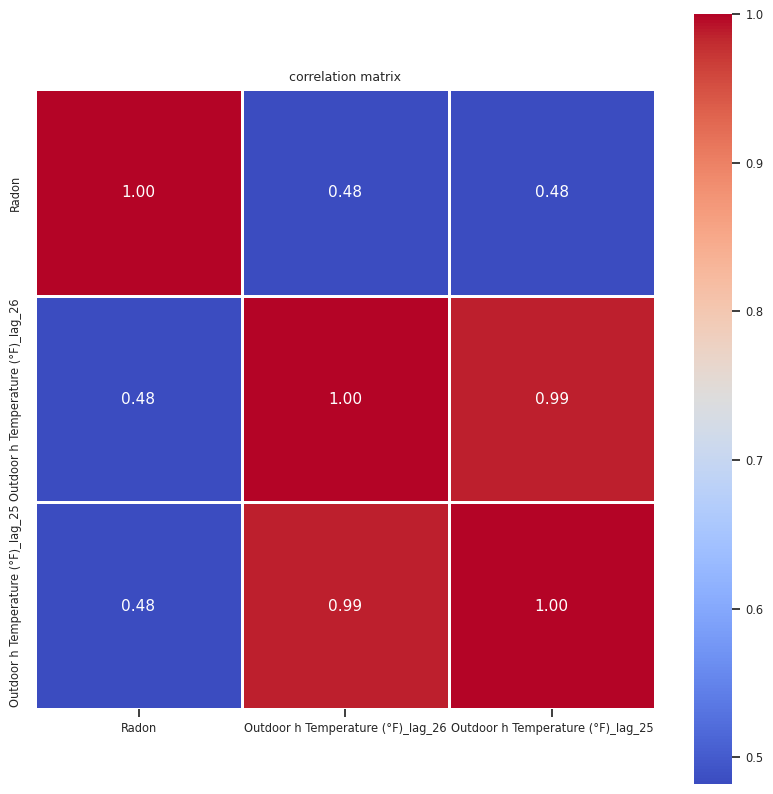

In [125]:
# helper method: correlation matrix as heatmap
def corr_heatmap(df):
    idx = df.corr().sort_values("Radon", ascending=False).index
    df_sorted = df.loc[:, idx]  # sort dataframe columns by their correlation 

    #plt.figure(figsize = (15,15))
    sns.set(font_scale=0.75)
    ax = sns.heatmap(df_sorted.corr().round(3), 
            annot=True, 
            square=True, 
            linewidths=.75, cmap="coolwarm", 
            fmt = ".2f", 
            annot_kws = {"size": 11})
    ax.xaxis.tick_bottom()
    plt.title("correlation matrix")
    plt.show()



# visualize correlations with price     

df4 = df[df_corrH.index]   # keep the components with at least modest correlations

plt.figure(figsize = (10,10))
corr_heatmap(df4)

In [126]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 9378 entries, 2022-05-11 19:00:00 to 2023-06-06 12:00:00
Freq: H
Data columns (total 3 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Radon                              9378 non-null   float32
 1   Outdoor h Temperature (°F)_lag_26  9378 non-null   float32
 2   Outdoor h Temperature (°F)_lag_25  9378 non-null   float32
dtypes: float32(3)
memory usage: 183.2 KB


In [127]:
# create time series object for target variable
ts_P = TimeSeries.from_series(df4["Radon"], fill_missing_dates=True, freq="H") 

# check attributes of the time series
print("components:", ts_P.components)
print("duration:",ts_P.duration)
print("frequency:",ts_P.freq)
print("frequency:",ts_P.freq_str)
print("has date time index? (or else, it must have an integer index):",ts_P.has_datetime_index)
print("deterministic:",ts_P.is_deterministic)
print("univariate:",ts_P.is_univariate)

components: Index(['Radon'], dtype='object', name='component')
duration: 390 days 17:00:00
frequency: <Hour>
frequency: H
has date time index? (or else, it must have an integer index): True
deterministic: True
univariate: True


In [128]:
# create time series object for the feature columns
df_covF = df4.loc[:, df4.columns != "Radon"]
df_covF = df_covF.loc[:, df_covF.columns != 'Outdoor h Temperature (°F)_lag_25']
ts_covF = TimeSeries.from_dataframe(df_covF, fill_missing_dates=True, freq="H")

# check attributes of the time series
print("components (columns) of feature time series:", ts_covF.components)
print("duration:",ts_covF.duration)
print("frequency:",ts_covF.freq)
print("frequency:",ts_covF.freq_str)
print("has date time index? (or else, it must have an integer index):",ts_covF.has_datetime_index)
print("deterministic:",ts_covF.is_deterministic)
print("univariate:",ts_covF.is_univariate)

components (columns) of feature time series: Index(['Outdoor h Temperature (°F)_lag_26'], dtype='object', name='component')
duration: 390 days 17:00:00
frequency: <Hour>
frequency: H
has date time index? (or else, it must have an integer index): True
deterministic: True
univariate: True


In [129]:
# example: operating with time series objects:
# we can also create a 3-dimensional numpy array from a time series object
# 3 dimensions: time (rows) / components (columns) / samples
ar_covF = ts_covF.all_values()
print(type(ar_covF))
ar_covF.shape

<class 'numpy.ndarray'>


(9378, 1, 1)

In [130]:
# example: operating with time series objects:
# we can also create a pandas series or dataframe from a time series object
df_covF = ts_covF.pd_dataframe()
type(df_covF)

pandas.core.frame.DataFrame

In [131]:
# train/test split and scaling of target variable
ts_train, ts_test = ts_P.split_after(split_point=9210)

print("training start:", ts_train.start_time())
print("training end:", ts_train.end_time())
print("training duration:",ts_train.duration)
print("test start:", ts_test.start_time())
print("test end:", ts_test.end_time())
print("test duration:", ts_test.duration)


scalerP = Scaler()
scalerP.fit_transform(ts_train)
ts_ttrain = scalerP.transform(ts_train)
ts_ttest = scalerP.transform(ts_test)    
ts_t = scalerP.transform(ts_P)

# make sure data are of type float
ts_t = ts_t.astype(np.float32)
ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)

print("first and last row of scaled Radon time series:")
pd.options.display.float_format = '{:,.2f}'.format
ts_t.pd_dataframe().iloc[[0,-1]]

training start: 2022-05-11 19:00:00
training end: 2023-05-30 13:00:00
training duration: 383 days 18:00:00
test start: 2023-05-30 14:00:00
test end: 2023-06-06 12:00:00
test duration: 6 days 22:00:00
first and last row of scaled Radon time series:


component,Radon
SyncDate,
2022-05-11 19:00:00,0.04
2023-06-06 12:00:00,0.05


In [132]:
# train/test split and scaling of feature covariates
covF_train, covF_test = ts_covF.split_after(split_point=9210)

scalerF = Scaler()
scalerF.fit_transform(covF_train)
covF_ttrain = scalerF.transform(covF_train) 
covF_ttest = scalerF.transform(covF_test)   
covF_t = scalerF.transform(ts_covF)  
# covF_t = ts_covF
# covF_ttrain = covF_train
# covF_ttest = covF_test
# make sure data are of type float
covF_ttrain = covF_ttrain.astype(np.float32)
covF_ttest = covF_ttest.astype(np.float32)

pd.options.display.float_format = '{:.2f}'.format
print("first and last row of scaled feature covariates:")
covF_t.pd_dataframe().iloc[[0,-1]]

first and last row of scaled feature covariates:


component,Outdoor h Temperature (°F)_lag_26
SyncDate,
2022-05-11 19:00:00,0.00
2023-06-06 12:00:00,0.70


In [133]:
print("first and last row of scaled target variable in training set: price:")
ts_ttrain.pd_dataframe().iloc[[0,-1]]

first and last row of scaled target variable in training set: price:


component,Radon
SyncDate,
2022-05-11 19:00:00,0.04
2023-05-30 13:00:00,0.07


In [166]:
def set_seed(seed_value):
    import random
    import numpy as np
    import torch

    random.seed(seed_value)
    np.random.seed(seed_value)
    torch.manual_seed(seed_value)
    torch.cuda.manual_seed(seed_value)
    torch.cuda.manual_seed_all(seed_value)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    pl.seed_everything(seed_value, workers=True)

In [167]:
import torch
from ray.air import session
from darts.utils.losses import SmapeLoss
from torchmetrics import MetricCollection, SymmetricMeanAbsolutePercentageError, MeanAbsolutePercentageError
def build_fit_tft_model(
    model_args,
    save_checkpoints=False,
    callbacks=None,
    save_model=False
):
#     BATCH_SIZE=64
    MAX_EPOCHS=500
    NR_EPOCHS_VAL_PERIOD=1
    set_seed(42)
    torch_metrics = MetricCollection([MeanAbsolutePercentageError(), SymmetricMeanAbsolutePercentageError()])

#     early_stopper = EarlyStopping(
#         monitor="val_loss",
#         patience=5,
#         min_delta=0.001,
#         mode='min',
#     )

#     if callbacks is None:
#         callbacks = [early_stopper]
#     else:
#         callbacks.append(early_stopper)
    
    #detect if GPU is available
#     if torch.cuda.is_available():
#         pl_trainer_kwargs = {
#             "accelerator": "gpu",
#             "gpus": -1,
#             "auto_select_gpus": True,
#             "callbacks": callbacks,
#             "enable_progress_bar":False,
#         }
#         num_workers=8
#     else:
#         pl_trainer_kwargs={
#             "callbacks": callbacks,
#         }
#         num_workers=0
    pl_trainer_kwargs={
            "accelerator": "gpu",
            "gpus":-1,
            "auto_select_gpus": True,
            "callbacks": callbacks,
            "enable_progress_bar": False,
        }
    encoders={"cyclic": {"future": ["hour"]},
             'transformer':Scaler()} if model_args['include_hour'] else None
   

    model = TFTModel(
        input_chunk_length=model_args['in_len'],
        output_chunk_length=model_args['out_len'],
        batch_size=model_args['batch_size'],
        n_epochs=MAX_EPOCHS,
        nr_epochs_val_period=NR_EPOCHS_VAL_PERIOD,
        model_name="tft",
        hidden_size=int(model_args['out_len']+((2/3)*model_args['in_len'])),
        lstm_layers=model_args['lstm_layers'],
        num_attention_heads=model_args['num_attention_heads'],
        full_attention=model_args['full_attention'],
        feed_forward=model_args['feed_forward'],
        dropout=model_args['dropout'],
        add_relative_index=True,
        norm_type=model_args['norm_type'],
        use_static_covariates=False,
        loss_fn=SmapeLoss(),
        optimizer_kwargs={'lr': model_args['lr']},
        add_encoders=encoders,
        log_tensorboard=False,
        force_reset=True,
        save_checkpoints=save_checkpoints,
        pl_trainer_kwargs=pl_trainer_kwargs,
        torch_metrics=torch_metrics,
        random_state=42
        )
    val_len = len(ts_test)
    val_series = ts_ttrain[-((val_len) + model_args['in_len']) :]
    ts_ttrain_input = ts_ttrain[:-(val_len )]
    model.fit(  ts_ttrain_input, 
                future_covariates=covF_t,
                val_series=val_series,
                val_future_covariates=covF_t,)
#     model.load_from_checkpoint(f"{model_args['model']} RNN model", best=True)
    ts_tpred = model.predict(
                series = ts_ttrain,
                future_covariates=covF_t,
                n = len(ts_ttest),
                verbose=True
    )
    ts_q = scalerP.inverse_transform(ts_tpred)
    q_smape = smape(ts_q, ts_test)
    session.report({'q_smape': q_smape})

In [172]:
def build_fit_tft_model_return(
    model_args,
    save_checkpoints=False,
    callbacks=None,
    save_model=False
):
#     BATCH_SIZE=64
    MAX_EPOCHS=500
    NR_EPOCHS_VAL_PERIOD=1
    set_seed(42)
    torch_metrics = MetricCollection([MeanAbsolutePercentageError(), SymmetricMeanAbsolutePercentageError()])

#     early_stopper = EarlyStopping(
#         monitor="val_loss",
#         patience=5,
#         min_delta=0.001,
#         mode='min',
#     )

#     if callbacks is None:
#         callbacks = [early_stopper]
#     else:
#         callbacks.append(early_stopper)
    
    #detect if GPU is available
#     if torch.cuda.is_available():
#         pl_trainer_kwargs = {
#             "accelerator": "gpu",
#             "gpus": -1,
#             "auto_select_gpus": True,
#             "callbacks": callbacks,
#             "enable_progress_bar":False,
#         }
#         num_workers=8
#     else:
#         pl_trainer_kwargs={
#             "callbacks": callbacks,
#         }
#         num_workers=0
    pl_trainer_kwargs={
            "accelerator": "gpu",
            "gpus":1,
            "auto_select_gpus": True,
            "callbacks": callbacks,
            "enable_progress_bar": True,
        }
    encoders={"cyclic": {"future": ["hour"]},
             'transformer':Scaler()} if model_args['include_hour'] else None
   

    model = TFTModel(
        input_chunk_length=model_args['in_len'],
        output_chunk_length=model_args['out_len'],
        batch_size=model_args['batch_size'],
        n_epochs=MAX_EPOCHS,
        nr_epochs_val_period=NR_EPOCHS_VAL_PERIOD,
        model_name="tft",
        hidden_size=int(model_args['out_len']+((2/3)*model_args['in_len'])),
        lstm_layers=model_args['lstm_layers'],
        num_attention_heads=model_args['num_attention_heads'],
        full_attention=model_args['full_attention'],
        feed_forward=model_args['feed_forward'],
        dropout=model_args['dropout'],
        add_relative_index=True,
        norm_type=model_args['norm_type'],
        use_static_covariates=False,
        loss_fn=SmapeLoss(),
        optimizer_kwargs={'lr': model_args['lr']},
        add_encoders=encoders,
        log_tensorboard=False,
        force_reset=True,
        save_checkpoints=save_checkpoints,
        pl_trainer_kwargs=pl_trainer_kwargs,
        torch_metrics=torch_metrics,
        random_state=42
        )
    val_len = len(ts_test)
    val_series = ts_ttrain[-((val_len) + model_args['in_len']) :]
    ts_ttrain_input = ts_ttrain[:-(val_len )]
    model.fit(  ts_ttrain_input, 
                future_covariates=covF_t,
                val_series=val_series,
                val_future_covariates=covF_t,)
#     model.load_from_checkpoint(f"{model_args['model']} RNN model", best=True)
#     ts_tpred = model.predict(
#                 series = ts_ttrain,
#                 past_covariates=covF_t,
#                 n = len(ts_ttest),
#                 verbose=True
#     )
#     ts_q = scalerP.inverse_transform(ts_tpred)
#     q_smape = smape(ts_q, ts_test)
#     session.report({'q_smape': q_smape})
    return model

In [169]:
from ray import tune
from ray.tune import CLIReporter 
# from ray.tune.integration.pytorch_lightning import TuneReportCallback
from ray.tune.schedulers import ASHAScheduler, AsyncHyperBandScheduler
from ray.tune.search.optuna import OptunaSearch
from ray.tune.search import ConcurrencyLimiter
# tune_callback = TuneReportCallback(
#     {
#         "loss":"val_loss",
#         "sMAPE": "val_SymmetricMeanAbsolutePercentageError",
#     },
#     on="validation_end",
# )

early_stopper = EarlyStopping(
        monitor="val_SymmetricMeanAbsolutePercentageError",
        patience=3,
        mode='min',
    )

#define the hyperparameter search space
config = {
    "in_len": tune.randint(8,168),
    "out_len":tune.randint(1,24),
    "batch_size":tune.choice([32,64,128,256]),
    "lstm_layers":tune.choice([1,2,3]),
    "num_attention_heads":tune.randint(2,8),
    "full_attention":tune.choice([True, False]),
    "feed_forward":tune.choice(['GLU', 'Bilinear', 'ReGLU', 'GEGLU', 'SwiGLU', 'ReLU', 'GELU', 'GatedResidualNetwork']),
    "dropout":tune.uniform(0.1, 0.5),
    "norm_type":tune.choice(['LayerNorm','RMSNorm','LayerNormNoBias']),
    "lr": tune.loguniform(1e-5, 1e-1),
    "include_hour":tune.choice([True, False]),
    "batch_size":tune.choice([16,32,64,128,256]),
    
}

reporter = CLIReporter(
    parameter_columns=list(config.keys()),
    metric_columns=["q_smape"])
resources_per_trial = {"cpu": 5, "gpu": 0.4}

num_samples = 100

algo = OptunaSearch()

algo = ConcurrencyLimiter(algo, max_concurrent=10)

scheduler = AsyncHyperBandScheduler(max_t=100, grace_period=10, reduction_factor=2)

train_fn_with_parameters = tune.with_parameters(build_fit_tft_model, callbacks=[early_stopper])

analysis = tune.run(
    train_fn_with_parameters,
    resources_per_trial=resources_per_trial,
    metric="q_smape",
    mode="min",
    config=config,
    num_samples=num_samples,
    search_alg=algo,
    scheduler = scheduler,
    progress_reporter=reporter,
    name="tft_tune_cov",
    raise_on_failed_trial=False
)

print("Best hyperparameters found were: ", analysis.best_config)

== Status ==
Current time: 2023-07-09 14:26:51 (running for 00:00:00.15)
Memory usage on this node: 17.6/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 5.0/48 CPUs, 0.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 1/100 (1 RUNNING)
+------------------------------+----------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------+-----------+-----------------+-------------+----------------+
| Trial name                   | status   | loc                  |   in_len |   out_len |   batch_size |   lstm_layers |   num_attention_heads | full_attention   | feed_forward   |   dropout | norm_type       |          lr | include_hour   |
|------------------------------+----------+----------------------+--

(build_fit_tft_model pid=1983900) Global seed set to 42
(build_fit_tft_model pid=1983900) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1983900)   rank_zero_deprecation(
(build_fit_tft_model pid=1983900) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1983900)   rank_zero_deprecation(
(build_fit_tft_model pid=1983900) Auto select gpus: [0]
(build_fit_tft_model pid=1983900) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 14:27:00 (running for 00:00:09.67)
Memory usage on this node: 22.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 9/100 (1 PENDING, 8 RUNNING)
+------------------------------+----------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------+-----------+-----------------+-------------+----------------+
| Trial name                   | status   | loc                  |   in_len |   out_len |   batch_size |   lstm_layers |   num_attention_heads | full_attention   | feed_forward   |   dropout | norm_type       |          lr | include_hour   |
|------------------------------+---------

(build_fit_tft_model pid=1984135) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1984135)   rank_zero_deprecation(
(build_fit_tft_model pid=1984135) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1984135)   rank_zero_deprecation(
(build_fit_tft_model pid=1984131) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting 

(build_fit_tft_model pid=1984128) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1984128)   rank_zero_warn(
(build_fit_tft_model pid=1984128) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1984128)   rank_zero_warn(
(build_fit_tft_model pid=1984187) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger

(build_fit_tft_model pid=1984125) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1984125)   rank_zero_warn(
(build_fit_tft_model pid=1984125) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1984125)   rank_zero_warn(
(build_fit_tft_model pid=1984138) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(

== Status ==
Current time: 2023-07-09 14:27:05 (running for 00:00:14.68)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 9/100 (1 PENDING, 8 RUNNING)
+------------------------------+----------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------+-----------+-----------------+-------------+----------------+
| Trial name                   | status   | loc                  |   in_len |   out_len |   batch_size |   lstm_layers |   num_attention_heads | full_attention   | feed_forward   |   dropout | norm_type       |          lr | include_hour   |
|------------------------------+---------

== Status ==
Current time: 2023-07-09 14:27:20 (running for 00:00:29.69)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 9/100 (1 PENDING, 8 RUNNING)
+------------------------------+----------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------+-----------+-----------------+-------------+----------------+
| Trial name                   | status   | loc                  |   in_len |   out_len |   batch_size |   lstm_layers |   num_attention_heads | full_attention   | feed_forward   |   dropout | norm_type       |          lr | include_hour   |
|------------------------------+---------

== Status ==
Current time: 2023-07-09 14:27:35 (running for 00:00:44.71)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 9/100 (1 PENDING, 8 RUNNING)
+------------------------------+----------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------+-----------+-----------------+-------------+----------------+
| Trial name                   | status   | loc                  |   in_len |   out_len |   batch_size |   lstm_layers |   num_attention_heads | full_attention   | feed_forward   |   dropout | norm_type       |          lr | include_hour   |
|------------------------------+---------

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 18.20it/s]


(build_fit_tft_model pid=1984131) Auto select gpus: [0]
(build_fit_tft_model pid=1984131) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1984131) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1984131) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1984131) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1984131) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1984131) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]


Trial name,date,done,episodes_total,experiment_id,experiment_tag,hostname,iterations_since_restore,node_ip,pid,q_smape,time_since_restore,time_this_iter_s,time_total_s,timestamp,timesteps_since_restore,timesteps_total,training_iteration,trial_id,warmup_time
build_fit_tft_model_082f22b7,2023-07-09_14-57-43,True,,6770eee7f492459aad10fb0fdd862420,"67_batch_size=16,dropout=0.3867,feed_forward=GEGLU,full_attention=False,in_len=52,include_hour=True,lr=0.0008,lstm_layers=1,norm_type=RMSNorm,num_attention_heads=4,out_len=17",ip-172-31-10-87,1,172.31.10.87,2001092,49.2171,343.741,343.741,343.741,1688914663,0,,1,082f22b7,0.00268006
build_fit_tft_model_08d71476,2023-07-09_14-48-42,True,,95b7a1adbf5d4201834cba555afdb369,"56_batch_size=64,dropout=0.2167,feed_forward=GLU,full_attention=True,in_len=83,include_hour=False,lr=0.0015,lstm_layers=1,norm_type=LayerNormNoBias,num_attention_heads=3,out_len=4",ip-172-31-10-87,1,172.31.10.87,1998227,152.062,76.0208,76.0208,76.0208,1688914122,0,,1,08d71476,0.00283694
build_fit_tft_model_0a4cae4d,2023-07-09_14-48-22,True,,ed2fe394ef664f6fb8099c05c249a6f6,"39_batch_size=64,dropout=0.2499,feed_forward=GLU,full_attention=True,in_len=132,include_hour=True,lr=0.0002,lstm_layers=1,norm_type=RMSNorm,num_attention_heads=5,out_len=10",ip-172-31-10-87,1,172.31.10.87,1993681,157.214,484.077,484.077,484.077,1688914102,0,,1,0a4cae4d,0.00317192
build_fit_tft_model_0ae62f30,2023-07-09_14-29-50,True,,a14f297a6aee44c9be741f150c41c944,"14_batch_size=128,dropout=0.4161,feed_forward=GatedResidualNetwork,full_attention=False,in_len=43,include_hour=False,lr=0.0077,lstm_layers=3,norm_type=LayerNormNoBias,num_attention_heads=3,out_len=11",ip-172-31-10-87,1,172.31.10.87,1987015,45.4786,53.9438,53.9438,53.9438,1688912990,0,,1,0ae62f30,0.00324488
build_fit_tft_model_0d8247d2,2023-07-09_15-06-39,True,,4cbc5d977ef548488ed842a627424b61,"87_batch_size=64,dropout=0.4742,feed_forward=Bilinear,full_attention=True,in_len=102,include_hour=True,lr=0.0001,lstm_layers=1,norm_type=LayerNorm,num_attention_heads=3,out_len=23",ip-172-31-10-87,1,172.31.10.87,2006445,13.7791,252.227,252.227,252.227,1688915199,0,,1,0d8247d2,0.00308609
build_fit_tft_model_0ebde252,2023-07-09_14-38-53,True,,0a2b8e4625884085a70ff987117370e8,"31_batch_size=64,dropout=0.3668,feed_forward=GELU,full_attention=True,in_len=73,include_hour=True,lr=0.0009,lstm_layers=1,norm_type=LayerNorm,num_attention_heads=7,out_len=12",ip-172-31-10-87,1,172.31.10.87,1991676,93.3882,73.6592,73.6592,73.6592,1688913533,0,,1,0ebde252,0.00275016
build_fit_tft_model_0f5fdcc2,2023-07-09_14-43-44,True,,d62398daf08e433f8839f9b1ef3d2f1b,"35_batch_size=32,dropout=0.1841,feed_forward=GELU,full_attention=False,in_len=27,include_hour=True,lr=0.0010,lstm_layers=1,norm_type=RMSNorm,num_attention_heads=5,out_len=13",ip-172-31-10-87,1,172.31.10.87,1992684,46.3058,274.71,274.71,274.71,1688913824,0,,1,0f5fdcc2,0.00286746
build_fit_tft_model_105bc3b3,2023-07-09_15-03-34,True,,115bc9157f7541078e4ad41abb039ef7,"78_batch_size=16,dropout=0.4798,feed_forward=ReGLU,full_attention=False,in_len=45,include_hour=True,lr=0.0054,lstm_layers=1,norm_type=LayerNormNoBias,num_attention_heads=4,out_len=17",ip-172-31-10-87,1,172.31.10.87,2004163,12.6495,291.173,291.173,291.173,1688915014,0,,1,105bc3b3,0.00318122
build_fit_tft_model_10f0b8f9,2023-07-09_14-44-35,True,,7c4410b6298c45748453c48acbf174dc,"37_batch_size=64,dropout=0.2569,feed_forward=GLU,full_attention=True,in_len=93,include_hour=True,lr=0.0001,lstm_layers=1,norm_type=RMSNorm,num_attention_heads=3,out_len=7",ip-172-31-10-87,1,172.31.10.87,1993192,10.9861,275.92,275.92,275.92,1688913875,0,,1,10f0b8f9,0.00301147
build_fit_tft_model_144adab2,2023-07-09_14-45-52,True,,4ccc8b1f68d84cfebcedca07be940e37,"49_batch_size=128,dropout=0.1342,feed_forward=ReLU,full_attention=False,in_len=132,include_hour=True,lr=0.0035,lstm_layers=1,norm_type=LayerNormNoBias,num_attention_heads=7,out_len=15",ip-172-31-10-87,1,172.31.10.87,1996357,102.201,104.539,104.539,104.539,1688913952,0,,1,144

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1984133) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1984133)   rank_zero_deprecation(
(build_fit_tft_model pid=1984133) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1984133)   rank_zero_deprecation(
(build_fit_tft_model pid=1984133) Auto select gpus: [0]
(build_fit_tft_model pid=1984133) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1984133) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 18.03it/s]


(build_fit_tft_model pid=1985822) Global seed set to 42
(build_fit_tft_model pid=1985822) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1985822)   rank_zero_deprecation(
(build_fit_tft_model pid=1985822) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1985822)   rank_zero_deprecation(
(build_fit_tft_model pid=1985986) Global seed set to 42
(build_fit_tft_model pid=1985986) /home/ubuntu/anaconda3/lib/python3.9/site-p

== Status ==
Current time: 2023-07-09 14:27:55 (running for 00:01:04.27)
Memory usage on this node: 34.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 307e2d5b with q_smape=166.39583110809326 and parameters={'in_len': 47, 'out_len': 22, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 5, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.290750306321377, 'norm_type': 'RMSNorm', 'lr': 0.0027956174070199727, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 11/100 (1 PENDING, 8 RUNNING, 2 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-

(build_fit_tft_model pid=1985822) Auto select gpus: [0]
(build_fit_tft_model pid=1985822) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1985822) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1985822) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1985822) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1985822) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1985986) Auto select gpus: [0]
(build_fit_tft_model pid=1985986) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1985986) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1985986) IPU available: False, using: 0 I

(build_fit_tft_model pid=1985986) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1985986)   rank_zero_warn(
(build_fit_tft_model pid=1985986) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1985986)   rank_zero_warn(
(build_fit_tft_model pid=1985986) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logg

== Status ==
Current time: 2023-07-09 14:28:00 (running for 00:01:09.28)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 307e2d5b with q_smape=166.39583110809326 and parameters={'in_len': 47, 'out_len': 22, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 5, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.290750306321377, 'norm_type': 'RMSNorm', 'lr': 0.0027956174070199727, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 11/100 (1 PENDING, 8 RUNNING, 2 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-

== Status ==
Current time: 2023-07-09 14:28:10 (running for 00:01:19.29)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 307e2d5b with q_smape=166.39583110809326 and parameters={'in_len': 47, 'out_len': 22, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 5, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.290750306321377, 'norm_type': 'RMSNorm', 'lr': 0.0027956174070199727, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 11/100 (1 PENDING, 8 RUNNING, 2 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-

(build_fit_tft_model pid=1984187) Auto select gpus: [0]
(build_fit_tft_model pid=1984187) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1984187) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1984187) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1984187) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1984187) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1984187) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 13.44it/s]


(build_fit_tft_model pid=1984128) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1984128)   rank_zero_deprecation(
(build_fit_tft_model pid=1984128) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1984128)   rank_zero_deprecation(
(build_fit_tft_model pid=1984128) Auto select gpus: [0]
(build_fit_tft_model pid=1984128) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1984128) TPU available: False, usin

== Status ==
Current time: 2023-07-09 14:28:16 (running for 00:01:25.27)
Memory usage on this node: 35.6/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: ff382e36 with q_smape=140.9246563911438 and parameters={'in_len': 34, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 4, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3023661794455409, 'norm_type': 'LayerNorm', 'lr': 0.002456314404988399, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 12/100 (1 PENDING, 8 RUNNING, 3 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=1986312) Global seed set to 42
(build_fit_tft_model pid=1986312) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1986312)   rank_zero_deprecation(
(build_fit_tft_model pid=1986312) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1986312)   rank_zero_deprecation(
(build_fit_tft_model pid=1986312) Auto select gpus: [0]
(build_fit_tft_model pid=1986312) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 14:28:22 (running for 00:01:31.28)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: ff382e36 with q_smape=140.9246563911438 and parameters={'in_len': 34, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 4, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3023661794455409, 'norm_type': 'LayerNorm', 'lr': 0.002456314404988399, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 13/100 (1 PENDING, 8 RUNNING, 4 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=1986549) Auto select gpus: [0]
(build_fit_tft_model pid=1986549) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1986549) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1986549) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1986549) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1986549) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1986549) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1986549) 
(build_fit_tft_model pid=1986549)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1986549) --------

== Status ==
Current time: 2023-07-09 14:28:27 (running for 00:01:36.29)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: ff382e36 with q_smape=140.9246563911438 and parameters={'in_len': 34, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 4, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3023661794455409, 'norm_type': 'LayerNorm', 'lr': 0.002456314404988399, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 13/100 (1 PENDING, 8 RUNNING, 4 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:28:37 (running for 00:01:46.30)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: ff382e36 with q_smape=140.9246563911438 and parameters={'in_len': 34, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 4, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3023661794455409, 'norm_type': 'LayerNorm', 'lr': 0.002456314404988399, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 13/100 (1 PENDING, 8 RUNNING, 4 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:28:47 (running for 00:01:56.31)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: ff382e36 with q_smape=140.9246563911438 and parameters={'in_len': 34, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 4, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3023661794455409, 'norm_type': 'LayerNorm', 'lr': 0.002456314404988399, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 13/100 (1 PENDING, 8 RUNNING, 4 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=1983900) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1983900)   rank_zero_deprecation(
(build_fit_tft_model pid=1983900) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1983900)   rank_zero_deprecation(
(build_fit_tft_model pid=1983900) Auto select gpus: [0]
(build_fit_tft_model pid=1983900) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1983900) TPU available: False, usin

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1985822) Auto select gpus: [0]
(build_fit_tft_model pid=1985822) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1985822) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1985822) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1985822) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1985822) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1985822) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.78it/s]


(build_fit_tft_model pid=1986856) Global seed set to 42
(build_fit_tft_model pid=1986856) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1986856)   rank_zero_deprecation(
(build_fit_tft_model pid=1986856) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1986856)   rank_zero_deprecation(
(build_fit_tft_model pid=1987015) Global seed set to 42
(build_fit_tft_model pid=1987015) /home/ubuntu/anaconda3/lib/python3.9/site-p

== Status ==
Current time: 2023-07-09 14:28:57 (running for 00:02:06.29)
Memory usage on this node: 34.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 8138a3f8 with q_smape=124.11081790924072 and parameters={'in_len': 83, 'out_len': 3, 'batch_size': 32, 'lstm_layers': 3, 'num_attention_heads': 2, 'full_attention': True, 'feed_forward': 'ReLU', 'dropout': 0.4242841885194454, 'norm_type': 'LayerNorm', 'lr': 0.005064101438989441, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 15/100 (1 PENDING, 8 RUNNING, 6 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

(build_fit_tft_model pid=1987015) Auto select gpus: [0]
(build_fit_tft_model pid=1987015) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1987015) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1987015) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1987015) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1987015) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1986856) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1986856) 
(build_fit_tft_model pid=1986856)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1986856) --------

(build_fit_tft_model pid=1987015) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1987015)   rank_zero_warn(
(build_fit_tft_model pid=1987015) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1987015)   rank_zero_warn(


== Status ==
Current time: 2023-07-09 14:29:02 (running for 00:02:11.29)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 8138a3f8 with q_smape=124.11081790924072 and parameters={'in_len': 83, 'out_len': 3, 'batch_size': 32, 'lstm_layers': 3, 'num_attention_heads': 2, 'full_attention': True, 'feed_forward': 'ReLU', 'dropout': 0.4242841885194454, 'norm_type': 'LayerNorm', 'lr': 0.005064101438989441, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 15/100 (1 PENDING, 8 RUNNING, 6 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1984138) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1984138)   rank_zero_deprecation(
(build_fit_tft_model pid=1984138) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1984138)   rank_zero_deprecation(
(build_fit_tft_model pid=1984138) Auto select gpus: [0]
(build_fit_tft_model pid=1984138) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1984138) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 11.11it/s]


(build_fit_tft_model pid=1987343) Global seed set to 42
(build_fit_tft_model pid=1987343) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1987343)   rank_zero_deprecation(
(build_fit_tft_model pid=1987343) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1987343)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:29:17 (running for 00:02:26.29)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 9ba5d1f0 with q_smape=17.120300233364105 and parameters={'in_len': 112, 'out_len': 13, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GEGLU', 'dropout': 0.2511647568442025, 'norm_type': 'LayerNormNoBias', 'lr': 0.000139592528782855, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 16/100 (1 PENDING, 8 RUNNING, 7 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+-------------

(build_fit_tft_model pid=1987343) Auto select gpus: [0]
(build_fit_tft_model pid=1987343) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1987343) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1987343) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1987343) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1987343) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1987343) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1987343) 
(build_fit_tft_model pid=1987343)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1987343) --------

== Status ==
Current time: 2023-07-09 14:29:22 (running for 00:02:31.30)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 9ba5d1f0 with q_smape=17.120300233364105 and parameters={'in_len': 112, 'out_len': 13, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GEGLU', 'dropout': 0.2511647568442025, 'norm_type': 'LayerNormNoBias', 'lr': 0.000139592528782855, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 16/100 (1 PENDING, 8 RUNNING, 7 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+-------------

(build_fit_tft_model pid=1984125) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1984125)   rank_zero_deprecation(
(build_fit_tft_model pid=1984125) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1984125)   rank_zero_deprecation(
(build_fit_tft_model pid=1984125) Auto select gpus: [0]
(build_fit_tft_model pid=1984125) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1984125) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.35it/s]


(build_fit_tft_model pid=1987588) Global seed set to 42
(build_fit_tft_model pid=1987588) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1987588)   rank_zero_deprecation(
(build_fit_tft_model pid=1987588) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1987588)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:29:29 (running for 00:02:38.29)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 9ba5d1f0 with q_smape=17.120300233364105 and parameters={'in_len': 112, 'out_len': 13, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GEGLU', 'dropout': 0.2511647568442025, 'norm_type': 'LayerNormNoBias', 'lr': 0.000139592528782855, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 17/100 (1 PENDING, 8 RUNNING, 8 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+-------------

(build_fit_tft_model pid=1987588) Auto select gpus: [0]
(build_fit_tft_model pid=1987588) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1987588) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1987588) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1987588) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1987588) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1987588) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1987588) 
(build_fit_tft_model pid=1987588)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1987588) --------

== Status ==
Current time: 2023-07-09 14:29:34 (running for 00:02:43.30)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 9ba5d1f0 with q_smape=17.120300233364105 and parameters={'in_len': 112, 'out_len': 13, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GEGLU', 'dropout': 0.2511647568442025, 'norm_type': 'LayerNormNoBias', 'lr': 0.000139592528782855, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 17/100 (1 PENDING, 8 RUNNING, 8 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+-------------

== Status ==
Current time: 2023-07-09 14:29:44 (running for 00:02:53.31)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 9ba5d1f0 with q_smape=17.120300233364105 and parameters={'in_len': 112, 'out_len': 13, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GEGLU', 'dropout': 0.2511647568442025, 'norm_type': 'LayerNormNoBias', 'lr': 0.000139592528782855, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 17/100 (1 PENDING, 8 RUNNING, 8 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+-------------

(build_fit_tft_model pid=1987343) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1987343)   rank_zero_deprecation(
(build_fit_tft_model pid=1987343) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1987343)   rank_zero_deprecation(
(build_fit_tft_model pid=1987343) Auto select gpus: [0]
(build_fit_tft_model pid=1987343) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1987343) TPU available: False, usin

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1987015) Auto select gpus: [0]
(build_fit_tft_model pid=1987015) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1987015) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1987015) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1987015) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1987015) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1987015) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.58it/s]


(build_fit_tft_model pid=1987844) Global seed set to 42
(build_fit_tft_model pid=1987844) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1987844)   rank_zero_deprecation(
(build_fit_tft_model pid=1987844) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1987844)   rank_zero_deprecation(
(build_fit_tft_model pid=1988006) Global seed set to 42
(build_fit_tft_model pid=1988006) /home/ubuntu/anaconda3/lib/python3.9/site-p

== Status ==
Current time: 2023-07-09 14:29:56 (running for 00:03:05.31)
Memory usage on this node: 35.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 9ba5d1f0 with q_smape=17.120300233364105 and parameters={'in_len': 112, 'out_len': 13, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GEGLU', 'dropout': 0.2511647568442025, 'norm_type': 'LayerNormNoBias', 'lr': 0.000139592528782855, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 19/100 (1 PENDING, 8 RUNNING, 10 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+------------

(build_fit_tft_model pid=1988006) Auto select gpus: [0]
(build_fit_tft_model pid=1988006) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1988006) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1988006) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1988006) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1988006) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1987844) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1987844) 
(build_fit_tft_model pid=1987844)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1987844) --------

(build_fit_tft_model pid=1988006) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1988006)   rank_zero_warn(
(build_fit_tft_model pid=1988006) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1988006)   rank_zero_warn(


== Status ==
Current time: 2023-07-09 14:30:01 (running for 00:03:10.31)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 9ba5d1f0 with q_smape=17.120300233364105 and parameters={'in_len': 112, 'out_len': 13, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GEGLU', 'dropout': 0.2511647568442025, 'norm_type': 'LayerNormNoBias', 'lr': 0.000139592528782855, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 19/100 (1 PENDING, 8 RUNNING, 10 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+------------

== Status ==
Current time: 2023-07-09 14:30:11 (running for 00:03:20.33)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 9ba5d1f0 with q_smape=17.120300233364105 and parameters={'in_len': 112, 'out_len': 13, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GEGLU', 'dropout': 0.2511647568442025, 'norm_type': 'LayerNormNoBias', 'lr': 0.000139592528782855, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 19/100 (1 PENDING, 8 RUNNING, 10 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+------------

== Status ==
Current time: 2023-07-09 14:30:21 (running for 00:03:30.35)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 9ba5d1f0 with q_smape=17.120300233364105 and parameters={'in_len': 112, 'out_len': 13, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GEGLU', 'dropout': 0.2511647568442025, 'norm_type': 'LayerNormNoBias', 'lr': 0.000139592528782855, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 19/100 (1 PENDING, 8 RUNNING, 10 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+------------

== Status ==
Current time: 2023-07-09 14:30:31 (running for 00:03:40.36)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 9ba5d1f0 with q_smape=17.120300233364105 and parameters={'in_len': 112, 'out_len': 13, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GEGLU', 'dropout': 0.2511647568442025, 'norm_type': 'LayerNormNoBias', 'lr': 0.000139592528782855, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 19/100 (1 PENDING, 8 RUNNING, 10 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+------------

== Status ==
Current time: 2023-07-09 14:30:41 (running for 00:03:50.38)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 9ba5d1f0 with q_smape=17.120300233364105 and parameters={'in_len': 112, 'out_len': 13, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GEGLU', 'dropout': 0.2511647568442025, 'norm_type': 'LayerNormNoBias', 'lr': 0.000139592528782855, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 19/100 (1 PENDING, 8 RUNNING, 10 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+------------

== Status ==
Current time: 2023-07-09 14:30:51 (running for 00:04:00.39)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 9ba5d1f0 with q_smape=17.120300233364105 and parameters={'in_len': 112, 'out_len': 13, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GEGLU', 'dropout': 0.2511647568442025, 'norm_type': 'LayerNormNoBias', 'lr': 0.000139592528782855, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 19/100 (1 PENDING, 8 RUNNING, 10 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+------------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1986312) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1986312)   rank_zero_deprecation(
(build_fit_tft_model pid=1986312) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1986312)   rank_zero_deprecation(
(build_fit_tft_model pid=1986312) Auto select gpus: [0]
(build_fit_tft_model pid=1986312) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1986312) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 13.16it/s]


(build_fit_tft_model pid=1988365) Global seed set to 42
(build_fit_tft_model pid=1988365) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1988365)   rank_zero_deprecation(
(build_fit_tft_model pid=1988365) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1988365)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:31:06 (running for 00:04:15.31)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 9ba5d1f0 with q_smape=17.120300233364105 and parameters={'in_len': 112, 'out_len': 13, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GEGLU', 'dropout': 0.2511647568442025, 'norm_type': 'LayerNormNoBias', 'lr': 0.000139592528782855, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 20/100 (1 PENDING, 8 RUNNING, 11 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+------------

(build_fit_tft_model pid=1988365) Auto select gpus: [0]
(build_fit_tft_model pid=1988365) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1988365) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1988365) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1988365) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1988365) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1988365) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1988365) 
(build_fit_tft_model pid=1988365)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1988365) --------

== Status ==
Current time: 2023-07-09 14:31:11 (running for 00:04:20.32)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 9ba5d1f0 with q_smape=17.120300233364105 and parameters={'in_len': 112, 'out_len': 13, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GEGLU', 'dropout': 0.2511647568442025, 'norm_type': 'LayerNormNoBias', 'lr': 0.000139592528782855, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 20/100 (1 PENDING, 8 RUNNING, 11 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+------------

== Status ==
Current time: 2023-07-09 14:31:21 (running for 00:04:30.34)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 9ba5d1f0 with q_smape=17.120300233364105 and parameters={'in_len': 112, 'out_len': 13, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GEGLU', 'dropout': 0.2511647568442025, 'norm_type': 'LayerNormNoBias', 'lr': 0.000139592528782855, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 20/100 (1 PENDING, 8 RUNNING, 11 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+------------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1984135) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1984135)   rank_zero_deprecation(
(build_fit_tft_model pid=1984135) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1984135)   rank_zero_deprecation(
(build_fit_tft_model pid=1984135) Auto select gpus: [0]
(build_fit_tft_model pid=1984135) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1984135) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.53it/s]


(build_fit_tft_model pid=1988622) Global seed set to 42
(build_fit_tft_model pid=1988622) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1988622)   rank_zero_deprecation(
(build_fit_tft_model pid=1988622) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1988622)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:31:36 (running for 00:04:45.32)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 9ba5d1f0 with q_smape=17.120300233364105 and parameters={'in_len': 112, 'out_len': 13, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GEGLU', 'dropout': 0.2511647568442025, 'norm_type': 'LayerNormNoBias', 'lr': 0.000139592528782855, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 21/100 (1 PENDING, 8 RUNNING, 12 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+------------

(build_fit_tft_model pid=1988622) Auto select gpus: [0]
(build_fit_tft_model pid=1988622) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1988622) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1988622) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1988622) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1988622) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1988622) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1988622) 
(build_fit_tft_model pid=1988622)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1988622) --------

== Status ==
Current time: 2023-07-09 14:31:41 (running for 00:04:50.33)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 9ba5d1f0 with q_smape=17.120300233364105 and parameters={'in_len': 112, 'out_len': 13, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GEGLU', 'dropout': 0.2511647568442025, 'norm_type': 'LayerNormNoBias', 'lr': 0.000139592528782855, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 21/100 (1 PENDING, 8 RUNNING, 12 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+------------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1985986) Auto select gpus: [0]
(build_fit_tft_model pid=1985986) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1985986) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1985986) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1985986) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1985986) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1985986) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 24.92it/s]


(build_fit_tft_model pid=1988910) Global seed set to 42
(build_fit_tft_model pid=1988910) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1988910)   rank_zero_deprecation(
(build_fit_tft_model pid=1988910) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1988910)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:31:52 (running for 00:05:01.32)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 9ba5d1f0 with q_smape=17.120300233364105 and parameters={'in_len': 112, 'out_len': 13, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GEGLU', 'dropout': 0.2511647568442025, 'norm_type': 'LayerNormNoBias', 'lr': 0.000139592528782855, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 22/100 (1 PENDING, 8 RUNNING, 13 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+------------

(build_fit_tft_model pid=1988910) Auto select gpus: [0]
(build_fit_tft_model pid=1988910) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1988910) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1988910) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1988910) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1988910) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1988910) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1988910) 
(build_fit_tft_model pid=1988910)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1988910) --------

== Status ==
Current time: 2023-07-09 14:31:57 (running for 00:05:06.34)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 9ba5d1f0 with q_smape=17.120300233364105 and parameters={'in_len': 112, 'out_len': 13, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GEGLU', 'dropout': 0.2511647568442025, 'norm_type': 'LayerNormNoBias', 'lr': 0.000139592528782855, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 22/100 (1 PENDING, 8 RUNNING, 13 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+------------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1986549) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1986549)   rank_zero_deprecation(
(build_fit_tft_model pid=1986549) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1986549)   rank_zero_deprecation(
(build_fit_tft_model pid=1986549) Auto select gpus: [0]
(build_fit_tft_model pid=1986549) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1986549) TPU available: False, usin

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1987588) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1987588)   rank_zero_deprecation(
(build_fit_tft_model pid=1987588) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1987588)   rank_zero_deprecation(
(build_fit_tft_model pid=1987588) Auto select gpus: [0]
(build_fit_tft_model pid=1987588) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1987588) TPU available: False, usin

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1988622) Auto select gpus: [0]
(build_fit_tft_model pid=1988622) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1988622) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1988622) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1988622) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1988622) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1988622) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.55it/s]
== Status ==
Current time: 2023-07-09 14:32:08 (running for 00:05:17.92)
Memory usage on this node: 35.6/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 23/100 (1 PENDING, 8 RUNNING, 14 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+----------

(build_fit_tft_model pid=1989201) Global seed set to 42
(build_fit_tft_model pid=1989201) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1989201)   rank_zero_deprecation(
(build_fit_tft_model pid=1989201) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1989201)   rank_zero_deprecation(
(build_fit_tft_model pid=1989201) Auto select gpus: [0]
(build_fit_tft_model pid=1989201) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 14:32:15 (running for 00:05:24.36)
Memory usage on this node: 34.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 25/100 (1 PENDING, 8 RUNNING, 16 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

(build_fit_tft_model pid=1989446) Auto select gpus: [0]
(build_fit_tft_model pid=1989446) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1989446) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1989446) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1989446) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1989446) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1989448) Auto select gpus: [0]
(build_fit_tft_model pid=1989448) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1989448) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1989448) IPU available: False, using: 0 I

(build_fit_tft_model pid=1989446) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1989446)   rank_zero_warn(
(build_fit_tft_model pid=1989446) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1989446)   rank_zero_warn(
(build_fit_tft_model pid=1989448) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger

== Status ==
Current time: 2023-07-09 14:32:20 (running for 00:05:29.38)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 25/100 (1 PENDING, 8 RUNNING, 16 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:32:30 (running for 00:05:39.40)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 25/100 (1 PENDING, 8 RUNNING, 16 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:32:40 (running for 00:05:49.43)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 25/100 (1 PENDING, 8 RUNNING, 16 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:32:50 (running for 00:05:59.45)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 25/100 (1 PENDING, 8 RUNNING, 16 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:33:00 (running for 00:06:09.46)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 25/100 (1 PENDING, 8 RUNNING, 16 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1989446) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1989446)   rank_zero_deprecation(
(build_fit_tft_model pid=1989446) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1989446)   rank_zero_deprecation(
(build_fit_tft_model pid=1989446) Auto select gpus: [0]
(build_fit_tft_model pid=1989446) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1989446) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  7.79it/s]


(build_fit_tft_model pid=1989953) Global seed set to 42
(build_fit_tft_model pid=1989953) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1989953)   rank_zero_deprecation(
(build_fit_tft_model pid=1989953) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1989953)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:33:13 (running for 00:06:22.34)
Memory usage on this node: 36.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 26/100 (1 PENDING, 8 RUNNING, 17 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

(build_fit_tft_model pid=1989953) Auto select gpus: [0]
(build_fit_tft_model pid=1989953) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1989953) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1989953) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1989953) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1989953) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1989953) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1989953) 
(build_fit_tft_model pid=1989953)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1989953) --------

== Status ==
Current time: 2023-07-09 14:33:18 (running for 00:06:27.34)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 26/100 (1 PENDING, 8 RUNNING, 17 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

(build_fit_tft_model pid=1988006) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1988006)   rank_zero_deprecation(
(build_fit_tft_model pid=1988006) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1988006)   rank_zero_deprecation(
(build_fit_tft_model pid=1988006) Auto select gpus: [0]
(build_fit_tft_model pid=1988006) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1988006) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 19.77it/s]


(build_fit_tft_model pid=1990241) Global seed set to 42
(build_fit_tft_model pid=1990241) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1990241)   rank_zero_deprecation(
(build_fit_tft_model pid=1990241) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1990241)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:33:29 (running for 00:06:38.33)
Memory usage on this node: 36.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 27/100 (1 PENDING, 8 RUNNING, 18 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

(build_fit_tft_model pid=1990241) Auto select gpus: [0]
(build_fit_tft_model pid=1990241) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1990241) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1990241) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1990241) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1990241) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1990241) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1990241) 
(build_fit_tft_model pid=1990241)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1990241) --------

== Status ==
Current time: 2023-07-09 14:33:34 (running for 00:06:43.35)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 27/100 (1 PENDING, 8 RUNNING, 18 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:33:44 (running for 00:06:53.37)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 27/100 (1 PENDING, 8 RUNNING, 18 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

Predicting: 0it [00:00, ?it/s]
Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1988910) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1988910)   rank_zero_deprecation(
(build_fit_tft_model pid=1988910) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1988910)   rank_zero_deprecation(
(build_fit_tft_model pid=1988910) Auto select gpus: [0]
(build_fit_tft_model pid=1988910) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1988910) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 16.82it/s]


(build_fit_tft_model pid=1990499) Global seed set to 42
(build_fit_tft_model pid=1990499) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1990499)   rank_zero_deprecation(
(build_fit_tft_model pid=1990499) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1990499)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:33:57 (running for 00:07:06.34)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 28/100 (1 PENDING, 8 RUNNING, 19 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

(build_fit_tft_model pid=1990499) Auto select gpus: [0]
(build_fit_tft_model pid=1990499) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1990499) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1990499) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1990499) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1990499) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1990499) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1990499) 
(build_fit_tft_model pid=1990499)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1990499) --------

== Status ==
Current time: 2023-07-09 14:34:02 (running for 00:07:11.35)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 28/100 (1 PENDING, 8 RUNNING, 19 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:34:12 (running for 00:07:21.37)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 28/100 (1 PENDING, 8 RUNNING, 19 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

(build_fit_tft_model pid=1987844) Auto select gpus: [0]
(build_fit_tft_model pid=1987844) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1987844) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1987844) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1987844) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1987844) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1987844) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 20.48it/s]


(build_fit_tft_model pid=1990754) Global seed set to 42
(build_fit_tft_model pid=1990754) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1990754)   rank_zero_deprecation(
(build_fit_tft_model pid=1990754) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1990754)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:34:23 (running for 00:07:32.34)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 29/100 (1 PENDING, 8 RUNNING, 20 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

(build_fit_tft_model pid=1990754) Auto select gpus: [0]
(build_fit_tft_model pid=1990754) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1990754) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1990754) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1990754) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1990754) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1990754) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1990754) 
(build_fit_tft_model pid=1990754)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1990754) --------

== Status ==
Current time: 2023-07-09 14:34:28 (running for 00:07:37.35)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 29/100 (1 PENDING, 8 RUNNING, 20 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:34:38 (running for 00:07:47.37)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 29/100 (1 PENDING, 8 RUNNING, 20 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:34:48 (running for 00:07:57.39)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 29/100 (1 PENDING, 8 RUNNING, 20 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:34:58 (running for 00:08:07.41)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 29/100 (1 PENDING, 8 RUNNING, 20 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:35:08 (running for 00:08:17.42)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 29/100 (1 PENDING, 8 RUNNING, 20 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:35:18 (running for 00:08:27.44)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 29/100 (1 PENDING, 8 RUNNING, 20 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:35:28 (running for 00:08:37.46)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 29/100 (1 PENDING, 8 RUNNING, 20 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:35:38 (running for 00:08:47.48)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 29/100 (1 PENDING, 8 RUNNING, 20 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:35:48 (running for 00:08:57.50)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 29/100 (1 PENDING, 8 RUNNING, 20 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:35:58 (running for 00:09:07.51)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 29/100 (1 PENDING, 8 RUNNING, 20 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:36:08 (running for 00:09:17.53)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 29/100 (1 PENDING, 8 RUNNING, 20 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:36:18 (running for 00:09:27.54)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 29/100 (1 PENDING, 8 RUNNING, 20 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

(build_fit_tft_model pid=1990499) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1990499)   rank_zero_deprecation(
(build_fit_tft_model pid=1990499) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1990499)   rank_zero_deprecation(
(build_fit_tft_model pid=1990499) Auto select gpus: [0]
(build_fit_tft_model pid=1990499) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1990499) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 14.42it/s]
== Status ==
Current time: 2023-07-09 14:36:24 (running for 00:09:33.33)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 29/100 (8 RUNNING, 21 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----

(build_fit_tft_model pid=1991072) Global seed set to 42
(build_fit_tft_model pid=1991072) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1991072)   rank_zero_deprecation(
(build_fit_tft_model pid=1991072) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1991072)   rank_zero_deprecation(
(build_fit_tft_model pid=1991072) Auto select gpus: [0]
(build_fit_tft_model pid=1991072) GPU available: True (cuda), used: True
(bui

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 14.76it/s]


(build_fit_tft_model pid=1986856) Auto select gpus: [0]
(build_fit_tft_model pid=1986856) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1986856) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1986856) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1986856) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1986856) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1986856) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


== Status ==
Current time: 2023-07-09 14:36:30 (running for 00:09:39.80)
Memory usage on this node: 37.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 30/100 (1 PENDING, 8 RUNNING, 21 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

(build_fit_tft_model pid=1991072) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1991072) 
(build_fit_tft_model pid=1991072)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1991072) ----------------------------------------------------------------------------------------
(build_fit_tft_model pid=1991072) 0  | criterion                         | SmapeLoss                        | 0     
(build_fit_tft_model pid=1991072) 1  | train_metrics                     | MetricCollection                 | 0     
(build_fit_tft_model pid=1991072) 2  | val_metrics                       | MetricCollection                 | 0     
(build_fit_tft_model pid=1991072) 3  | input_embeddings                  | _MultiEmbedding                  | 0     
(build_fit_tft_model pid=1991072) 4  | static_covariates_vsn             | _VariableSelectionNetwork        | 0     
(build_fit_tft_model pid=1991072) 5  | encoder_vsn              

== Status ==
Current time: 2023-07-09 14:36:36 (running for 00:09:45.36)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 31/100 (1 PENDING, 8 RUNNING, 22 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

(build_fit_tft_model pid=1991312) Auto select gpus: [0]
(build_fit_tft_model pid=1991312) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1991312) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1991312) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1991312) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1991312) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1991312) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1991312) 
(build_fit_tft_model pid=1991312)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1991312) --------

== Status ==
Current time: 2023-07-09 14:36:41 (running for 00:09:50.37)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 31/100 (1 PENDING, 8 RUNNING, 22 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:36:51 (running for 00:10:00.39)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 31/100 (1 PENDING, 8 RUNNING, 22 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:37:01 (running for 00:10:10.41)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 31/100 (1 PENDING, 8 RUNNING, 22 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:37:11 (running for 00:10:20.43)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 31/100 (1 PENDING, 8 RUNNING, 22 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:37:21 (running for 00:10:30.44)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 31/100 (1 PENDING, 8 RUNNING, 22 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:37:31 (running for 00:10:40.46)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 31/100 (1 PENDING, 8 RUNNING, 22 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

(build_fit_tft_model pid=1990241) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1990241)   rank_zero_deprecation(
(build_fit_tft_model pid=1990241) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1990241)   rank_zero_deprecation(
(build_fit_tft_model pid=1990241) Auto select gpus: [0]
(build_fit_tft_model pid=1990241) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1990241) TPU available: False, usin

== Status ==
Current time: 2023-07-09 14:37:40 (running for 00:10:49.37)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 32/100 (1 PENDING, 8 RUNNING, 23 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

(build_fit_tft_model pid=1991676) Auto select gpus: [0]
(build_fit_tft_model pid=1991676) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1991676) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1991676) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1991676) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1991676) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1991676) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1991676) 
(build_fit_tft_model pid=1991676)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1991676) --------

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 11.43it/s]


(build_fit_tft_model pid=1991921) Global seed set to 42
(build_fit_tft_model pid=1991921) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1991921)   rank_zero_deprecation(
(build_fit_tft_model pid=1991921) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1991921)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:37:50 (running for 00:10:59.36)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 33/100 (1 PENDING, 8 RUNNING, 24 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

(build_fit_tft_model pid=1991921) Auto select gpus: [0]
(build_fit_tft_model pid=1991921) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1991921) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1991921) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1991921) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1991921) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1991921) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1991921) 
(build_fit_tft_model pid=1991921)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1991921) --------

== Status ==
Current time: 2023-07-09 14:37:55 (running for 00:11:04.38)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 33/100 (1 PENDING, 8 RUNNING, 24 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:38:05 (running for 00:11:14.40)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 33/100 (1 PENDING, 8 RUNNING, 24 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:38:15 (running for 00:11:24.42)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 33/100 (1 PENDING, 8 RUNNING, 24 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

== Status ==
Current time: 2023-07-09 14:38:25 (running for 00:11:34.44)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 33/100 (1 PENDING, 8 RUNNING, 24 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  7.03it/s]


(build_fit_tft_model pid=1988365) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1988365)   rank_zero_deprecation(
(build_fit_tft_model pid=1988365) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1988365)   rank_zero_deprecation(
(build_fit_tft_model pid=1988365) Auto select gpus: [0]
(build_fit_tft_model pid=1988365) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1988365) TPU available: False, usin

== Status ==
Current time: 2023-07-09 14:38:40 (running for 00:11:49.38)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 34/100 (1 PENDING, 8 RUNNING, 25 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

(build_fit_tft_model pid=1992189) Auto select gpus: [0]
(build_fit_tft_model pid=1992189) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1992189) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1992189) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1992189) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1992189) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1992189) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1992189) 
(build_fit_tft_model pid=1992189)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1992189) --------

== Status ==
Current time: 2023-07-09 14:38:45 (running for 00:11:54.39)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 34/100 (1 PENDING, 8 RUNNING, 25 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.63it/s]


(build_fit_tft_model pid=1991676) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1991676)   rank_zero_deprecation(
(build_fit_tft_model pid=1991676) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1991676)   rank_zero_deprecation(
(build_fit_tft_model pid=1991676) Auto select gpus: [0]
(build_fit_tft_model pid=1991676) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1991676) TPU available: False, usin

== Status ==
Current time: 2023-07-09 14:39:00 (running for 00:12:09.37)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: d70b6646 with q_smape=15.611477196216583 and parameters={'in_len': 59, 'out_len': 14, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'ReGLU', 'dropout': 0.3986126677369707, 'norm_type': 'LayerNorm', 'lr': 0.0008473671285839, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 35/100 (1 PENDING, 8 RUNNING, 26 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------

(build_fit_tft_model pid=1992439) Auto select gpus: [0]
(build_fit_tft_model pid=1992439) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1992439) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1992439) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1992439) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1992439) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1992439) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1992439) 
(build_fit_tft_model pid=1992439)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1992439) --------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1991921) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1991921)   rank_zero_deprecation(
(build_fit_tft_model pid=1991921) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1991921)   rank_zero_deprecation(
(build_fit_tft_model pid=1991921) Auto select gpus: [0]
(build_fit_tft_model pid=1991921) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1991921) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.17it/s]


(build_fit_tft_model pid=1992684) Global seed set to 42
(build_fit_tft_model pid=1992684) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1992684)   rank_zero_deprecation(
(build_fit_tft_model pid=1992684) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1992684)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:39:10 (running for 00:12:19.38)
Memory usage on this node: 35.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 36/100 (1 PENDING, 8 RUNNING, 27 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

(build_fit_tft_model pid=1991312) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1991312)   rank_zero_deprecation(
(build_fit_tft_model pid=1991312) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1991312)   rank_zero_deprecation(
(build_fit_tft_model pid=1991312) Auto select gpus: [0]
(build_fit_tft_model pid=1991312) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1991312) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.91it/s]


(build_fit_tft_model pid=1992684) Auto select gpus: [0]
(build_fit_tft_model pid=1992684) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1992684) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1992684) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1992684) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1992684) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1992684) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1992684) 
(build_fit_tft_model pid=1992684)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1992684) --------

== Status ==
Current time: 2023-07-09 14:39:16 (running for 00:12:25.39)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 37/100 (1 PENDING, 8 RUNNING, 28 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

(build_fit_tft_model pid=1992922) Auto select gpus: [0]
(build_fit_tft_model pid=1992922) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1992922) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1992922) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1992922) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1992922) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1992922) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1992922) 
(build_fit_tft_model pid=1992922)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1992922) --------

== Status ==
Current time: 2023-07-09 14:39:21 (running for 00:12:30.40)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 37/100 (1 PENDING, 8 RUNNING, 28 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

== Status ==
Current time: 2023-07-09 14:39:31 (running for 00:12:40.41)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 37/100 (1 PENDING, 8 RUNNING, 28 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

== Status ==
Current time: 2023-07-09 14:39:41 (running for 00:12:50.43)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 37/100 (1 PENDING, 8 RUNNING, 28 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

== Status ==
Current time: 2023-07-09 14:39:51 (running for 00:13:00.45)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 37/100 (1 PENDING, 8 RUNNING, 28 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

(build_fit_tft_model pid=1989953) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1989953)   rank_zero_deprecation(
(build_fit_tft_model pid=1989953) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1989953)   rank_zero_deprecation(
(build_fit_tft_model pid=1989953) Auto select gpus: [0]
(build_fit_tft_model pid=1989953) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1989953) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.34it/s]


(build_fit_tft_model pid=1993192) Global seed set to 42
(build_fit_tft_model pid=1993192) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1993192)   rank_zero_deprecation(
(build_fit_tft_model pid=1993192) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1993192)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:40:00 (running for 00:13:09.39)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 38/100 (1 PENDING, 8 RUNNING, 29 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

(build_fit_tft_model pid=1993192) Auto select gpus: [0]
(build_fit_tft_model pid=1993192) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1993192) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1993192) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1993192) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1993192) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1993192) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1993192) 
(build_fit_tft_model pid=1993192)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1993192) --------

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.78it/s]
== Status ==
Current time: 2023-07-09 14:40:07 (running for 00:13:16.36)
Memory usage on this node: 35.4/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 38/100 (8 RUNNING, 30 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

(build_fit_tft_model pid=1993438) Global seed set to 42
(build_fit_tft_model pid=1993438) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1993438)   rank_zero_deprecation(
(build_fit_tft_model pid=1993438) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1993438)   rank_zero_deprecation(
(build_fit_tft_model pid=1993438) Auto select gpus: [0]
(build_fit_tft_model pid=1993438) GPU available: True (cuda), used: True
(bui

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1992439) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1992439)   rank_zero_deprecation(
(build_fit_tft_model pid=1992439) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1992439)   rank_zero_deprecation(
(build_fit_tft_model pid=1992439) Auto select gpus: [0]
(build_fit_tft_model pid=1992439) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1992439) TPU available: False, usin

== Status ==
Current time: 2023-07-09 14:40:13 (running for 00:13:22.77)
Memory usage on this node: 37.5/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 39/100 (1 PENDING, 8 RUNNING, 30 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

(build_fit_tft_model pid=1993438) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1993438) 
(build_fit_tft_model pid=1993438)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1993438) ----------------------------------------------------------------------------------------
(build_fit_tft_model pid=1993438) 0  | criterion                         | SmapeLoss                        | 0     
(build_fit_tft_model pid=1993438) 1  | train_metrics                     | MetricCollection                 | 0     
(build_fit_tft_model pid=1993438) 2  | val_metrics                       | MetricCollection                 | 0     
(build_fit_tft_model pid=1993438) 3  | input_embeddings                  | _MultiEmbedding                  | 0     
(build_fit_tft_model pid=1993438) 4  | static_covariates_vsn             | _VariableSelectionNetwork        | 0     
(build_fit_tft_model pid=1993438) 5  | encoder_vsn              

== Status ==
Current time: 2023-07-09 14:40:19 (running for 00:13:28.39)
Memory usage on this node: 36.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 40/100 (1 PENDING, 8 RUNNING, 31 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

(build_fit_tft_model pid=1993681) Auto select gpus: [0]
(build_fit_tft_model pid=1993681) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1993681) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1993681) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1993681) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1993681) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1993681) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1993681) 
(build_fit_tft_model pid=1993681)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1993681) --------

== Status ==
Current time: 2023-07-09 14:40:24 (running for 00:13:33.40)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 40/100 (1 PENDING, 8 RUNNING, 31 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

(build_fit_tft_model pid=1989448) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1989448)   rank_zero_deprecation(
(build_fit_tft_model pid=1989448) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1989448)   rank_zero_deprecation(
(build_fit_tft_model pid=1989448) Auto select gpus: [0]
(build_fit_tft_model pid=1989448) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1989448) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  7.24it/s]


(build_fit_tft_model pid=1992922) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1992922)   rank_zero_deprecation(
(build_fit_tft_model pid=1992922) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1992922)   rank_zero_deprecation(
(build_fit_tft_model pid=1992922) Auto select gpus: [0]
(build_fit_tft_model pid=1992922) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1992922) TPU available: False, usin

Predicting: 0it [00:00, ?it/s]pid=1992922) 
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]
== Status ==
Current time: 2023-07-09 14:40:30 (running for 00:13:39.74)
Memory usage on this node: 35.6/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 41/100 (1 PENDING, 8 RUNNING, 32 TERMINATED)
+------------------------------+------------+----------------------+---

(build_fit_tft_model pid=1993933) Global seed set to 42
(build_fit_tft_model pid=1993933) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1993933)   rank_zero_deprecation(
(build_fit_tft_model pid=1993933) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1993933)   rank_zero_deprecation(
(build_fit_tft_model pid=1993933) Auto select gpus: [0]
(build_fit_tft_model pid=1993933) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 14:40:38 (running for 00:13:47.40)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 42/100 (1 PENDING, 8 RUNNING, 33 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

(build_fit_tft_model pid=1994170) Auto select gpus: [0]
(build_fit_tft_model pid=1994170) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1994170) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1994170) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1994170) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1994170) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1994170) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1994170) 
(build_fit_tft_model pid=1994170)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1994170) --------

== Status ==
Current time: 2023-07-09 14:40:43 (running for 00:13:52.41)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 42/100 (1 PENDING, 8 RUNNING, 33 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

== Status ==
Current time: 2023-07-09 14:40:53 (running for 00:14:02.44)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 42/100 (1 PENDING, 8 RUNNING, 33 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

== Status ==
Current time: 2023-07-09 14:41:03 (running for 00:14:12.46)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 42/100 (1 PENDING, 8 RUNNING, 33 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

(build_fit_tft_model pid=1993438) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1993438)   rank_zero_deprecation(
(build_fit_tft_model pid=1993438) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1993438)   rank_zero_deprecation(
(build_fit_tft_model pid=1993438) Auto select gpus: [0]
(build_fit_tft_model pid=1993438) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1993438) TPU available: False, usin

== Status ==
Current time: 2023-07-09 14:41:12 (running for 00:14:21.40)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 43/100 (1 PENDING, 8 RUNNING, 34 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

(build_fit_tft_model pid=1994440) Auto select gpus: [0]
(build_fit_tft_model pid=1994440) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1994440) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1994440) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1994440) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1994440) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1994440) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1994440) 
(build_fit_tft_model pid=1994440)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1994440) --------

== Status ==
Current time: 2023-07-09 14:41:17 (running for 00:14:26.41)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 43/100 (1 PENDING, 8 RUNNING, 34 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

== Status ==
Current time: 2023-07-09 14:41:27 (running for 00:14:36.42)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 43/100 (1 PENDING, 8 RUNNING, 34 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

== Status ==
Current time: 2023-07-09 14:41:37 (running for 00:14:46.45)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 43/100 (1 PENDING, 8 RUNNING, 34 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

(build_fit_tft_model pid=1993933) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1993933)   rank_zero_deprecation(
(build_fit_tft_model pid=1993933) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1993933)   rank_zero_deprecation(
(build_fit_tft_model pid=1993933) Auto select gpus: [0]
(build_fit_tft_model pid=1993933) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1993933) TPU available: False, usin

== Status ==
Current time: 2023-07-09 14:41:43 (running for 00:14:52.38)
Memory usage on this node: 35.4/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 43/100 (8 RUNNING, 35 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+---------

(build_fit_tft_model pid=1994752) Global seed set to 42
(build_fit_tft_model pid=1994752) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1994752)   rank_zero_deprecation(
(build_fit_tft_model pid=1994752) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1994752)   rank_zero_deprecation(
(build_fit_tft_model pid=1994752) Auto select gpus: [0]
(build_fit_tft_model pid=1994752) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 14:41:52 (running for 00:15:01.93)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 44/100 (1 PENDING, 8 RUNNING, 35 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

(build_fit_tft_model pid=1989201) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1989201)   rank_zero_deprecation(
(build_fit_tft_model pid=1989201) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1989201)   rank_zero_deprecation(
(build_fit_tft_model pid=1989201) Auto select gpus: [0]
(build_fit_tft_model pid=1989201) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1989201) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  7.87it/s]


(build_fit_tft_model pid=1994999) Global seed set to 42
(build_fit_tft_model pid=1994999) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1994999)   rank_zero_deprecation(
(build_fit_tft_model pid=1994999) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1994999)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:42:02 (running for 00:15:11.40)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 45/100 (1 PENDING, 8 RUNNING, 36 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

(build_fit_tft_model pid=1994999) Auto select gpus: [0]
(build_fit_tft_model pid=1994999) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1994999) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1994999) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1994999) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1994999) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1994999) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1994999) 
(build_fit_tft_model pid=1994999)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1994999) --------

== Status ==
Current time: 2023-07-09 14:42:07 (running for 00:15:16.42)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 45/100 (1 PENDING, 8 RUNNING, 36 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
== Status ==
Current time: 2023-07-09 14:42:17 (running for 00:15:26.44)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 45/100 (1 PENDING, 8 RUNNING, 36 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1992189) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1992189)   rank_zero_deprecation(
(build_fit_tft_model pid=1992189) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1992189)   rank_zero_deprecation(
(build_fit_tft_model pid=1992189) Auto select gpus: [0]
(build_fit_tft_model pid=1992189) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1992189) TPU available: False, usin

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1994170) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1994170)   rank_zero_deprecation(
(build_fit_tft_model pid=1994170) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1994170)   rank_zero_deprecation(
(build_fit_tft_model pid=1994170) Auto select gpus: [0]
(build_fit_tft_model pid=1994170) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1994170) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  9.08it/s]


(build_fit_tft_model pid=1995302) Global seed set to 42
(build_fit_tft_model pid=1995302) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1995302)   rank_zero_deprecation(
(build_fit_tft_model pid=1995302) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1995302)   rank_zero_deprecation(
(build_fit_tft_model pid=1995300) Global seed set to 42
(build_fit_tft_model pid=1995300) /home/ubuntu/anaconda3/lib/python3.9/site-p

== Status ==
Current time: 2023-07-09 14:42:24 (running for 00:15:33.44)
Memory usage on this node: 34.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 47/100 (1 PENDING, 8 RUNNING, 38 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

(build_fit_tft_model pid=1995302) Auto select gpus: [0]
(build_fit_tft_model pid=1995302) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1995302) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1995302) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1995302) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1995302) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1995300) Auto select gpus: [0]
(build_fit_tft_model pid=1995300) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1995300) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1995300) IPU available: False, using: 0 I

(build_fit_tft_model pid=1995300) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1995300)   rank_zero_warn(
(build_fit_tft_model pid=1995300) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1995300)   rank_zero_warn(
(build_fit_tft_model pid=1995302) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger

== Status ==
Current time: 2023-07-09 14:42:29 (running for 00:15:38.45)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 47/100 (1 PENDING, 8 RUNNING, 38 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

== Status ==
Current time: 2023-07-09 14:42:39 (running for 00:15:48.47)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 47/100 (1 PENDING, 8 RUNNING, 38 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

== Status ==
Current time: 2023-07-09 14:42:49 (running for 00:15:58.49)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 47/100 (1 PENDING, 8 RUNNING, 38 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

== Status ==
Current time: 2023-07-09 14:42:59 (running for 00:16:08.51)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 47/100 (1 PENDING, 8 RUNNING, 38 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 13.60it/s]


(build_fit_tft_model pid=1995300) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1995300)   rank_zero_deprecation(
(build_fit_tft_model pid=1995300) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1995300)   rank_zero_deprecation(
(build_fit_tft_model pid=1995300) Auto select gpus: [0]
(build_fit_tft_model pid=1995300) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1995300) TPU available: False, usin

== Status ==
Current time: 2023-07-09 14:43:14 (running for 00:16:23.42)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 48/100 (1 PENDING, 8 RUNNING, 39 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

(build_fit_tft_model pid=1995800) Auto select gpus: [0]
(build_fit_tft_model pid=1995800) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1995800) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1995800) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1995800) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1995800) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1995800) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1995800) 
(build_fit_tft_model pid=1995800)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1995800) --------

== Status ==
Current time: 2023-07-09 14:43:19 (running for 00:16:28.43)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 48/100 (1 PENDING, 8 RUNNING, 39 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

== Status ==
Current time: 2023-07-09 14:43:29 (running for 00:16:38.45)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 48/100 (1 PENDING, 8 RUNNING, 39 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

== Status ==
Current time: 2023-07-09 14:43:39 (running for 00:16:48.47)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 48/100 (1 PENDING, 8 RUNNING, 39 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

(build_fit_tft_model pid=1992684) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1992684)   rank_zero_deprecation(
(build_fit_tft_model pid=1992684) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1992684)   rank_zero_deprecation(
(build_fit_tft_model pid=1992684) Auto select gpus: [0]
(build_fit_tft_model pid=1992684) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1992684) TPU available: False, usin

== Status ==
Current time: 2023-07-09 14:43:50 (running for 00:16:59.42)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 49/100 (1 PENDING, 8 RUNNING, 40 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

(build_fit_tft_model pid=1996102) Auto select gpus: [0]
(build_fit_tft_model pid=1996102) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1996102) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1996102) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1996102) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1996102) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1996102) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1996102) 
(build_fit_tft_model pid=1996102)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1996102) --------

== Status ==
Current time: 2023-07-09 14:43:55 (running for 00:17:04.43)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 49/100 (1 PENDING, 8 RUNNING, 40 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1994440) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1994440)   rank_zero_deprecation(
(build_fit_tft_model pid=1994440) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1994440)   rank_zero_deprecation(
(build_fit_tft_model pid=1994440) Auto select gpus: [0]
(build_fit_tft_model pid=1994440) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1994440) TPU available: False, usin

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1995302) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1995302)   rank_zero_deprecation(
(build_fit_tft_model pid=1995302) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1995302)   rank_zero_deprecation(
(build_fit_tft_model pid=1995302) Auto select gpus: [0]
(build_fit_tft_model pid=1995302) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1995302) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.29it/s]
== Status ==
Current time: 2023-07-09 14:44:05 (running for 00:17:14.83)
Memory usage on this node: 35.5/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 50/100 (1 PENDING, 8 RUNNING, 41 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------

(build_fit_tft_model pid=1996357) Global seed set to 42
(build_fit_tft_model pid=1996357) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1996357)   rank_zero_deprecation(
(build_fit_tft_model pid=1996357) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1996357)   rank_zero_deprecation(
(build_fit_tft_model pid=1996357) Auto select gpus: [0]
(build_fit_tft_model pid=1996357) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 14:44:13 (running for 00:17:22.42)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 51/100 (1 PENDING, 8 RUNNING, 42 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

(build_fit_tft_model pid=1996592) Auto select gpus: [0]
(build_fit_tft_model pid=1996592) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1996592) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1996592) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1996592) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1996592) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1996592) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1996592) 
(build_fit_tft_model pid=1996592)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1996592) --------

== Status ==
Current time: 2023-07-09 14:44:18 (running for 00:17:27.44)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 51/100 (1 PENDING, 8 RUNNING, 42 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

== Status ==
Current time: 2023-07-09 14:44:28 (running for 00:17:37.46)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 6e110b8a with q_smape=13.240855932235718 and parameters={'in_len': 69, 'out_len': 12, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': True, 'feed_forward': 'GELU', 'dropout': 0.19068227830319615, 'norm_type': 'RMSNorm', 'lr': 0.0007457470638438153, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 51/100 (1 PENDING, 8 RUNNING, 42 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+---------------------

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.82it/s]


(build_fit_tft_model pid=1993192) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1993192)   rank_zero_deprecation(
(build_fit_tft_model pid=1993192) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1993192)   rank_zero_deprecation(
(build_fit_tft_model pid=1993192) Auto select gpus: [0]
(build_fit_tft_model pid=1993192) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1993192) TPU available: False, usin

== Status ==
Current time: 2023-07-09 14:44:41 (running for 00:17:50.43)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 52/100 (1 PENDING, 8 RUNNING, 43 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1996850) Auto select gpus: [0]
(build_fit_tft_model pid=1996850) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1996850) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1996850) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1996850) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1996850) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1996850) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1996850) 
(build_fit_tft_model pid=1996850)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1996850) --------

== Status ==
Current time: 2023-07-09 14:44:46 (running for 00:17:55.44)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 52/100 (1 PENDING, 8 RUNNING, 43 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:44:56 (running for 00:18:05.46)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 52/100 (1 PENDING, 8 RUNNING, 43 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:45:06 (running for 00:18:15.48)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 52/100 (1 PENDING, 8 RUNNING, 43 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:45:16 (running for 00:18:25.50)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 52/100 (1 PENDING, 8 RUNNING, 43 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:45:26 (running for 00:18:35.53)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 52/100 (1 PENDING, 8 RUNNING, 43 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:45:36 (running for 00:18:45.54)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 52/100 (1 PENDING, 8 RUNNING, 43 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:45:46 (running for 00:18:55.57)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 52/100 (1 PENDING, 8 RUNNING, 43 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1996102) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1996102)   rank_zero_deprecation(
(build_fit_tft_model pid=1996102) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1996102)   rank_zero_deprecation(
(build_fit_tft_model pid=1996102) Auto select gpus: [0]
(build_fit_tft_model pid=1996102) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1996102) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.03it/s]


(build_fit_tft_model pid=1996357) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1996357)   rank_zero_deprecation(
(build_fit_tft_model pid=1996357) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1996357)   rank_zero_deprecation(
(build_fit_tft_model pid=1996357) Auto select gpus: [0]
(build_fit_tft_model pid=1996357) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1996357) TPU available: False, usin

== Status ==
Current time: 2023-07-09 14:45:52 (running for 00:19:01.52)
Memory usage on this node: 35.6/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 53/100 (1 PENDING, 8 RUNNING, 44 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1997131) Global seed set to 42
(build_fit_tft_model pid=1997131) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1997131)   rank_zero_deprecation(
(build_fit_tft_model pid=1997131) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1997131)   rank_zero_deprecation(
(build_fit_tft_model pid=1997131) Auto select gpus: [0]
(build_fit_tft_model pid=1997131) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 14:45:58 (running for 00:19:07.44)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 54/100 (1 PENDING, 8 RUNNING, 45 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1997367) Auto select gpus: [0]
(build_fit_tft_model pid=1997367) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1997367) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1997367) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1997367) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1997367) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1997367) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1997367) 
(build_fit_tft_model pid=1997367)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1997367) --------

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 11.91it/s]


(build_fit_tft_model pid=1995800) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1995800)   rank_zero_deprecation(
(build_fit_tft_model pid=1995800) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1995800)   rank_zero_deprecation(
(build_fit_tft_model pid=1995800) Auto select gpus: [0]
(build_fit_tft_model pid=1995800) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1995800) TPU available: False, usin

== Status ==
Current time: 2023-07-09 14:46:08 (running for 00:19:17.44)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 55/100 (1 PENDING, 8 RUNNING, 46 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1997618) Auto select gpus: [0]
(build_fit_tft_model pid=1997618) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1997618) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1997618) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1997618) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1997618) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1997618) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1997618) 
(build_fit_tft_model pid=1997618)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1997618) --------

== Status ==
Current time: 2023-07-09 14:46:13 (running for 00:19:22.45)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 55/100 (1 PENDING, 8 RUNNING, 46 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:46:23 (running for 00:19:32.47)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 55/100 (1 PENDING, 8 RUNNING, 46 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:46:33 (running for 00:19:42.49)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 55/100 (1 PENDING, 8 RUNNING, 46 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:46:43 (running for 00:19:52.52)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 55/100 (1 PENDING, 8 RUNNING, 46 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:46:53 (running for 00:20:02.54)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 55/100 (1 PENDING, 8 RUNNING, 46 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  9.09it/s]


(build_fit_tft_model pid=1994752) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1994752)   rank_zero_deprecation(
(build_fit_tft_model pid=1994752) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1994752)   rank_zero_deprecation(
(build_fit_tft_model pid=1994752) Auto select gpus: [0]
(build_fit_tft_model pid=1994752) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1994752) TPU available: False, usin

== Status ==
Current time: 2023-07-09 14:47:06 (running for 00:20:15.45)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 56/100 (1 PENDING, 8 RUNNING, 47 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1997933) Auto select gpus: [0]
(build_fit_tft_model pid=1997933) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1997933) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1997933) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1997933) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1997933) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1997933) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1997933) 
(build_fit_tft_model pid=1997933)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1997933) --------

== Status ==
Current time: 2023-07-09 14:47:11 (running for 00:20:20.49)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 56/100 (1 PENDING, 8 RUNNING, 47 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1997618) Auto select gpus: [0]
(build_fit_tft_model pid=1997618) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1997618) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1997618) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1997618) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1997618) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1997618) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.27it/s]


(build_fit_tft_model pid=1998227) Global seed set to 42
(build_fit_tft_model pid=1998227) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1998227)   rank_zero_deprecation(
(build_fit_tft_model pid=1998227) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1998227)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:47:26 (running for 00:20:35.46)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 57/100 (1 PENDING, 8 RUNNING, 48 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1998227) Auto select gpus: [0]
(build_fit_tft_model pid=1998227) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1998227) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1998227) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1998227) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1998227) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1998227) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1998227) 
(build_fit_tft_model pid=1998227)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1998227) --------

== Status ==
Current time: 2023-07-09 14:47:31 (running for 00:20:40.48)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 57/100 (1 PENDING, 8 RUNNING, 48 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:47:41 (running for 00:20:50.50)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 57/100 (1 PENDING, 8 RUNNING, 48 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:47:51 (running for 00:21:00.52)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 57/100 (1 PENDING, 8 RUNNING, 48 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:48:01 (running for 00:21:10.54)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 57/100 (1 PENDING, 8 RUNNING, 48 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1996850) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1996850)   rank_zero_deprecation(
(build_fit_tft_model pid=1996850) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1996850)   rank_zero_deprecation(
(build_fit_tft_model pid=1996850) Auto select gpus: [0]
(build_fit_tft_model pid=1996850) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1996850) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 11.87it/s]


(build_fit_tft_model pid=1998493) Global seed set to 42
(build_fit_tft_model pid=1998493) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1998493)   rank_zero_deprecation(
(build_fit_tft_model pid=1998493) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1998493)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:48:14 (running for 00:21:23.46)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 58/100 (1 PENDING, 8 RUNNING, 49 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1998493) Auto select gpus: [0]
(build_fit_tft_model pid=1998493) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1998493) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1998493) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1998493) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1998493) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1998493) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1998493) 
(build_fit_tft_model pid=1998493)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1998493) --------

== Status ==
Current time: 2023-07-09 14:48:19 (running for 00:21:28.47)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 58/100 (1 PENDING, 8 RUNNING, 49 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1993681) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1993681)   rank_zero_deprecation(
(build_fit_tft_model pid=1993681) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1993681)   rank_zero_deprecation(
(build_fit_tft_model pid=1993681) Auto select gpus: [0]
(build_fit_tft_model pid=1993681) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1993681) TPU available: False, usin

== Status ==
Current time: 2023-07-09 14:48:28 (running for 00:21:37.47)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 59/100 (1 PENDING, 8 RUNNING, 50 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1998780) Auto select gpus: [0]
(build_fit_tft_model pid=1998780) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1998780) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1998780) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1998780) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1998780) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1998780) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1998780) 
(build_fit_tft_model pid=1998780)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1998780) --------

== Status ==
Current time: 2023-07-09 14:48:33 (running for 00:21:42.48)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 59/100 (1 PENDING, 8 RUNNING, 50 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1998227) Auto select gpus: [0]
(build_fit_tft_model pid=1998227) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1998227) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1998227) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1998227) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1998227) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1998227) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


(build_fit_tft_model pid=1999029) Global seed set to 42
(build_fit_tft_model pid=1999029) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1999029)   rank_zero_deprecation(
(build_fit_tft_model pid=1999029) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1999029)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:48:48 (running for 00:21:57.46)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 60/100 (1 PENDING, 8 RUNNING, 51 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1999029) Auto select gpus: [0]
(build_fit_tft_model pid=1999029) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1999029) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1999029) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1999029) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1999029) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1999029) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1999029) 
(build_fit_tft_model pid=1999029)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1999029) --------

== Status ==
Current time: 2023-07-09 14:48:53 (running for 00:22:02.48)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 60/100 (1 PENDING, 8 RUNNING, 51 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:49:03 (running for 00:22:12.50)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 60/100 (1 PENDING, 8 RUNNING, 51 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:49:13 (running for 00:22:22.52)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 60/100 (1 PENDING, 8 RUNNING, 51 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1994999) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1994999)   rank_zero_deprecation(
(build_fit_tft_model pid=1994999) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1994999)   rank_zero_deprecation(
(build_fit_tft_model pid=1994999) Auto select gpus: [0]
(build_fit_tft_model pid=1994999) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1994999) TPU available: False, usin

== Status ==
Current time: 2023-07-09 14:49:20 (running for 00:22:29.47)
Memory usage on this node: 35.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 61/100 (1 PENDING, 8 RUNNING, 52 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1999285) Auto select gpus: [0]
(build_fit_tft_model pid=1999285) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1999285) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1999285) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1999285) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1999285) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1999285) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1999285) 
(build_fit_tft_model pid=1999285)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1999285) --------

== Status ==
Current time: 2023-07-09 14:49:25 (running for 00:22:34.49)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 61/100 (1 PENDING, 8 RUNNING, 52 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1997933) Auto select gpus: [0]
(build_fit_tft_model pid=1997933) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1997933) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1997933) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1997933) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1997933) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1997933) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Predicting: 0it [00:00, ?it/s]pid=1997933) 
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


(build_fit_tft_model pid=1999533) Global seed set to 42
(build_fit_tft_model pid=1999533) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1999533)   rank_zero_deprecation(
(build_fit_tft_model pid=1999533) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1999533)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:49:32 (running for 00:22:41.47)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 62/100 (1 PENDING, 8 RUNNING, 53 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1999533) Auto select gpus: [0]
(build_fit_tft_model pid=1999533) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1999533) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1999533) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1999533) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1999533) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1999533) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1999533) 
(build_fit_tft_model pid=1999533)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1999533) --------

== Status ==
Current time: 2023-07-09 14:49:37 (running for 00:22:46.49)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 62/100 (1 PENDING, 8 RUNNING, 53 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1997367) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1997367)   rank_zero_deprecation(
(build_fit_tft_model pid=1997367) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1997367)   rank_zero_deprecation(
(build_fit_tft_model pid=1997367) Auto select gpus: [0]
(build_fit_tft_model pid=1997367) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1997367) TPU available: False, usin

Predicting: 0it [00:00, ?it/s]pid=1997367) 
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.88it/s]


(build_fit_tft_model pid=1999778) Global seed set to 42
(build_fit_tft_model pid=1999778) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1999778)   rank_zero_deprecation(
(build_fit_tft_model pid=1999778) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1999778)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:49:44 (running for 00:22:53.47)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 63/100 (1 PENDING, 8 RUNNING, 54 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1999778) Auto select gpus: [0]
(build_fit_tft_model pid=1999778) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1999778) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1999778) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1999778) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1999778) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1999778) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1999778) 
(build_fit_tft_model pid=1999778)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1999778) --------

== Status ==
Current time: 2023-07-09 14:49:49 (running for 00:22:58.48)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 63/100 (1 PENDING, 8 RUNNING, 54 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:49:59 (running for 00:23:08.50)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 63/100 (1 PENDING, 8 RUNNING, 54 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:50:09 (running for 00:23:18.53)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 63/100 (1 PENDING, 8 RUNNING, 54 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.26it/s]


(build_fit_tft_model pid=1998493) Auto select gpus: [0]
(build_fit_tft_model pid=1998493) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1998493) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1998493) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1998493) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1998493) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1998493) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=2000040) Global seed set to 42
(build_fit_tft_model pid=2000040) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_conn

== Status ==
Current time: 2023-07-09 14:50:24 (running for 00:23:33.49)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 64/100 (1 PENDING, 8 RUNNING, 55 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=2000040) Auto select gpus: [0]
(build_fit_tft_model pid=2000040) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2000040) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2000040) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2000040) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2000040) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2000040) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=2000040) 
(build_fit_tft_model pid=2000040)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2000040) --------

== Status ==
Current time: 2023-07-09 14:50:29 (running for 00:23:38.49)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 64/100 (1 PENDING, 8 RUNNING, 55 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:50:39 (running for 00:23:48.53)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 64/100 (1 PENDING, 8 RUNNING, 55 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1999029) Auto select gpus: [0]
(build_fit_tft_model pid=1999029) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1999029) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1999029) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1999029) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1999029) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1999029) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 16.33it/s]
== Status ==
Current time: 2023-07-09 14:50:45 (running for 00:23:54.46)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 64/100 (8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+--------

(build_fit_tft_model pid=2000291) Global seed set to 42
(build_fit_tft_model pid=2000291) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2000291)   rank_zero_deprecation(
(build_fit_tft_model pid=2000291) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2000291)   rank_zero_deprecation(
(build_fit_tft_model pid=2000291) Auto select gpus: [0]
(build_fit_tft_model pid=2000291) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 14:50:55 (running for 00:24:04.10)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1997131) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1997131)   rank_zero_deprecation(
(build_fit_tft_model pid=1997131) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1997131)   rank_zero_deprecation(
(build_fit_tft_model pid=1997131) Auto select gpus: [0]
(build_fit_tft_model pid=1997131) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1997131) TPU available: False, usin

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
== Status ==
Current time: 2023-07-09 14:51:00 (running for 00:24:09.11)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----

(build_fit_tft_model pid=2000538) Global seed set to 42
(build_fit_tft_model pid=2000538) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2000538)   rank_zero_deprecation(
(build_fit_tft_model pid=2000538) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2000538)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:51:06 (running for 00:24:15.48)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 66/100 (1 PENDING, 8 RUNNING, 57 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=2000538) Auto select gpus: [0]
(build_fit_tft_model pid=2000538) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2000538) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2000538) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2000538) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2000538) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2000538) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=2000538) 
(build_fit_tft_model pid=2000538)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2000538) --------

== Status ==
Current time: 2023-07-09 14:51:11 (running for 00:24:20.51)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 66/100 (1 PENDING, 8 RUNNING, 57 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1998780) Auto select gpus: [0]
(build_fit_tft_model pid=1998780) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1998780) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1998780) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1998780) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1998780) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1998780) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


(build_fit_tft_model pid=2000790) Global seed set to 42
(build_fit_tft_model pid=2000790) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2000790)   rank_zero_deprecation(
(build_fit_tft_model pid=2000790) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2000790)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:51:24 (running for 00:24:33.50)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 67/100 (1 PENDING, 8 RUNNING, 58 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=2000790) Auto select gpus: [0]
(build_fit_tft_model pid=2000790) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2000790) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2000790) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2000790) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2000790) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2000790) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=2000790) 
(build_fit_tft_model pid=2000790)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2000790) --------

== Status ==
Current time: 2023-07-09 14:51:29 (running for 00:24:38.50)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 67/100 (1 PENDING, 8 RUNNING, 58 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:51:39 (running for 00:24:48.52)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 67/100 (1 PENDING, 8 RUNNING, 58 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

== Status ==
Current time: 2023-07-09 14:51:49 (running for 00:24:58.55)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 67/100 (1 PENDING, 8 RUNNING, 58 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+--

(build_fit_tft_model pid=1999778) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1999778)   rank_zero_deprecation(
(build_fit_tft_model pid=1999778) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1999778)   rank_zero_deprecation(
(build_fit_tft_model pid=1999778) Auto select gpus: [0]
(build_fit_tft_model pid=1999778) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1999778) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 11.77it/s]
== Status ==
Current time: 2023-07-09 14:51:55 (running for 00:25:04.47)
Memory usage on this node: 35.4/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 10f0b8f9 with q_smape=10.9861359000206 and parameters={'in_len': 93, 'out_len': 7, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': True, 'feed_forward': 'GLU', 'dropout': 0.2569099044934147, 'norm_type': 'RMSNorm', 'lr': 0.00012595366498696197, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 67/100 (8 RUNNING, 59 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+--------

(build_fit_tft_model pid=2001092) Global seed set to 42
(build_fit_tft_model pid=2001092) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2001092)   rank_zero_deprecation(
(build_fit_tft_model pid=2001092) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2001092)   rank_zero_deprecation(
(build_fit_tft_model pid=2001092) Auto select gpus: [0]
(build_fit_tft_model pid=2001092) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 14:52:05 (running for 00:25:14.50)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 69/100 (1 PENDING, 8 RUNNING, 60 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2001327) Auto select gpus: [0]
(build_fit_tft_model pid=2001327) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2001327) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2001327) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2001327) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2001327) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2001327) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=2001327) 
(build_fit_tft_model pid=2001327)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2001327) --------

== Status ==
Current time: 2023-07-09 14:52:10 (running for 00:25:19.51)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 69/100 (1 PENDING, 8 RUNNING, 60 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:52:20 (running for 00:25:29.53)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 69/100 (1 PENDING, 8 RUNNING, 60 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:52:30 (running for 00:25:39.55)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 69/100 (1 PENDING, 8 RUNNING, 60 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:52:40 (running for 00:25:49.58)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 69/100 (1 PENDING, 8 RUNNING, 60 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=2000040) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2000040)   rank_zero_deprecation(
(build_fit_tft_model pid=2000040) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2000040)   rank_zero_deprecation(
(build_fit_tft_model pid=2000040) Auto select gpus: [0]
(build_fit_tft_model pid=2000040) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2000040) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.60it/s]


(build_fit_tft_model pid=2001640) Global seed set to 42
(build_fit_tft_model pid=2001640) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2001640)   rank_zero_deprecation(
(build_fit_tft_model pid=2001640) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2001640)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:52:53 (running for 00:26:02.50)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2001640) Auto select gpus: [0]
(build_fit_tft_model pid=2001640) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2001640) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2001640) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2001640) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2001640) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2001640) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=2001640) 
(build_fit_tft_model pid=2001640)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2001640) --------

== Status ==
Current time: 2023-07-09 14:52:58 (running for 00:26:07.52)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:53:08 (running for 00:26:17.54)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:53:18 (running for 00:26:27.56)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:53:28 (running for 00:26:37.58)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:53:38 (running for 00:26:47.61)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:53:48 (running for 00:26:57.63)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:53:58 (running for 00:27:07.65)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:54:08 (running for 00:27:17.67)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.34it/s]


(build_fit_tft_model pid=1999285) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1999285)   rank_zero_deprecation(
(build_fit_tft_model pid=1999285) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1999285)   rank_zero_deprecation(
(build_fit_tft_model pid=1999285) Auto select gpus: [0]
(build_fit_tft_model pid=1999285) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1999285) TPU available: False, usin

== Status ==
Current time: 2023-07-09 14:54:19 (running for 00:27:28.52)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 71/100 (1 PENDING, 8 RUNNING, 62 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2001974) Auto select gpus: [0]
(build_fit_tft_model pid=2001974) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2001974) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2001974) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2001974) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2001974) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2001974) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=2001974) 
(build_fit_tft_model pid=2001974)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2001974) --------

== Status ==
Current time: 2023-07-09 14:54:24 (running for 00:27:33.53)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 71/100 (1 PENDING, 8 RUNNING, 62 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:54:34 (running for 00:27:43.55)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 71/100 (1 PENDING, 8 RUNNING, 62 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:54:44 (running for 00:27:53.58)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 71/100 (1 PENDING, 8 RUNNING, 62 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:54:54 (running for 00:28:03.60)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 71/100 (1 PENDING, 8 RUNNING, 62 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2000538) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2000538)   rank_zero_deprecation(
(build_fit_tft_model pid=2000538) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2000538)   rank_zero_deprecation(
(build_fit_tft_model pid=2000538) Auto select gpus: [0]
(build_fit_tft_model pid=2000538) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2000538) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]
== Status ==
Current time: 2023-07-09 14:55:00 (running for 00:28:09.50)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 71/100 (8 RUNNING, 63 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

(build_fit_tft_model pid=2002240) Global seed set to 42
(build_fit_tft_model pid=2002240) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2002240)   rank_zero_deprecation(
(build_fit_tft_model pid=2002240) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2002240)   rank_zero_deprecation(
(build_fit_tft_model pid=2002240) Auto select gpus: [0]
(build_fit_tft_model pid=2002240) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 14:55:10 (running for 00:28:19.15)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 72/100 (1 PENDING, 8 RUNNING, 63 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:55:20 (running for 00:28:29.18)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 72/100 (1 PENDING, 8 RUNNING, 63 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:55:30 (running for 00:28:39.20)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 72/100 (1 PENDING, 8 RUNNING, 63 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:55:40 (running for 00:28:49.22)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 72/100 (1 PENDING, 8 RUNNING, 63 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=2000291) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2000291)   rank_zero_deprecation(
(build_fit_tft_model pid=2000291) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2000291)   rank_zero_deprecation(
(build_fit_tft_model pid=2000291) Auto select gpus: [0]
(build_fit_tft_model pid=2000291) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2000291) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.23it/s]


(build_fit_tft_model pid=2002506) Global seed set to 42
(build_fit_tft_model pid=2002506) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2002506)   rank_zero_deprecation(
(build_fit_tft_model pid=2002506) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2002506)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:55:51 (running for 00:29:00.53)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2002506) Auto select gpus: [0]
(build_fit_tft_model pid=2002506) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2002506) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2002506) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2002506) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2002506) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2002506) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=2002506) 
(build_fit_tft_model pid=2002506)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2002506) --------

== Status ==
Current time: 2023-07-09 14:55:56 (running for 00:29:05.55)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:56:06 (running for 00:29:15.58)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:56:16 (running for 00:29:25.60)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2002240) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2002240)   rank_zero_deprecation(
(build_fit_tft_model pid=2002240) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2002240)   rank_zero_deprecation(
(build_fit_tft_model pid=2002240) Auto select gpus: [0]
(build_fit_tft_model pid=2002240) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2002240) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 13.14it/s]


(build_fit_tft_model pid=2002767) Global seed set to 42
(build_fit_tft_model pid=2002767) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2002767)   rank_zero_deprecation(
(build_fit_tft_model pid=2002767) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2002767)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:56:23 (running for 00:29:32.54)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 74/100 (1 PENDING, 8 RUNNING, 65 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2002767) Auto select gpus: [0]
(build_fit_tft_model pid=2002767) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2002767) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2002767) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2002767) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2002767) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2002767) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=2002767) 
(build_fit_tft_model pid=2002767)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2002767) --------

== Status ==
Current time: 2023-07-09 14:56:28 (running for 00:29:37.56)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 74/100 (1 PENDING, 8 RUNNING, 65 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:56:38 (running for 00:29:47.58)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 74/100 (1 PENDING, 8 RUNNING, 65 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:56:48 (running for 00:29:57.60)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 74/100 (1 PENDING, 8 RUNNING, 65 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:56:58 (running for 00:30:07.62)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 74/100 (1 PENDING, 8 RUNNING, 65 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:57:08 (running for 00:30:17.64)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 74/100 (1 PENDING, 8 RUNNING, 65 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:57:18 (running for 00:30:27.67)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 74/100 (1 PENDING, 8 RUNNING, 65 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2000790) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2000790)   rank_zero_deprecation(
(build_fit_tft_model pid=2000790) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2000790)   rank_zero_deprecation(
(build_fit_tft_model pid=2000790) Auto select gpus: [0]
(build_fit_tft_model pid=2000790) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2000790) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 14.09it/s]


(build_fit_tft_model pid=2003128) Global seed set to 42
(build_fit_tft_model pid=2003128) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2003128)   rank_zero_deprecation(
(build_fit_tft_model pid=2003128) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2003128)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:57:27 (running for 00:30:36.54)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 75/100 (1 PENDING, 8 RUNNING, 66 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2003128) Auto select gpus: [0]
(build_fit_tft_model pid=2003128) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2003128) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2003128) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2003128) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2003128) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2003128) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=2003128) 
(build_fit_tft_model pid=2003128)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2003128) --------

== Status ==
Current time: 2023-07-09 14:57:32 (running for 00:30:41.56)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 75/100 (1 PENDING, 8 RUNNING, 66 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:57:42 (running for 00:30:51.58)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 75/100 (1 PENDING, 8 RUNNING, 66 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2001092) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2001092)   rank_zero_deprecation(
(build_fit_tft_model pid=2001092) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2001092)   rank_zero_deprecation(
(build_fit_tft_model pid=2001092) Auto select gpus: [0]
(build_fit_tft_model pid=2001092) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2001092) TPU available: False, usin

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1999533) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1999533)   rank_zero_deprecation(
(build_fit_tft_model pid=1999533) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1999533)   rank_zero_deprecation(
(build_fit_tft_model pid=1999533) Auto select gpus: [0]
(build_fit_tft_model pid=1999533) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1999533) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.64it/s]
== Status ==
Current time: 2023-07-09 14:57:48 (running for 00:30:57.22)
Memory usage on this node: 35.6/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 76/100 (1 PENDING, 8 RUNNING, 67 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+--------

(build_fit_tft_model pid=2003377) Global seed set to 42
(build_fit_tft_model pid=2003377) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2003377)   rank_zero_deprecation(
(build_fit_tft_model pid=2003377) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2003377)   rank_zero_deprecation(
(build_fit_tft_model pid=2003377) Auto select gpus: [0]
(build_fit_tft_model pid=2003377) GPU available: True (cuda), used: True
(bui

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  7.01it/s]


(build_fit_tft_model pid=2001327) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2001327)   rank_zero_deprecation(
(build_fit_tft_model pid=2001327) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2001327)   rank_zero_deprecation(
(build_fit_tft_model pid=2001327) Auto select gpus: [0]
(build_fit_tft_model pid=2001327) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2001327) TPU available: False, usin

(build_fit_tft_model pid=2003781) Global seed set to 42
(build_fit_tft_model pid=2003781) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2003781)   rank_zero_deprecation(
(build_fit_tft_model pid=2003781) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2003781)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 14:57:57 (running for 00:31:06.56)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 78/100 (1 PENDING, 8 RUNNING, 69 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2003781) Auto select gpus: [0]
(build_fit_tft_model pid=2003781) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2003781) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2003781) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2003781) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2003781) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2003781) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=2003781) 
(build_fit_tft_model pid=2003781)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2003781) --------

== Status ==
Current time: 2023-07-09 14:58:02 (running for 00:31:11.57)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 78/100 (1 PENDING, 8 RUNNING, 69 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:58:12 (running for 00:31:21.59)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 78/100 (1 PENDING, 8 RUNNING, 69 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:58:22 (running for 00:31:31.61)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 78/100 (1 PENDING, 8 RUNNING, 69 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:58:32 (running for 00:31:41.63)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 78/100 (1 PENDING, 8 RUNNING, 69 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2001974) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2001974)   rank_zero_deprecation(
(build_fit_tft_model pid=2001974) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2001974)   rank_zero_deprecation(
(build_fit_tft_model pid=2001974) Auto select gpus: [0]
(build_fit_tft_model pid=2001974) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2001974) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.74it/s]
== Status ==
Current time: 2023-07-09 14:58:38 (running for 00:31:47.54)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 78/100 (8 RUNNING, 70 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

(build_fit_tft_model pid=2004163) Global seed set to 42
(build_fit_tft_model pid=2004163) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2004163)   rank_zero_deprecation(
(build_fit_tft_model pid=2004163) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2004163)   rank_zero_deprecation(
(build_fit_tft_model pid=2004163) Auto select gpus: [0]
(build_fit_tft_model pid=2004163) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 14:58:48 (running for 00:31:57.19)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 79/100 (1 PENDING, 8 RUNNING, 70 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:58:58 (running for 00:32:07.21)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 79/100 (1 PENDING, 8 RUNNING, 70 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:59:08 (running for 00:32:17.23)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 79/100 (1 PENDING, 8 RUNNING, 70 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:59:18 (running for 00:32:27.26)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 79/100 (1 PENDING, 8 RUNNING, 70 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:59:28 (running for 00:32:37.28)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 79/100 (1 PENDING, 8 RUNNING, 70 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:59:38 (running for 00:32:47.30)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 79/100 (1 PENDING, 8 RUNNING, 70 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 14:59:48 (running for 00:32:57.32)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 79/100 (1 PENDING, 8 RUNNING, 70 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2003781) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2003781)   rank_zero_deprecation(
(build_fit_tft_model pid=2003781) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2003781)   rank_zero_deprecation(
(build_fit_tft_model pid=2003781) Auto select gpus: [0]
(build_fit_tft_model pid=2003781) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2003781) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 15.44it/s]
== Status ==
Current time: 2023-07-09 14:59:54 (running for 00:33:03.55)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 79/100 (8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

(build_fit_tft_model pid=2004447) Global seed set to 42
(build_fit_tft_model pid=2004447) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2004447)   rank_zero_deprecation(
(build_fit_tft_model pid=2004447) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2004447)   rank_zero_deprecation(
(build_fit_tft_model pid=2004447) Auto select gpus: [0]
(build_fit_tft_model pid=2004447) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 15:00:04 (running for 00:33:13.11)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 15:00:14 (running for 00:33:23.14)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2002506) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2002506)   rank_zero_deprecation(
(build_fit_tft_model pid=2002506) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2002506)   rank_zero_deprecation(
(build_fit_tft_model pid=2002506) Auto select gpus: [0]
(build_fit_tft_model pid=2002506) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2002506) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 14.13it/s]


(build_fit_tft_model pid=2002767) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2002767)   rank_zero_deprecation(
(build_fit_tft_model pid=2002767) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2002767)   rank_zero_deprecation(
(build_fit_tft_model pid=2002767) Auto select gpus: [0]
(build_fit_tft_model pid=2002767) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2002767) TPU available: False, usin

== Status ==
Current time: 2023-07-09 15:00:20 (running for 00:33:29.32)
Memory usage on this node: 35.6/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 81/100 (1 PENDING, 8 RUNNING, 72 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2004696) Global seed set to 42
(build_fit_tft_model pid=2004696) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2004696)   rank_zero_deprecation(
(build_fit_tft_model pid=2004696) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2004696)   rank_zero_deprecation(
(build_fit_tft_model pid=2004696) Auto select gpus: [0]
(build_fit_tft_model pid=2004696) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 15:00:26 (running for 00:33:35.57)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 82/100 (1 PENDING, 8 RUNNING, 73 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2004932) Auto select gpus: [0]
(build_fit_tft_model pid=2004932) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2004932) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2004932) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2004932) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2004932) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2004932) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=2004932) 
(build_fit_tft_model pid=2004932)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2004932) --------

== Status ==
Current time: 2023-07-09 15:00:31 (running for 00:33:40.59)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 82/100 (1 PENDING, 8 RUNNING, 73 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 15.73it/s]


(build_fit_tft_model pid=2003377) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2003377)   rank_zero_deprecation(
(build_fit_tft_model pid=2003377) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2003377)   rank_zero_deprecation(
(build_fit_tft_model pid=2003377) Auto select gpus: [0]
(build_fit_tft_model pid=2003377) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2003377) TPU available: False, usin

== Status ==
Current time: 2023-07-09 15:00:42 (running for 00:33:51.59)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 83/100 (1 PENDING, 8 RUNNING, 74 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2005186) Auto select gpus: [0]
(build_fit_tft_model pid=2005186) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2005186) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2005186) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2005186) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2005186) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2005186) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=2005186) 
(build_fit_tft_model pid=2005186)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2005186) --------

== Status ==
Current time: 2023-07-09 15:00:47 (running for 00:33:56.60)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 83/100 (1 PENDING, 8 RUNNING, 74 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 15:00:57 (running for 00:34:06.62)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 83/100 (1 PENDING, 8 RUNNING, 74 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 15:01:07 (running for 00:34:16.64)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 83/100 (1 PENDING, 8 RUNNING, 74 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 15:01:17 (running for 00:34:26.68)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 83/100 (1 PENDING, 8 RUNNING, 74 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2004696) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2004696)   rank_zero_deprecation(
(build_fit_tft_model pid=2004696) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2004696)   rank_zero_deprecation(
(build_fit_tft_model pid=2004696) Auto select gpus: [0]
(build_fit_tft_model pid=2004696) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2004696) TPU available: False, usin

(build_fit_tft_model pid=2004696) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=2005449) Global seed set to 42
(build_fit_tft_model pid=2005449) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2005449)   rank_zero_deprecation(
(build_fit_tft_model pid=2005449) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2005449)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 15:01:26 (running for 00:34:35.59)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 84/100 (1 PENDING, 8 RUNNING, 75 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2005449) Auto select gpus: [0]
(build_fit_tft_model pid=2005449) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2005449) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2005449) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2005449) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2005449) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=2005186) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2005186)   rank_zero_deprecation(
(build_fit_tft_model pid=2005186) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2005186)   rank_zero_deprecation(
(build_fit_tft_model pid=2005186) Auto select gpus: [0]
(build_fit_tft_model pid=2005186) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2005186) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 15.48it/s]


(build_fit_tft_model pid=2005449) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=2005449)   rank_zero_warn(
(build_fit_tft_model pid=2005449) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=2005449)   rank_zero_warn(
(build_fit_tft_model pid=2005449) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logg

== Status ==
Current time: 2023-07-09 15:01:34 (running for 00:34:43.58)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 85/100 (1 PENDING, 8 RUNNING, 76 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2005692) Auto select gpus: [0]
(build_fit_tft_model pid=2005692) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2005692) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2005692) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2005692) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2005692) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2005692) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=2005692) 
(build_fit_tft_model pid=2005692)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2005692) --------

== Status ==
Current time: 2023-07-09 15:01:39 (running for 00:34:48.60)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 85/100 (1 PENDING, 8 RUNNING, 76 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 15:01:49 (running for 00:34:58.62)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 85/100 (1 PENDING, 8 RUNNING, 76 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 15:01:59 (running for 00:35:08.65)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 85/100 (1 PENDING, 8 RUNNING, 76 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 15:02:09 (running for 00:35:18.67)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 85/100 (1 PENDING, 8 RUNNING, 76 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2004932) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2004932)   rank_zero_deprecation(
(build_fit_tft_model pid=2004932) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2004932)   rank_zero_deprecation(
(build_fit_tft_model pid=2004932) Auto select gpus: [0]
(build_fit_tft_model pid=2004932) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2004932) TPU available: False, usin

== Status ==
Current time: 2023-07-09 15:02:18 (running for 00:35:27.59)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 86/100 (1 PENDING, 8 RUNNING, 77 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2006043) Auto select gpus: [0]
(build_fit_tft_model pid=2006043) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2006043) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2006043) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2006043) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2006043) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2006043) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=2006043) 
(build_fit_tft_model pid=2006043)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2006043) --------

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 14.92it/s]


(build_fit_tft_model pid=2006043) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=2006043)   rank_zero_warn(
(build_fit_tft_model pid=2006043) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=2006043)   rank_zero_warn(
(build_fit_tft_model pid=2006043) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logg

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=2005449) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2005449)   rank_zero_deprecation(
(build_fit_tft_model pid=2005449) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2005449)   rank_zero_deprecation(
(build_fit_tft_model pid=2005449) Auto select gpus: [0]
(build_fit_tft_model pid=2005449) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2005449) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 13.48it/s]


(build_fit_tft_model pid=2006284) Global seed set to 42
(build_fit_tft_model pid=2006284) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2006284)   rank_zero_deprecation(
(build_fit_tft_model pid=2006284) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2006284)   rank_zero_deprecation(
(build_fit_tft_model pid=2006445) Global seed set to 42
(build_fit_tft_model pid=2006445) /home/ubuntu/anaconda3/lib/python3.9/site-p

== Status ==
Current time: 2023-07-09 15:02:27 (running for 00:35:36.59)
Memory usage on this node: 35.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 88/100 (1 PENDING, 8 RUNNING, 79 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2006445) Auto select gpus: [0]
(build_fit_tft_model pid=2006445) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2006445) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2006445) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2006445) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2006445) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2006284) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=2006284) 
(build_fit_tft_model pid=2006284)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2006284) --------

(build_fit_tft_model pid=2006445) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=2006445)   rank_zero_warn(
(build_fit_tft_model pid=2006445) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=2006445)   rank_zero_warn(
(build_fit_tft_model pid=2006445) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logg

== Status ==
Current time: 2023-07-09 15:02:32 (running for 00:35:41.61)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 88/100 (1 PENDING, 8 RUNNING, 79 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2005692) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2005692)   rank_zero_deprecation(
(build_fit_tft_model pid=2005692) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2005692)   rank_zero_deprecation(
(build_fit_tft_model pid=2005692) Auto select gpus: [0]
(build_fit_tft_model pid=2005692) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2005692) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 17.46it/s]


(build_fit_tft_model pid=2006770) Global seed set to 42
(build_fit_tft_model pid=2006770) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2006770)   rank_zero_deprecation(
(build_fit_tft_model pid=2006770) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2006770)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 15:02:41 (running for 00:35:50.59)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 89/100 (1 PENDING, 8 RUNNING, 80 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2006770) Auto select gpus: [0]
(build_fit_tft_model pid=2006770) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2006770) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2006770) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2006770) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2006770) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2006770) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=2006770) 
(build_fit_tft_model pid=2006770)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2006770) --------

== Status ==
Current time: 2023-07-09 15:02:46 (running for 00:35:55.61)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 89/100 (1 PENDING, 8 RUNNING, 80 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 15:02:56 (running for 00:36:05.63)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 89/100 (1 PENDING, 8 RUNNING, 80 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 15:03:06 (running for 00:36:15.65)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 89/100 (1 PENDING, 8 RUNNING, 80 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 15:03:16 (running for 00:36:25.68)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 89/100 (1 PENDING, 8 RUNNING, 80 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=2006284) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2006284)   rank_zero_deprecation(
(build_fit_tft_model pid=2006284) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2006284)   rank_zero_deprecation(
(build_fit_tft_model pid=2006284) Auto select gpus: [0]
(build_fit_tft_model pid=2006284) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2006284) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 13.47it/s]


(build_fit_tft_model pid=2007085) Global seed set to 42
(build_fit_tft_model pid=2007085) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2007085)   rank_zero_deprecation(
(build_fit_tft_model pid=2007085) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2007085)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 15:03:29 (running for 00:36:38.61)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 90/100 (1 PENDING, 8 RUNNING, 81 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2007085) Auto select gpus: [0]
(build_fit_tft_model pid=2007085) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2007085) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2007085) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2007085) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2007085) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2007085) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=2007085) 
(build_fit_tft_model pid=2007085)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2007085) --------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=2004163) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2004163)   rank_zero_deprecation(
(build_fit_tft_model pid=2004163) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2004163)   rank_zero_deprecation(
(build_fit_tft_model pid=2004163) Auto select gpus: [0]
(build_fit_tft_model pid=2004163) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2004163) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 15.04it/s]


(build_fit_tft_model pid=2007330) Global seed set to 42
(build_fit_tft_model pid=2007330) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2007330)   rank_zero_deprecation(
(build_fit_tft_model pid=2007330) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2007330)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 15:03:39 (running for 00:36:48.60)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 91/100 (1 PENDING, 8 RUNNING, 82 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2006043) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2006043)   rank_zero_deprecation(
(build_fit_tft_model pid=2006043) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2006043)   rank_zero_deprecation(
(build_fit_tft_model pid=2006043) Auto select gpus: [0]
(build_fit_tft_model pid=2006043) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2006043) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 17.77it/s]


(build_fit_tft_model pid=2007330) Auto select gpus: [0]
(build_fit_tft_model pid=2007330) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2007330) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2007330) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2007330) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2007330) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2007330) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=2007330) 
(build_fit_tft_model pid=2007330)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2007330) --------

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 15.97it/s]


(build_fit_tft_model pid=2006770) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2006770)   rank_zero_deprecation(
(build_fit_tft_model pid=2006770) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2006770)   rank_zero_deprecation(
(build_fit_tft_model pid=2006770) Auto select gpus: [0]
(build_fit_tft_model pid=2006770) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2006770) TPU available: False, usin

== Status ==
Current time: 2023-07-09 15:03:44 (running for 00:36:53.86)
Memory usage on this node: 35.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 92/100 (1 PENDING, 8 RUNNING, 83 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2007566) Global seed set to 42
(build_fit_tft_model pid=2007566) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2007566)   rank_zero_deprecation(
(build_fit_tft_model pid=2007566) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2007566)   rank_zero_deprecation(
(build_fit_tft_model pid=2007566) Auto select gpus: [0]
(build_fit_tft_model pid=2007566) GPU available: True (cuda), used: True
(bui

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=2004447) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2004447)   rank_zero_deprecation(
(build_fit_tft_model pid=2004447) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2004447)   rank_zero_deprecation(
(build_fit_tft_model pid=2004447) Auto select gpus: [0]
(build_fit_tft_model pid=2004447) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2004447) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 17.08it/s]


(build_fit_tft_model pid=2007805) Global seed set to 42
(build_fit_tft_model pid=2007805) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2007805)   rank_zero_deprecation(
(build_fit_tft_model pid=2007805) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2007805)   rank_zero_deprecation(
(build_fit_tft_model pid=2007805) Auto select gpus: [0]
(build_fit_tft_model pid=2007805) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 15:03:53 (running for 00:37:02.61)
Memory usage on this node: 36.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 94/100 (1 PENDING, 8 RUNNING, 85 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2007974) Auto select gpus: [0]
(build_fit_tft_model pid=2007974) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2007974) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2007974) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2007974) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2007974) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2007974) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=2007974) 
(build_fit_tft_model pid=2007974)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2007974) --------

== Status ==
Current time: 2023-07-09 15:03:58 (running for 00:37:07.62)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 94/100 (1 PENDING, 8 RUNNING, 85 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 15:04:08 (running for 00:37:17.65)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 94/100 (1 PENDING, 8 RUNNING, 85 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 15:04:18 (running for 00:37:27.67)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 94/100 (1 PENDING, 8 RUNNING, 85 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.55it/s]


(build_fit_tft_model pid=2007330) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2007330)   rank_zero_deprecation(
(build_fit_tft_model pid=2007330) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2007330)   rank_zero_deprecation(
(build_fit_tft_model pid=2007330) Auto select gpus: [0]
(build_fit_tft_model pid=2007330) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2007330) TPU available: False, usin

== Status ==
Current time: 2023-07-09 15:04:33 (running for 00:37:42.61)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 95/100 (1 PENDING, 8 RUNNING, 86 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2008312) Auto select gpus: [0]
(build_fit_tft_model pid=2008312) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2008312) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2008312) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2008312) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2008312) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2008312) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=2008312) 
(build_fit_tft_model pid=2008312)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2008312) --------

== Status ==
Current time: 2023-07-09 15:04:38 (running for 00:37:47.63)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 95/100 (1 PENDING, 8 RUNNING, 86 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2007085) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2007085)   rank_zero_deprecation(
(build_fit_tft_model pid=2007085) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2007085)   rank_zero_deprecation(
(build_fit_tft_model pid=2007085) Auto select gpus: [0]
(build_fit_tft_model pid=2007085) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2007085) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.37it/s]


(build_fit_tft_model pid=2008556) Global seed set to 42
(build_fit_tft_model pid=2008556) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2008556)   rank_zero_deprecation(
(build_fit_tft_model pid=2008556) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2008556)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 15:04:47 (running for 00:37:56.61)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 96/100 (1 PENDING, 8 RUNNING, 87 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2008556) Auto select gpus: [0]
(build_fit_tft_model pid=2008556) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2008556) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2008556) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2008556) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2008556) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2008556) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=2008556) 
(build_fit_tft_model pid=2008556)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2008556) --------

== Status ==
Current time: 2023-07-09 15:04:52 (running for 00:38:01.63)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 96/100 (1 PENDING, 8 RUNNING, 87 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 15:05:02 (running for 00:38:11.65)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 96/100 (1 PENDING, 8 RUNNING, 87 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2008312) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2008312)   rank_zero_deprecation(
(build_fit_tft_model pid=2008312) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2008312)   rank_zero_deprecation(
(build_fit_tft_model pid=2008312) Auto select gpus: [0]
(build_fit_tft_model pid=2008312) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2008312) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 11.17it/s]


(build_fit_tft_model pid=2008812) Global seed set to 42
(build_fit_tft_model pid=2008812) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2008812)   rank_zero_deprecation(
(build_fit_tft_model pid=2008812) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2008812)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 15:05:09 (running for 00:38:18.61)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2008812) Auto select gpus: [0]
(build_fit_tft_model pid=2008812) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2008812) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2008812) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2008812) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2008812) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2008812) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=2008812) 
(build_fit_tft_model pid=2008812)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2008812) --------

== Status ==
Current time: 2023-07-09 15:05:14 (running for 00:38:23.64)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 15:05:24 (running for 00:38:33.67)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 15:05:34 (running for 00:38:43.70)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=2007566) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2007566)   rank_zero_deprecation(
(build_fit_tft_model pid=2007566) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2007566)   rank_zero_deprecation(
(build_fit_tft_model pid=2007566) Auto select gpus: [0]
(build_fit_tft_model pid=2007566) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2007566) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 16.99it/s]


(build_fit_tft_model pid=2009073) Global seed set to 42
(build_fit_tft_model pid=2009073) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2009073)   rank_zero_deprecation(
(build_fit_tft_model pid=2009073) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2009073)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 15:05:49 (running for 00:38:58.63)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 98/100 (1 PENDING, 8 RUNNING, 89 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2009073) Auto select gpus: [0]
(build_fit_tft_model pid=2009073) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2009073) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2009073) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2009073) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2009073) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2009073) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=2009073) 
(build_fit_tft_model pid=2009073)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2009073) --------

== Status ==
Current time: 2023-07-09 15:05:54 (running for 00:39:03.65)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 98/100 (1 PENDING, 8 RUNNING, 89 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 15:06:04 (running for 00:39:13.68)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 98/100 (1 PENDING, 8 RUNNING, 89 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 15:06:14 (running for 00:39:23.71)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 98/100 (1 PENDING, 8 RUNNING, 89 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 15:06:24 (running for 00:39:33.73)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 98/100 (1 PENDING, 8 RUNNING, 89 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

== Status ==
Current time: 2023-07-09 15:06:34 (running for 00:39:43.75)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 98/100 (1 PENDING, 8 RUNNING, 89 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+--------------------

(build_fit_tft_model pid=2003613) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2003613)   rank_zero_deprecation(
(build_fit_tft_model pid=2003613) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2003613)   rank_zero_deprecation(
(build_fit_tft_model pid=2003613) Auto select gpus: [0]
(build_fit_tft_model pid=2003613) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2003613) TPU available: False, usin

Predicting: 0it [00:00, ?it/s]
Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=2006445) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2006445)   rank_zero_deprecation(
(build_fit_tft_model pid=2006445) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2006445)   rank_zero_deprecation(
(build_fit_tft_model pid=2006445) Auto select gpus: [0]
(build_fit_tft_model pid=2006445) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2006445) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 19.40it/s]


(build_fit_tft_model pid=2009341) Global seed set to 42
(build_fit_tft_model pid=2009341) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2009341)   rank_zero_deprecation(
(build_fit_tft_model pid=2009341) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2009341)   rank_zero_deprecation(
(build_fit_tft_model pid=2009341) Auto select gpus: [0]
(build_fit_tft_model pid=2009341) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 15:06:44 (running for 00:39:53.64)
Memory usage on this node: 36.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+-------------------

(build_fit_tft_model pid=2007805) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2007805)   rank_zero_deprecation(
(build_fit_tft_model pid=2007805) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2007805)   rank_zero_deprecation(
(build_fit_tft_model pid=2007805) Auto select gpus: [0]
(build_fit_tft_model pid=2007805) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2007805) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 16.96it/s]


(build_fit_tft_model pid=2009549) Auto select gpus: [0]
(build_fit_tft_model pid=2009549) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2009549) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2009549) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2009549) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2009549) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2009549) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=2009549) 
(build_fit_tft_model pid=2009549)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2009549) --------

== Status ==
Current time: 2023-07-09 15:06:50 (running for 00:39:59.60)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (8 RUNNING, 92 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-------

(build_fit_tft_model pid=2009864) Auto select gpus: [0]
(build_fit_tft_model pid=2009864) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2009864) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=2009864) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=2009864) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=2009864) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=2009864) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=2009864) 
(build_fit_tft_model pid=2009864)    | Name                              | Type                             | Params
(build_fit_tft_model pid=2009864) --------

== Status ==
Current time: 2023-07-09 15:06:55 (running for 00:40:04.62)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (8 RUNNING, 92 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-------

== Status ==
Current time: 2023-07-09 15:07:05 (running for 00:40:14.65)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (8 RUNNING, 92 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-------

== Status ==
Current time: 2023-07-09 15:07:15 (running for 00:40:24.68)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (8 RUNNING, 92 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-------

Predicting: 0it [00:00, ?it/s]
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.68it/s]


(build_fit_tft_model pid=2007974) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2007974)   rank_zero_deprecation(
(build_fit_tft_model pid=2007974) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2007974)   rank_zero_deprecation(
(build_fit_tft_model pid=2007974) Auto select gpus: [0]
(build_fit_tft_model pid=2007974) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2007974) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]
== Status ==
Current time: 2023-07-09 15:07:30 (running for 00:40:39.09)
Memory usage on this node: 32.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------

== Status ==
Current time: 2023-07-09 15:07:40 (running for 00:40:49.12)
Memory usage on this node: 32.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:07:50 (running for 00:40:59.14)
Memory usage on this node: 32.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

(build_fit_tft_model pid=2009864) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2009864)   rank_zero_deprecation(
(build_fit_tft_model pid=2009864) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2009864)   rank_zero_deprecation(
(build_fit_tft_model pid=2009864) Auto select gpus: [0]
(build_fit_tft_model pid=2009864) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2009864) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 20.07it/s]


(build_fit_tft_model pid=2009864) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


== Status ==
Current time: 2023-07-09 15:07:55 (running for 00:41:04.86)
Memory usage on this node: 30.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:08:05 (running for 00:41:14.88)
Memory usage on this node: 30.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:08:15 (running for 00:41:24.91)
Memory usage on this node: 30.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:08:25 (running for 00:41:34.93)
Memory usage on this node: 30.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:08:35 (running for 00:41:44.96)
Memory usage on this node: 30.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:08:45 (running for 00:41:54.98)
Memory usage on this node: 30.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:08:55 (running for 00:42:05.01)
Memory usage on this node: 30.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:09:06 (running for 00:42:15.03)
Memory usage on this node: 30.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:09:16 (running for 00:42:25.06)
Memory usage on this node: 30.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:09:26 (running for 00:42:35.09)
Memory usage on this node: 30.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:09:36 (running for 00:42:45.11)
Memory usage on this node: 30.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:09:46 (running for 00:42:55.14)
Memory usage on this node: 30.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:09:56 (running for 00:43:05.16)
Memory usage on this node: 30.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:10:06 (running for 00:43:15.18)
Memory usage on this node: 30.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:10:16 (running for 00:43:25.21)
Memory usage on this node: 30.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=2008812) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2008812)   rank_zero_deprecation(
(build_fit_tft_model pid=2008812) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2008812)   rank_zero_deprecation(
(build_fit_tft_model pid=2008812) Auto select gpus: [0]
(build_fit_tft_model pid=2008812) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2008812) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 13.02it/s]
== Status ==
Current time: 2023-07-09 15:10:30 (running for 00:43:39.33)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------

== Status ==
Current time: 2023-07-09 15:10:40 (running for 00:43:49.36)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:10:50 (running for 00:43:59.38)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:11:00 (running for 00:44:09.40)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.75it/s]


(build_fit_tft_model pid=2008556) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2008556)   rank_zero_deprecation(
(build_fit_tft_model pid=2008556) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2008556)   rank_zero_deprecation(
(build_fit_tft_model pid=2008556) Auto select gpus: [0]
(build_fit_tft_model pid=2008556) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2008556) TPU available: False, usin

== Status ==
Current time: 2023-07-09 15:11:13 (running for 00:44:22.65)
Memory usage on this node: 25.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 15.0/48 CPUs, 1.2000000000000002/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (3 RUNNING, 97 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-------

== Status ==
Current time: 2023-07-09 15:11:23 (running for 00:44:32.68)
Memory usage on this node: 25.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 15.0/48 CPUs, 1.2000000000000002/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (3 RUNNING, 97 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-------

== Status ==
Current time: 2023-07-09 15:11:33 (running for 00:44:42.70)
Memory usage on this node: 25.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 15.0/48 CPUs, 1.2000000000000002/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (3 RUNNING, 97 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-------

== Status ==
Current time: 2023-07-09 15:11:43 (running for 00:44:52.72)
Memory usage on this node: 25.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 15.0/48 CPUs, 1.2000000000000002/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (3 RUNNING, 97 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-------

== Status ==
Current time: 2023-07-09 15:11:53 (running for 00:45:02.75)
Memory usage on this node: 25.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 15.0/48 CPUs, 1.2000000000000002/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (3 RUNNING, 97 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-------

== Status ==
Current time: 2023-07-09 15:12:03 (running for 00:45:12.77)
Memory usage on this node: 25.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 15.0/48 CPUs, 1.2000000000000002/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (3 RUNNING, 97 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-------

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 13.03it/s]


(build_fit_tft_model pid=2009073) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2009073)   rank_zero_deprecation(
(build_fit_tft_model pid=2009073) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2009073)   rank_zero_deprecation(
(build_fit_tft_model pid=2009073) Auto select gpus: [0]
(build_fit_tft_model pid=2009073) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2009073) TPU available: False, usin

== Status ==
Current time: 2023-07-09 15:12:15 (running for 00:45:24.38)
Memory usage on this node: 22.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 10.0/48 CPUs, 0.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (2 RUNNING, 98 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:12:25 (running for 00:45:34.41)
Memory usage on this node: 22.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 10.0/48 CPUs, 0.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (2 RUNNING, 98 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:12:35 (running for 00:45:44.43)
Memory usage on this node: 22.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 10.0/48 CPUs, 0.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (2 RUNNING, 98 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:12:45 (running for 00:45:54.46)
Memory usage on this node: 22.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 10.0/48 CPUs, 0.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (2 RUNNING, 98 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:12:55 (running for 00:46:04.48)
Memory usage on this node: 22.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 10.0/48 CPUs, 0.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (2 RUNNING, 98 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:13:05 (running for 00:46:14.51)
Memory usage on this node: 22.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 10.0/48 CPUs, 0.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (2 RUNNING, 98 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

== Status ==
Current time: 2023-07-09 15:13:15 (running for 00:46:24.53)
Memory usage on this node: 22.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 10.0/48 CPUs, 0.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (2 RUNNING, 98 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+----------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=2009341) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2009341)   rank_zero_deprecation(
(build_fit_tft_model pid=2009341) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2009341)   rank_zero_deprecation(
(build_fit_tft_model pid=2009341) Auto select gpus: [0]
(build_fit_tft_model pid=2009341) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2009341) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.93it/s]
== Status ==
Current time: 2023-07-09 15:13:28 (running for 00:46:37.48)
Memory usage on this node: 20.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 5.0/48 CPUs, 0.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 RUNNING, 99 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+------------------

== Status ==
Current time: 2023-07-09 15:13:38 (running for 00:46:47.51)
Memory usage on this node: 20.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 5.0/48 CPUs, 0.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 RUNNING, 99 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+-----------

== Status ==
Current time: 2023-07-09 15:13:48 (running for 00:46:57.53)
Memory usage on this node: 20.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 5.0/48 CPUs, 0.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 RUNNING, 99 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+-----------

== Status ==
Current time: 2023-07-09 15:13:58 (running for 00:47:07.55)
Memory usage on this node: 20.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 5.0/48 CPUs, 0.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 RUNNING, 99 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+-----------

== Status ==
Current time: 2023-07-09 15:14:08 (running for 00:47:17.58)
Memory usage on this node: 20.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 5.0/48 CPUs, 0.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 RUNNING, 99 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+-----------

== Status ==
Current time: 2023-07-09 15:14:18 (running for 00:47:27.60)
Memory usage on this node: 20.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 5.0/48 CPUs, 0.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 RUNNING, 99 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+-----------

== Status ==
Current time: 2023-07-09 15:14:28 (running for 00:47:37.62)
Memory usage on this node: 20.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 5.0/48 CPUs, 0.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 RUNNING, 99 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+-----------

(build_fit_tft_model pid=2009549) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=2009549)   rank_zero_deprecation(
(build_fit_tft_model pid=2009549) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=2009549)   rank_zero_deprecation(
(build_fit_tft_model pid=2009549) Auto select gpus: [0]
(build_fit_tft_model pid=2009549) GPU available: True (cuda), used: True
(build_fit_tft_model pid=2009549) TPU available: False, usin

== Status ==
Current time: 2023-07-09 15:14:29 (running for 00:47:38.07)
Memory usage on this node: 20.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 0/48 CPUs, 0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 5863d71f with q_smape=10.126133263111115 and parameters={'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (100 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+-----------------+-------

Best hyperparameters found were:  {'in_len': 125, 'out_len': 14, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'GELU', 'dropout': 0.14185768100030152, 'norm_type': 'RMSNorm', 'lr': 0.002038533470083808, 'include_hour': True}


In [170]:
analysis.best_config

{'in_len': 125,
 'out_len': 14,
 'batch_size': 32,
 'lstm_layers': 1,
 'num_attention_heads': 7,
 'full_attention': False,
 'feed_forward': 'GELU',
 'dropout': 0.14185768100030152,
 'norm_type': 'RMSNorm',
 'lr': 0.002038533470083808,
 'include_hour': True}

# Highly unstable for this data alone I am not able to understand why?

Plausible reson being - the prediction output length is >10 when you are predicting that many timestamps forward even though after setting seeds you will have some issues. 

In [177]:
early_stopper = EarlyStopping(
        monitor="val_SymmetricMeanAbsolutePercentageError",
        patience=3,
        mode='min',
    )
best_model = build_fit_tft_model_return(analysis.best_config, callbacks=[early_stopper])

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [178]:
test_len = len(ts_test)
ts_tpred = best_model.predict(
                series = ts_ttrain,
                future_covariates=covF_t,
                n = len(ts_test),
                verbose=True
    )

Predicting: 0it [00:00, ?it/s]

In [179]:
dfY = pd.DataFrame()
dfY['Actual'] = TimeSeries.pd_series(ts_test)
def pred(ts_tpred, ts_test):
    ts_tq = scalerP.inverse_transform(ts_tpred)
    s = TimeSeries.pd_series(ts_tq)
    header = "Predicted"
    dfY[header] = s
    q_smape = smape(ts_tq, ts_test)
    print('SMAPE:',q_smape)
pred(ts_tpred, ts_test)

SMAPE: 16.7301207780838


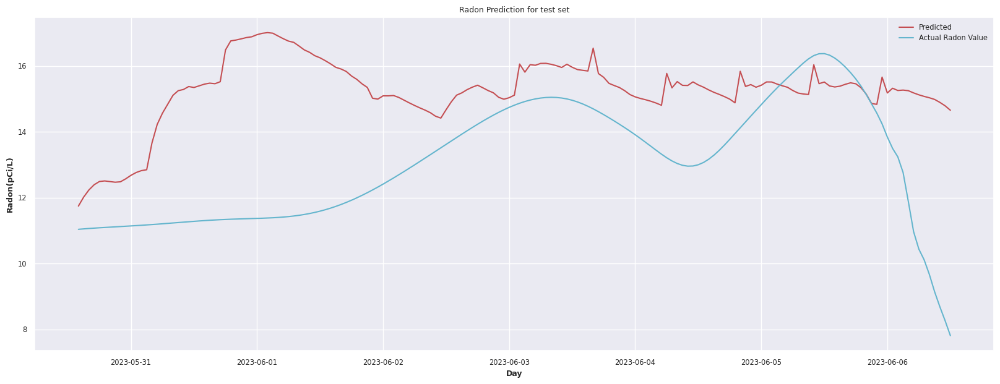

In [180]:
# plot the forecast
plt.figure(100, figsize=(20, 7))
plt.plot(dfY.index, dfY['Predicted'], color='r', label='Predicted')
plt.plot(dfY.index, dfY['Actual'], color='c', label='Actual Radon Value')
plt.legend()
plt.title('Radon Prediction for test set')
plt.xlabel('Day')
plt.ylabel('Radon(pCi/L)')
plt.show()

# Radon 13

In [67]:
df = df_radon['13'].copy()

In [68]:
# Denoising the Radon signal
def madev(d, axis=None):
    """ Mean absolute deviation of a signal """
    return np.mean(np.absolute(d - np.mean(d, axis)), axis)

In [69]:
def wavelet_denoising(x, wavelet='db4', level=5):
    coeff = pywt.wavedec(x, wavelet, mode="per")
    n = len(x) 
    sigma = (1/0.6745) * madev(coeff[-level])
    uthresh = sigma * np.sqrt(2 * np.log(len(x)))
    coeff[1:] = (pywt.threshold(i, value=uthresh, mode='hard') for i in coeff[1:])
    if len(x) % 2 ==0:
        return pywt.waverec(coeff, wavelet, mode='per')
    else:
        return pywt.waverec(coeff, wavelet, mode='per')[:n]

In [70]:
signal = df['Radon'].copy()
wavelet_name='coif17'
filtered = wavelet_denoising(signal, wavelet=wavelet_name, level=4)
df['Radon'] = filtered

In [71]:
weather_station = pd.read_csv('weather_data_combined.csv')

In [72]:
weather_station.drop('Date', axis=1, inplace=True)
weather_station['Simple Date'] = pd.to_datetime(weather_station['Simple Date'])
weather_station.sort_values(by='Simple Date', ascending=True, inplace=True)
weather_station['Simple Date'] = weather_station['Simple Date'].dt.floor('H')
weather_station = weather_station.resample('H', on = 'Simple Date').mean()
weather_station = weather_station.interpolate(method='linear', limit_direction='both')

In [73]:
weather_station

,Outdoor h Temperature (°F),Wind Speed (mph),Wind Gust (mph),Max Daily Gust (mph),Wind Direction (°),Hourly Rain (in/hr),Event Rain (in),Daily Rain (in),Weekly Rain (in),Monthly Rain (in),Yearly Rain (in),Relative Pressure (inHg),Humidity (%),Ultra-Violet Radiation Index,Solar Radiation (W/m^2),Absolute Pressure (inHg),Avg Wind Direction (10 mins) (°),Avg Wind Speed (10 mins) (mph)
Simple Date,,,,,,,,,,,,,,,,,,
2022-05-10 00:00:00,55.74,0.00,0.00,0.00,305.17,0.00,0.00,0.00,0.00,0.76,22.72,29.13,90.67,0.00,0.00,29.13,305.42,0.00
2022-05-10 01:00:00,54.79,0.00,0.00,0.00,302.58,0.00,0.00,0.00,0.00,0.76,22.72,29.12,91.58,0.00,0.00,29.12,302.67,0.00
2022-05-10 02:00:00,53.88,0.00,0.00,0.00,298.92,0.00,0.00,0.00,0.00,0.76,22.72,29.11,91.42,0.00,0.00,29.11,298.83,0.00
2022-05-10 03:00:00,52.49,0.00,0.00,0.00,302.92,0.00,0.00,0.00,0.00,0.76,22.72,29.12,92.83,0.00,0.00,29.12,302.83,0.00
2022-05-10 04:00:00,51.70,0.00,0.00,0.00,305.17,0.00,0.00,0.00,0.00,0.76,22.72,29.13,94.00,0.00,0.00,29.13,305.67,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-07 19:00:00,80.57,0.02,0.18,9.20,287.08,0.00,0.00,0.00,0.02,0.02,83.42,28.66,54.42,0.00,33.17,28.66,311.17,0.02
2023-06-07 20:00:00,77.16,0.00,0.00,9.20,309.83,0.00,0.00,0.00,0.02,0.02,83.42,28.66,58.42,0.00,5.92,28.66,310.00,0.00
2023-06-07 21:00:00,74.54,0.00,0.00,9.20,304.83,0.00,0.00,0.00,0.02,0.02,83.42,28.66,63.08,0.00,0.00,28.66,304.75,0.00


In [74]:
for column in weather_station.columns:
    df[column] = weather_station[column]

In [75]:
df

,AirPressure,Humidity,Radon,Temperature,Outdoor h Temperature (°F),Wind Speed (mph),Wind Gust (mph),Max Daily Gust (mph),Wind Direction (°),Hourly Rain (in/hr),...,Weekly Rain (in),Monthly Rain (in),Yearly Rain (in),Relative Pressure (inHg),Humidity (%),Ultra-Violet Radiation Index,Solar Radiation (W/m^2),Absolute Pressure (inHg),Avg Wind Direction (10 mins) (°),Avg Wind Speed (10 mins) (mph)
SyncDate,,,,,,,,,,,,,,,,,,,,,
2022-05-11 19:00:00,30.07,62.00,5.31,76.00,77.07,0.00,0.09,5.80,313.08,0.00,...,0.00,0.76,22.72,29.00,63.75,0.00,21.24,29.00,307.25,0.00
2022-05-11 20:00:00,30.07,66.00,5.17,75.00,74.87,0.00,0.00,5.80,302.08,0.00,...,0.00,0.76,22.72,29.01,68.42,0.00,2.57,29.01,301.17,0.00
2022-05-11 21:00:00,30.07,70.00,5.02,73.00,72.88,0.00,0.00,5.80,301.67,0.00,...,0.00,0.76,22.72,29.02,73.75,0.00,0.00,29.02,302.17,0.00
2022-05-11 22:00:00,30.08,73.00,4.87,71.00,71.14,0.00,0.00,5.80,306.00,0.00,...,0.00,0.76,22.72,29.05,73.75,0.00,0.00,29.05,305.83,0.00
2022-05-11 23:00:00,30.11,72.00,4.70,70.00,69.29,0.00,0.00,5.80,301.50,0.00,...,0.00,0.76,22.72,29.06,74.58,0.00,0.00,29.06,304.08,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-06 08:00:00,30.01,87.00,5.77,68.00,69.51,0.29,1.03,2.25,307.83,0.00,...,0.02,0.02,83.42,28.89,86.08,0.42,104.46,28.89,307.00,0.09
2023-06-06 09:00:00,30.00,85.00,5.71,71.00,76.43,0.43,1.67,4.80,317.17,0.00,...,0.02,0.02,83.42,28.90,74.75,2.75,333.82,28.90,311.42,0.35
2023-06-06 10:00:00,30.01,77.00,5.64,80.00,81.18,0.68,2.05,6.17,308.50,0.00,...,0.02,0.02,83.42,28.89,68.08,5.00,547.11,28.89,315.25,0.57


In [76]:
df.dropna(inplace=True)

In [77]:
df

,AirPressure,Humidity,Radon,Temperature,Outdoor h Temperature (°F),Wind Speed (mph),Wind Gust (mph),Max Daily Gust (mph),Wind Direction (°),Hourly Rain (in/hr),...,Weekly Rain (in),Monthly Rain (in),Yearly Rain (in),Relative Pressure (inHg),Humidity (%),Ultra-Violet Radiation Index,Solar Radiation (W/m^2),Absolute Pressure (inHg),Avg Wind Direction (10 mins) (°),Avg Wind Speed (10 mins) (mph)
SyncDate,,,,,,,,,,,,,,,,,,,,,
2022-05-11 19:00:00,30.07,62.00,5.31,76.00,77.07,0.00,0.09,5.80,313.08,0.00,...,0.00,0.76,22.72,29.00,63.75,0.00,21.24,29.00,307.25,0.00
2022-05-11 20:00:00,30.07,66.00,5.17,75.00,74.87,0.00,0.00,5.80,302.08,0.00,...,0.00,0.76,22.72,29.01,68.42,0.00,2.57,29.01,301.17,0.00
2022-05-11 21:00:00,30.07,70.00,5.02,73.00,72.88,0.00,0.00,5.80,301.67,0.00,...,0.00,0.76,22.72,29.02,73.75,0.00,0.00,29.02,302.17,0.00
2022-05-11 22:00:00,30.08,73.00,4.87,71.00,71.14,0.00,0.00,5.80,306.00,0.00,...,0.00,0.76,22.72,29.05,73.75,0.00,0.00,29.05,305.83,0.00
2022-05-11 23:00:00,30.11,72.00,4.70,70.00,69.29,0.00,0.00,5.80,301.50,0.00,...,0.00,0.76,22.72,29.06,74.58,0.00,0.00,29.06,304.08,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-06 08:00:00,30.01,87.00,5.77,68.00,69.51,0.29,1.03,2.25,307.83,0.00,...,0.02,0.02,83.42,28.89,86.08,0.42,104.46,28.89,307.00,0.09
2023-06-06 09:00:00,30.00,85.00,5.71,71.00,76.43,0.43,1.67,4.80,317.17,0.00,...,0.02,0.02,83.42,28.90,74.75,2.75,333.82,28.90,311.42,0.35
2023-06-06 10:00:00,30.01,77.00,5.64,80.00,81.18,0.68,2.05,6.17,308.50,0.00,...,0.02,0.02,83.42,28.89,68.08,5.00,547.11,28.89,315.25,0.57


In [78]:
# any missing values?
def gaps(df):
    if df.isnull().values.any():
        print("MISSING values:\n")
        mno.matrix(df)
    else:
        print("no missing values\n")
gaps(df)

no missing values



In [79]:
df.describe()

,AirPressure,Humidity,Radon,Temperature,Outdoor h Temperature (°F),Wind Speed (mph),Wind Gust (mph),Max Daily Gust (mph),Wind Direction (°),Hourly Rain (in/hr),...,Weekly Rain (in),Monthly Rain (in),Yearly Rain (in),Relative Pressure (inHg),Humidity (%),Ultra-Violet Radiation Index,Solar Radiation (W/m^2),Absolute Pressure (inHg),Avg Wind Direction (10 mins) (°),Avg Wind Speed (10 mins) (mph)
count,9378.00,9378.00,9378.00,9378.00,9378.00,9378.00,9378.00,9378.00,9378.00,9378.00,...,9378.00,9378.00,9378.00,9378.00,9378.00,9378.00,9378.00,9378.00,9378.00,9378.00
mean,30.09,82.47,8.81,66.32,62.98,0.23,0.90,4.70,297.71,0.01,...,0.54,2.88,52.63,29.02,76.37,0.96,119.51,29.02,308.30,0.15
std,0.14,14.90,12.58,16.32,14.85,0.37,1.15,3.49,28.84,0.04,...,0.85,2.98,18.94,0.14,17.72,1.79,200.38,0.14,18.81,0.31
min,29.52,23.00,-1.36,16.00,7.12,0.00,0.00,0.00,1.33,0.00,...,0.00,0.00,22.72,28.40,17.17,0.00,0.00,28.40,1.42,0.00
25%,30.00,75.00,1.22,54.00,52.55,0.00,0.00,1.48,289.00,0.00,...,0.00,0.76,37.85,28.93,65.00,0.00,0.00,28.93,302.17,0.00
50%,30.09,88.00,4.38,67.00,64.87,0.03,0.37,4.50,305.58,0.00,...,0.09,2.14,47.13,29.02,79.92,0.00,2.59,29.02,311.08,0.00
75%,30.18,94.00,12.80,76.52,73.89,0.34,1.56,6.90,316.08,0.00,...,0.72,3.72,69.48,29.11,91.58,1.00,144.45,29.11,318.75,0.15
max,30.62,100.00,135.58,137.00,98.02,5.35,8.02,20.60,347.67,1.23,...,3.90,14.68,83.42,29.51,99.00,8.00,872.65,29.51,348.08,3.15


In [80]:
for column in df.columns:
    df[column] = df[column].astype('float32')
    if column == 'Radon':
        continue
    else:
        for i in range(1,40):
            df[column+'_lag_'+str(i)] = df[column].shift(i)

In [81]:
df.fillna(0, inplace=True)

In [82]:
# check correlations of features with price
df_corr = df.corr(method="spearman")
print(df_corr.shape)
print("correlation with Radon:")
df_corrP = pd.DataFrame(df_corr["Radon"].sort_values(ascending=False))
df_corrP

(841, 841)
correlation with Radon:


,Radon
Radon,1.00
Temperature_lag_17,0.54
Temperature_lag_18,0.54
Temperature_lag_16,0.54
Temperature,0.54
...,...
Yearly Rain (in)_lag_35,-0.64
Yearly Rain (in)_lag_36,-0.64
Yearly Rain (in)_lag_37,-0.64
Yearly Rain (in)_lag_38,-0.64


In [83]:
# highest absolute correlations with Radon
pd.options.display.float_format = '{:,.2f}'.format
df_corrH = df_corrP[(df_corrP["Radon"]) >= 0.54103]
df_corrH

,Radon
Radon,1.00
Temperature_lag_17,0.54


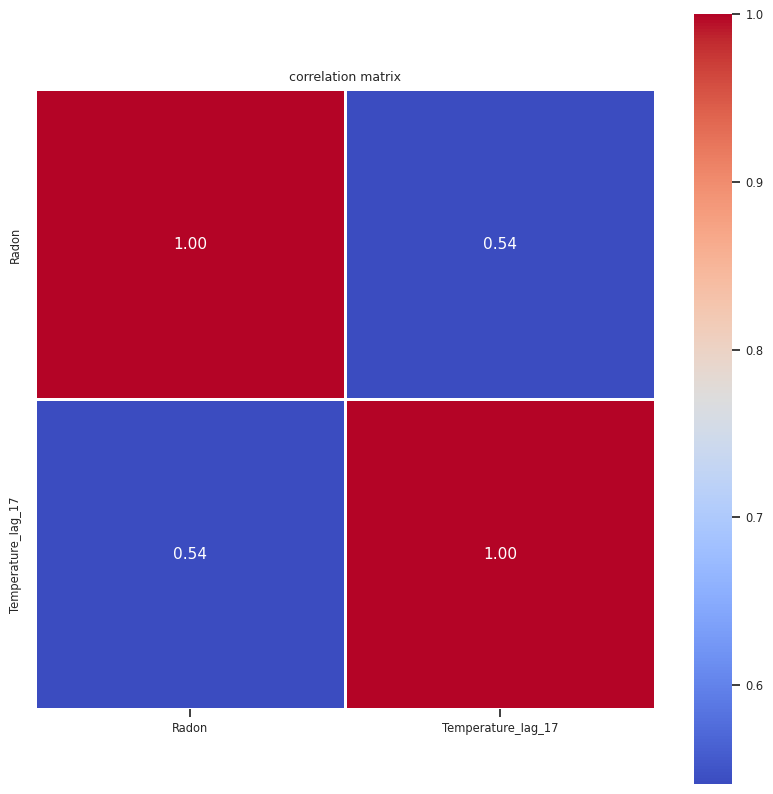

In [84]:
# helper method: correlation matrix as heatmap
def corr_heatmap(df):
    idx = df.corr().sort_values("Radon", ascending=False).index
    df_sorted = df.loc[:, idx]  # sort dataframe columns by their correlation 

    #plt.figure(figsize = (15,15))
    sns.set(font_scale=0.75)
    ax = sns.heatmap(df_sorted.corr(method='spearman').round(3), 
            annot=True, 
            square=True, 
            linewidths=.75, cmap="coolwarm", 
            fmt = ".2f", 
            annot_kws = {"size": 11})
    ax.xaxis.tick_bottom()
    plt.title("correlation matrix")
    plt.show()



# visualize correlations with price     

df4 = df[df_corrH.index]   # keep the components with at least modest correlations

plt.figure(figsize = (10,10))
corr_heatmap(df4)

In [85]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 9378 entries, 2022-05-11 19:00:00 to 2023-06-06 12:00:00
Freq: H
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Radon               9378 non-null   float32
 1   Temperature_lag_17  9378 non-null   float32
dtypes: float32(2)
memory usage: 146.5 KB


In [86]:
# create time series object for target variable
ts_P = TimeSeries.from_series(df4["Radon"], fill_missing_dates=True, freq="H") 

# check attributes of the time series
print("components:", ts_P.components)
print("duration:",ts_P.duration)
print("frequency:",ts_P.freq)
print("frequency:",ts_P.freq_str)
print("has date time index? (or else, it must have an integer index):",ts_P.has_datetime_index)
print("deterministic:",ts_P.is_deterministic)
print("univariate:",ts_P.is_univariate)

components: Index(['Radon'], dtype='object', name='component')
duration: 390 days 17:00:00
frequency: <Hour>
frequency: H
has date time index? (or else, it must have an integer index): True
deterministic: True
univariate: True


In [87]:
# create time series object for the feature columns
df_covF = df4.loc[:, df4.columns != "Radon"]
df_covF = df_covF.loc[:, df_covF.columns != 'Outdoor h Temperature (°F)']
ts_covF = TimeSeries.from_dataframe(df_covF, fill_missing_dates=True, freq="H")

# check attributes of the time series
print("components (columns) of feature time series:", ts_covF.components)
print("duration:",ts_covF.duration)
print("frequency:",ts_covF.freq)
print("frequency:",ts_covF.freq_str)
print("has date time index? (or else, it must have an integer index):",ts_covF.has_datetime_index)
print("deterministic:",ts_covF.is_deterministic)
print("univariate:",ts_covF.is_univariate)

components (columns) of feature time series: Index(['Temperature_lag_17'], dtype='object', name='component')
duration: 390 days 17:00:00
frequency: <Hour>
frequency: H
has date time index? (or else, it must have an integer index): True
deterministic: True
univariate: True


In [88]:
# example: operating with time series objects:
# we can also create a 3-dimensional numpy array from a time series object
# 3 dimensions: time (rows) / components (columns) / samples
ar_covF = ts_covF.all_values()
print(type(ar_covF))
ar_covF.shape

<class 'numpy.ndarray'>


(9378, 1, 1)

In [89]:
# example: operating with time series objects:
# we can also create a pandas series or dataframe from a time series object
df_covF = ts_covF.pd_dataframe()
type(df_covF)

pandas.core.frame.DataFrame

In [90]:
# example: operating with time series objects:
# we can also create a 3-dimensional numpy array from a time series object
# 3 dimensions: time (rows) / components (columns) / samples
ar_covF = ts_covF.all_values()
print(type(ar_covF))
ar_covF.shape

<class 'numpy.ndarray'>


(9378, 1, 1)

In [91]:
# example: operating with time series objects:
# we can also create a pandas series or dataframe from a time series object
df_covF = ts_covF.pd_dataframe()
type(df_covF)

pandas.core.frame.DataFrame

In [92]:
# train/test split and scaling of target variable
ts_train, ts_test = ts_P.split_after(split_point=9210)

print("training start:", ts_train.start_time())
print("training end:", ts_train.end_time())
print("training duration:",ts_train.duration)
print("test start:", ts_test.start_time())
print("test end:", ts_test.end_time())
print("test duration:", ts_test.duration)


scalerP = Scaler()
scalerP.fit_transform(ts_train)
ts_ttrain = scalerP.transform(ts_train)
ts_ttest = scalerP.transform(ts_test)    
ts_t = scalerP.transform(ts_P)

# make sure data are of type float
ts_t = ts_t.astype(np.float32)
ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)

print("first and last row of scaled Radon time series:")
pd.options.display.float_format = '{:,.2f}'.format
ts_t.pd_dataframe().iloc[[0,-1]]

training start: 2022-05-11 19:00:00
training end: 2023-05-30 13:00:00
training duration: 383 days 18:00:00
test start: 2023-05-30 14:00:00
test end: 2023-06-06 12:00:00
test duration: 6 days 22:00:00
first and last row of scaled Radon time series:


component,Radon
SyncDate,
2022-05-11 19:00:00,0.05
2023-06-06 12:00:00,0.05


In [93]:
# train/test split and scaling of feature covariates
covF_train, covF_test = ts_covF.split_after(split_point=9210)

scalerF = Scaler()
scalerF.fit_transform(covF_train)
covF_ttrain = scalerF.transform(covF_train) 
covF_ttest = scalerF.transform(covF_test)   
covF_t = scalerF.transform(ts_covF)  
# covF_t = ts_covF
# covF_ttrain = covF_train
# covF_ttest = covF_test
# make sure data are of type float
covF_ttrain = covF_ttrain.astype(np.float32)
covF_ttest = covF_ttest.astype(np.float32)

pd.options.display.float_format = '{:.2f}'.format
print("first and last row of scaled feature covariates:")
covF_t.pd_dataframe().iloc[[0,-1]]

first and last row of scaled feature covariates:


component,Temperature_lag_17
SyncDate,
2022-05-11 19:00:00,0.00
2023-06-06 12:00:00,0.55


In [94]:
print("first and last row of scaled target variable in training set: price:")
ts_ttrain.pd_dataframe().iloc[[0,-1]]

first and last row of scaled target variable in training set: price:


component,Radon
SyncDate,
2022-05-11 19:00:00,0.05
2023-05-30 13:00:00,0.03


In [95]:
def set_seed(seed_value):
    import random
    import numpy as np
    import torch

    random.seed(seed_value)
    np.random.seed(seed_value)
    torch.manual_seed(seed_value)
    torch.cuda.manual_seed(seed_value)
    torch.cuda.manual_seed_all(seed_value)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    pl.seed_everything(seed_value, workers=True)

In [96]:
import torch
from ray.air import session
from darts.utils .losses import SmapeLoss
from torchmetrics import MetricCollection, SymmetricMeanAbsolutePercentageError, MeanAbsolutePercentageError
def build_fit_tft_model(
    model_args,
    save_checkpoints=False,
    callbacks=None,
    save_model=False
):
#     BATCH_SIZE=64
    MAX_EPOCHS=500
    NR_EPOCHS_VAL_PERIOD=1
    set_seed(42)
    torch_metrics = MetricCollection([MeanAbsolutePercentageError(), SymmetricMeanAbsolutePercentageError()])

#     early_stopper = EarlyStopping(
#         monitor="val_loss",
#         patience=5,
#         min_delta=0.001,
#         mode='min',
#     )

#     if callbacks is None:
#         callbacks = [early_stopper]
#     else:
#         callbacks.append(early_stopper)
    
    #detect if GPU is available
#     if torch.cuda.is_available():
#         pl_trainer_kwargs = {
#             "accelerator": "gpu",
#             "gpus": -1,
#             "auto_select_gpus": True,
#             "callbacks": callbacks,
#             "enable_progress_bar":False,
#         }
#         num_workers=8
#     else:
#         pl_trainer_kwargs={
#             "callbacks": callbacks,
#         }
#         num_workers=0
    pl_trainer_kwargs={
            "accelerator": "gpu",
            "gpus":-1,
            "auto_select_gpus": True,
            "callbacks": callbacks,
            "enable_progress_bar": False,
        }
    encoders={"cyclic": {"future": ["hour"]},
             'transformer':Scaler()} if model_args['include_hour'] else None
   

    model = TFTModel(
        input_chunk_length=model_args['in_len'],
        output_chunk_length=model_args['out_len'],
        batch_size=model_args['batch_size'],
        n_epochs=MAX_EPOCHS,
        nr_epochs_val_period=NR_EPOCHS_VAL_PERIOD,
        model_name="NHiTS",
        hidden_size=int(model_args['out_len']+((2/3)*model_args['in_len'])),
        lstm_layers=model_args['lstm_layers'],
        num_attention_heads=model_args['num_attention_heads'],
        full_attention=model_args['full_attention'],
        feed_forward=model_args['feed_forward'],
        dropout=model_args['dropout'],
        hidden_continuous_size=model_args['hidden_continuous_size'],
        add_relative_index=model_args['add_relative_index'],
        norm_type=model_args['norm_type'],
        use_static_covariates=False,
        loss_fn=SmapeLoss(),
        optimizer_kwargs={'lr': model_args['lr']},
        add_encoders=encoders,
        log_tensorboard=False,
        force_reset=True,
        save_checkpoints=save_checkpoints,
        pl_trainer_kwargs=pl_trainer_kwargs,
        torch_metrics=torch_metrics,
        random_state=42
        )
    val_len = len(ts_test)
    val_series = ts_ttrain[-((val_len) + model_args['in_len']) :]
    ts_ttrain_input = ts_ttrain[:-(val_len )]
    model.fit(  ts_ttrain_input, 
                future_covariates=covF_t,
                val_series=val_series,
                val_future_covariates=covF_t,)
#     model.load_from_checkpoint(f"{model_args['model']} RNN model", best=True)
    ts_tpred = model.predict(
                series = ts_ttrain,
                future_covariates=covF_t,
                n = len(ts_ttest),
                verbose=True
    )
    ts_q = scalerP.inverse_transform(ts_tpred)
    q_smape = smape(ts_q, ts_test)
    session.report({'q_smape': q_smape})

In [97]:
def build_fit_tft_model_return(
    model_args,
    save_checkpoints=False,
    callbacks=None,
    save_model=False
):
#     BATCH_SIZE=64
    MAX_EPOCHS=500
    NR_EPOCHS_VAL_PERIOD=1
    set_seed(42)
    torch_metrics = MetricCollection([MeanAbsolutePercentageError(), SymmetricMeanAbsolutePercentageError()])

#     early_stopper = EarlyStopping(
#         monitor="val_loss",
#         patience=5,
#         min_delta=0.001,
#         mode='min',
#     )

#     if callbacks is None:
#         callbacks = [early_stopper]
#     else:
#         callbacks.append(early_stopper)
    
    #detect if GPU is available
#     if torch.cuda.is_available():
#         pl_trainer_kwargs = {
#             "accelerator": "gpu",
#             "gpus": -1,
#             "auto_select_gpus": True,
#             "callbacks": callbacks,
#             "enable_progress_bar":False,
#         }
#         num_workers=8
#     else:
#         pl_trainer_kwargs={
#             "callbacks": callbacks,
#         }
#         num_workers=0
    pl_trainer_kwargs={
            "accelerator": "gpu",
            "gpus":1,
            "auto_select_gpus": True,
            "callbacks": callbacks,
            "enable_progress_bar": False,
        }
    encoders={"cyclic": {"future": ["hour"]},
             'transformer':Scaler()} if model_args['include_hour'] else None
   

    model = TFTModel(
        input_chunk_length=model_args['in_len'],
        output_chunk_length=model_args['out_len'],
        batch_size=model_args['batch_size'],
        n_epochs=MAX_EPOCHS,
        nr_epochs_val_period=NR_EPOCHS_VAL_PERIOD,
        model_name="NHiTS",
        hidden_size=int(model_args['out_len']+((2/3)*model_args['in_len'])),
        lstm_layers=model_args['lstm_layers'],
        num_attention_heads=model_args['num_attention_heads'],
        full_attention=model_args['full_attention'],
        feed_forward=model_args['feed_forward'],
        dropout=model_args['dropout'],
        hidden_continuous_size=model_args['hidden_continuous_size'],
        add_relative_index=model_args['add_relative_index'],
        norm_type=model_args['norm_type'],
        use_static_covariates=False,
        loss_fn=SmapeLoss(),
        optimizer_kwargs={'lr': model_args['lr']},
        add_encoders=encoders,
        log_tensorboard=False,
        force_reset=True,
        save_checkpoints=save_checkpoints,
        pl_trainer_kwargs=pl_trainer_kwargs,
        torch_metrics=torch_metrics,
        random_state=42
        )
    val_len = len(ts_test)
    val_series = ts_ttrain[-((val_len) + model_args['in_len']) :]
    ts_ttrain_input = ts_ttrain[:-(val_len )]
    model.fit(  ts_ttrain_input, 
                future_covariates=covF_t,
                val_series=val_series,
                val_future_covariates=covF_t,)
#     model.load_from_checkpoint(f"{model_args['model']} RNN model", best=True)
#     ts_tpred = model.predict(
#                 series = ts_ttrain,
#                 past_covariates=covF_t,
#                 n = len(ts_ttest),
#                 verbose=True
#     )
#     ts_q = scalerP.inverse_transform(ts_tpred)
#     q_smape = smape(ts_q, ts_test)
#     session.report({'q_smape': q_smape})
    return model

In [98]:
from ray import tune
from ray.tune import CLIReporter
# from ray.tune.integration.pytorch_lightning import TuneReportCallback
from ray.tune.schedulers import ASHAScheduler, AsyncHyperBandScheduler
from ray.tune.search.optuna import OptunaSearch
from ray.tune.search import ConcurrencyLimiter
# tune_callback = TuneReportCallback(
#     {
#         "loss":"val_loss",
#         "sMAPE": "val_SymmetricMeanAbsolutePercentageError",
#     },
#     on="validation_end",
# )

early_stopper = EarlyStopping(
        monitor="val_SymmetricMeanAbsolutePercentageError",
        patience=3,
        mode='min',
    )

#define the hyperparameter search space
config = {
    "in_len": tune.randint(8,168),
    "out_len":tune.randint(1,24),
    "batch_size":tune.choice([32,64,128,256]),
    "lstm_layers":tune.choice([1,2,3]),
    "num_attention_heads":tune.randint(2,8),
    "full_attention":tune.choice([True, False]),
    "feed_forward":tune.choice(['GLU', 'Bilinear', 'ReGLU', 'GEGLU', 'SwiGLU', 'ReLU', 'GELU', 'GatedResidualNetwork']),
    "dropout":tune.uniform(0.1, 0.5),
    "hidden_continuous_size":tune.choice([8,16,32,64,128]),
    "add_relative_index":tune.choice([True, False]),
    "norm_type":tune.choice(['LayerNorm','RMSNorm','LayerNormNoBias']),
    "lr": tune.loguniform(1e-5, 1e-1),
    "include_hour":tune.choice([True, False]),
    "batch_size":tune.choice([16,32,64,128,256]),
    
}

reporter = CLIReporter(
    parameter_columns=list(config.keys()),
    metric_columns=["q_smape"])
resources_per_trial = {"cpu": 5, "gpu": 0.4}

num_samples = 100

algo = OptunaSearch()

algo = ConcurrencyLimiter(algo, max_concurrent=10)

scheduler = AsyncHyperBandScheduler(max_t=100, grace_period=10, reduction_factor=2)

train_fn_with_parameters = tune.with_parameters(build_fit_tft_model, callbacks=[early_stopper])

analysis = tune.run(
    train_fn_with_parameters,
    resources_per_trial=resources_per_trial,
    metric="q_smape",
    mode="min",
    config=config,
    num_samples=num_samples,
    search_alg=algo,
    scheduler = scheduler,
    progress_reporter=reporter,
    name="tft_tune_cov",
    raise_on_failed_trial=False
)

print("Best hyperparameters found were: ", analysis.best_config)

== Status ==
Current time: 2023-07-09 06:18:34 (running for 00:00:00.15)
Memory usage on this node: 17.5/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 5.0/48 CPUs, 0.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 1/100 (1 RUNNING)
+------------------------------+----------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------+-----------+------------------------+----------------------+-------------+-----------+----------------+
| Trial name                   | status   | loc                  |   in_len |   out_len |   batch_size |   lstm_layers |   num_attention_heads | full_attention   | feed_forward   |   dropout |   hidden_continuous_si | add_relative_index   | norm_type   |        lr | i

(build_fit_tft_model pid=1931468) Global seed set to 42
(build_fit_tft_model pid=1931468) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1931468)   rank_zero_deprecation(
(build_fit_tft_model pid=1931468) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1931468)   rank_zero_deprecation(
(build_fit_tft_model pid=1931468) Auto select gpus: [0]
(build_fit_tft_model pid=1931468) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 06:18:43 (running for 00:00:09.65)
Memory usage on this node: 22.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 9/100 (1 PENDING, 8 RUNNING)
+------------------------------+----------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+------------------------+----------------------+-----------------+-------------+----------------+
| Trial name                   | status   | loc                  |   in_len |   out_len |   batch_size |   lstm_layers |   num_attention_heads | full_attention   | feed_forward         |   dropout |   hidden_continuous_si | add_r

(build_fit_tft_model pid=1931698) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1931698)   rank_zero_deprecation(
(build_fit_tft_model pid=1931698) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1931698)   rank_zero_deprecation(
(build_fit_tft_model pid=1931706) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting 

(build_fit_tft_model pid=1931693) Auto select gpus: [0]
(build_fit_tft_model pid=1931693) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1931693) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1931693) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1931693) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1931693) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1931695) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1931695) 
(build_fit_tft_model pid=1931695)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1931695) --------

(build_fit_tft_model pid=1931698) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1931698)   rank_zero_warn(
(build_fit_tft_model pid=1931698) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1931698)   rank_zero_warn(
(build_fit_tft_model pid=1931706) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(lo

(build_fit_tft_model pid=1931693) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1931693)   rank_zero_warn(
(build_fit_tft_model pid=1931693) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1931693)   rank_zero_warn(
(build_fit_tft_model pid=1931693) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logg

== Status ==
Current time: 2023-07-09 06:18:48 (running for 00:00:14.66)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 9/100 (1 PENDING, 8 RUNNING)
+------------------------------+----------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+------------------------+----------------------+-----------------+-------------+----------------+
| Trial name                   | status   | loc                  |   in_len |   out_len |   batch_size |   lstm_layers |   num_attention_heads | full_attention   | feed_forward         |   dropout |   hidden_continuous_si | add_r

== Status ==
Current time: 2023-07-09 06:18:58 (running for 00:00:24.67)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 9/100 (1 PENDING, 8 RUNNING)
+------------------------------+----------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+------------------------+----------------------+-----------------+-------------+----------------+
| Trial name                   | status   | loc                  |   in_len |   out_len |   batch_size |   lstm_layers |   num_attention_heads | full_attention   | feed_forward         |   dropout |   hidden_continuous_si | add_r

== Status ==
Current time: 2023-07-09 06:19:08 (running for 00:00:34.68)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 9/100 (1 PENDING, 8 RUNNING)
+------------------------------+----------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+------------------------+----------------------+-----------------+-------------+----------------+
| Trial name                   | status   | loc                  |   in_len |   out_len |   batch_size |   lstm_layers |   num_attention_heads | full_attention   | feed_forward         |   dropout |   hidden_continuous_si | add_r

== Status ==
Current time: 2023-07-09 06:19:18 (running for 00:00:44.69)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 9/100 (1 PENDING, 8 RUNNING)
+------------------------------+----------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+------------------------+----------------------+-----------------+-------------+----------------+
| Trial name                   | status   | loc                  |   in_len |   out_len |   batch_size |   lstm_layers |   num_attention_heads | full_attention   | feed_forward         |   dropout |   hidden_continuous_si | add_r

== Status ==
Current time: 2023-07-09 06:19:28 (running for 00:00:54.70)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 9/100 (1 PENDING, 8 RUNNING)
+------------------------------+----------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+------------------------+----------------------+-----------------+-------------+----------------+
| Trial name                   | status   | loc                  |   in_len |   out_len |   batch_size |   lstm_layers |   num_attention_heads | full_attention   | feed_forward         |   dropout |   hidden_continuous_si | add_r

== Status ==
Current time: 2023-07-09 06:19:38 (running for 00:01:04.72)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 9/100 (1 PENDING, 8 RUNNING)
+------------------------------+----------+----------------------+----------+-----------+--------------+---------------+-----------------------+------------------+----------------------+-----------+------------------------+----------------------+-----------------+-------------+----------------+
| Trial name                   | status   | loc                  |   in_len |   out_len |   batch_size |   lstm_layers |   num_attention_heads | full_attention   | feed_forward         |   dropout |   hidden_continuous_si | add_r

(build_fit_tft_model pid=1931698) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1931698)   rank_zero_deprecation(
(build_fit_tft_model pid=1931698) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1931698)   rank_zero_deprecation(
(build_fit_tft_model pid=1931698) Auto select gpus: [0]
(build_fit_tft_model pid=1931698) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1931698) TPU available: False, usin

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


Trial name,date,done,episodes_total,experiment_id,experiment_tag,hostname,iterations_since_restore,node_ip,pid,q_smape,time_since_restore,time_this_iter_s,time_total_s,timestamp,timesteps_since_restore,timesteps_total,training_iteration,trial_id,warmup_time
build_fit_tft_model_028db477,2023-07-09_06-22-01,True,,d9534ee6c4ed48158510f32c051071b1,"3_add_relative_index=True,batch_size=256,dropout=0.2383,feed_forward=Bilinear,full_attention=False,hidden_continuous_size=64,in_len=37,include_hour=False,lr=0.0000,lstm_layers=3,norm_type=RMSNorm,num_attention_heads=4,out_len=8",ip-172-31-10-87,1,172.31.10.87,1931695,52.7876,197.741,197.741,197.741,1688883721,0,,1,028db477,0.00308895
build_fit_tft_model_059c0fa6,2023-07-09_07-00-22,True,,3ebf6e42946b4a94a803c17ba7a94720,"80_add_relative_index=True,batch_size=128,dropout=0.3862,feed_forward=ReGLU,full_attention=False,hidden_continuous_size=32,in_len=140,include_hour=True,lr=0.0034,lstm_layers=2,norm_type=LayerNormNoBias,num_attention_heads=2,out_len=17",ip-172-31-10-87,1,172.31.10.87,1952648,71.0584,102.443,102.443,102.443,1688886022,0,,1,059c0fa6,0.00283861
build_fit_tft_model_06c6e043,2023-07-09_06-25-30,True,,bae30a7bd33e49098c885302eee7486f,"22_add_relative_index=False,batch_size=64,dropout=0.3964,feed_forward=ReGLU,full_attention=False,hidden_continuous_size=32,in_len=163,include_hour=False,lr=0.0004,lstm_layers=3,norm_type=RMSNorm,num_attention_heads=6,out_len=22",ip-172-31-10-87,1,172.31.10.87,1936714,90.239,65.5023,65.5023,65.5023,1688883930,0,,1,06c6e043,0.0030694
build_fit_tft_model_0b5e8be0,2023-07-09_06-32-21,True,,ad4fe01222f543e39df293e4492157e3,"14_add_relative_index=True,batch_size=32,dropout=0.4590,feed_forward=ReLU,full_attention=False,hidden_continuous_size=16,in_len=21,include_hour=True,lr=0.0001,lstm_layers=1,norm_type=LayerNormNoBias,num_attention_heads=4,out_len=1",ip-172-31-10-87,1,172.31.10.87,1934605,194.067,669.429,669.429,669.429,1688884341,0,,1,0b5e8be0,0.00283957
build_fit_tft_model_10cdb2c3,2023-07-09_06-24-19,True,,49f4fd5618954b16a60d4596cab9a9b8,"19_add_relative_index=False,batch_size=64,dropout=0.3594,feed_forward=ReGLU,full_attention=False,hidden_continuous_size=32,in_len=163,include_hour=False,lr=0.0161,lstm_layers=1,norm_type=RMSNorm,num_attention_heads=6,out_len=23",ip-172-31-10-87,1,172.31.10.87,1935799,200,124.541,124.541,124.541,1688883859,0,,1,10cdb2c3,0.00371504
build_fit_tft_model_1968bec8,2023-07-09_06-29-34,True,,7b2f420881cf43c7a0d17012b9dc087a,"32_add_relative_index=False,batch_size=64,dropout=0.2970,feed_forward=ReGLU,full_attention=False,hidden_continuous_size=32,in_len=137,include_hour=False,lr=0.0020,lstm_layers=3,norm_type=RMSNorm,num_attention_heads=2,out_len=16",ip-172-31-10-87,1,172.31.10.87,1939414,88.6804,38.4763,38.4763,38.4763,1688884174,0,,1,1968bec8,0.00282311
build_fit_tft_model_1983dc49,2023-07-09_06-34-35,True,,4431762ae9f0417f9e7339e3e8d023d6,"43_add_relative_index=False,batch_size=16,dropout=0.1901,feed_forward=Bilinear,full_attention=False,hidden_continuous_size=64,in_len=59,include_hour=False,lr=0.0324,lstm_layers=3,norm_type=RMSNorm,num_attention_heads=4,out_len=7",ip-172-31-10-87,1,172.31.10.87,1942249,148.543,129.639,129.639,129.639,1688884475,0,,1,1983dc49,0.00309825
build_fit_tft_model_1a456c34,2023-07-09_07-20-14,True,,a03b389dc4454d8b89a89a4481ee0d94,"96_add_relative_index=True,batch_size=128,dropout=0.4038,feed_forward=SwiGLU,full_attention=False,hidden_continuous_size=32,in_len=146,include_hour=True,lr=0.0000,lstm_layers=1,norm_type=RMSNorm,num_attention_heads=2,out_len=11",ip-172-31-10-87,1,172.31.10.87,1956882,107.289,798.11,798.11,798.11,1688887214,0,,1,1a456c34,0.00288391
build_fit_tft_model_1c9fdbb9,2023-07-09_06-34-22,True,,7838fc0526304dea8634ffb84f6a5aa9,"41_add_relative_index=False,batch_size=16,dropout=0.2705,feed_forward=ReLU,full_attention=False,hidden_continuous_size=64,in_len=58,include_hour=False,lr=0.0002,lstm_layers=1,norm_type=RMSNorm,num_attention_heads=4,out_len=8",ip-172-31-10-87,1,172.31.

Predicting DataLoader 0: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


(build_fit_tft_model pid=1933353) Global seed set to 42
(build_fit_tft_model pid=1933353) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1933353)   rank_zero_deprecation(
(build_fit_tft_model pid=1933353) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1933353)   rank_zero_deprecation(


Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1931468) Auto select gpus: [0]
(build_fit_tft_model pid=1931468) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1931468) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1931468) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1931468) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1931468) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1931468) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


== Status ==
Current time: 2023-07-09 06:19:45 (running for 00:01:11.58)
Memory usage on this node: 35.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 10/100 (1 PENDING, 8 RUNNING, 1 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----

(build_fit_tft_model pid=1933353) Auto select gpus: [0]
(build_fit_tft_model pid=1933353) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1933353) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1933353) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1933353) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1933353) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1933353) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1933353) 
(build_fit_tft_model pid=1933353)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1933353) --------

== Status ==
Current time: 2023-07-09 06:19:50 (running for 00:01:16.65)
Memory usage on this node: 35.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 11/100 (1 PENDING, 8 RUNNING, 2 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----

(build_fit_tft_model pid=1933588) Auto select gpus: [0]
(build_fit_tft_model pid=1933588) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1933588) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1933588) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1933588) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1933588) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1933588) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1933588) 
(build_fit_tft_model pid=1933588)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1933588) --------

== Status ==
Current time: 2023-07-09 06:19:55 (running for 00:01:21.66)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 11/100 (1 PENDING, 8 RUNNING, 2 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----

== Status ==
Current time: 2023-07-09 06:20:05 (running for 00:01:31.67)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 11/100 (1 PENDING, 8 RUNNING, 2 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----

(build_fit_tft_model pid=1931700) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1931700)   rank_zero_deprecation(
(build_fit_tft_model pid=1931700) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1931700)   rank_zero_deprecation(
(build_fit_tft_model pid=1931700) Auto select gpus: [0]
(build_fit_tft_model pid=1931700) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1931700) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  9.20it/s]
== Status ==
Current time: 2023-07-09 06:20:11 (running for 00:01:37.65)
Memory usage on this node: 35.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 11/100 (8 RUNNING, 3 TERMINATED)
+------------------------------+------------+----------------------

(build_fit_tft_model pid=1933850) Global seed set to 42
(build_fit_tft_model pid=1933850) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1933850)   rank_zero_deprecation(
(build_fit_tft_model pid=1933850) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1933850)   rank_zero_deprecation(
(build_fit_tft_model pid=1933850) Auto select gpus: [0]
(build_fit_tft_model pid=1933850) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 06:20:21 (running for 00:01:47.22)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 12/100 (1 PENDING, 8 RUNNING, 3 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----

== Status ==
Current time: 2023-07-09 06:20:31 (running for 00:01:57.23)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 12/100 (1 PENDING, 8 RUNNING, 3 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----

== Status ==
Current time: 2023-07-09 06:20:41 (running for 00:02:07.25)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 12/100 (1 PENDING, 8 RUNNING, 3 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----

== Status ==
Current time: 2023-07-09 06:20:51 (running for 00:02:17.26)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 12/100 (1 PENDING, 8 RUNNING, 3 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----

(build_fit_tft_model pid=1931706) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1931706)   rank_zero_deprecation(
(build_fit_tft_model pid=1931706) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1931706)   rank_zero_deprecation(
(build_fit_tft_model pid=1931706) Auto select gpus: [0]
(build_fit_tft_model pid=1931706) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1931706) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


(build_fit_tft_model pid=1934123) Global seed set to 42
(build_fit_tft_model pid=1934123) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1934123)   rank_zero_deprecation(
(build_fit_tft_model pid=1934123) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1934123)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:20:58 (running for 00:02:24.66)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 13/100 (1 PENDING, 8 RUNNING, 4 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----

(build_fit_tft_model pid=1933850) Auto select gpus: [0]
(build_fit_tft_model pid=1933850) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1933850) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1933850) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1933850) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1933850) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 14.62it/s]


(build_fit_tft_model pid=1933850) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1934123) Auto select gpus: [0]
(build_fit_tft_model pid=1934123) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1934123) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1934123) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1934123) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1934123) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1934123) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1934123) 
(build_fit_tft_model pid=1934123)    | Name                              | Type    

== Status ==
Current time: 2023-07-09 06:21:04 (running for 00:02:30.66)
Memory usage on this node: 35.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 14/100 (1 PENDING, 8 RUNNING, 5 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----

(build_fit_tft_model pid=1934359) Auto select gpus: [0]
(build_fit_tft_model pid=1934359) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1934359) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1934359) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1934359) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1934359) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1931703) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1931703)   rank_zero_deprecation(
(build_fit_tft_model pid=1931703) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1931703)   rank_zero_deprecation(
(build_fit_tft_model pid=1931703) Auto select gpus: [0]
(build_fit_tft_model pid=1931703) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1931703) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


(build_fit_tft_model pid=1934605) Global seed set to 42
(build_fit_tft_model pid=1934605) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1934605)   rank_zero_deprecation(
(build_fit_tft_model pid=1934605) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1934605)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:21:12 (running for 00:02:38.66)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 15/100 (1 PENDING, 8 RUNNING, 6 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----

(build_fit_tft_model pid=1934605) Auto select gpus: [0]
(build_fit_tft_model pid=1934605) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1934605) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1934605) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1934605) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1934605) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1934605) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1934605) 
(build_fit_tft_model pid=1934605)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1934605) --------

== Status ==
Current time: 2023-07-09 06:21:17 (running for 00:02:43.67)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 15/100 (1 PENDING, 8 RUNNING, 6 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----

== Status ==
Current time: 2023-07-09 06:21:27 (running for 00:02:53.69)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 15/100 (1 PENDING, 8 RUNNING, 6 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----

(build_fit_tft_model pid=1933588) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1933588)   rank_zero_deprecation(
(build_fit_tft_model pid=1933588) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1933588)   rank_zero_deprecation(
(build_fit_tft_model pid=1933588) Auto select gpus: [0]
(build_fit_tft_model pid=1933588) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1933588) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]


(build_fit_tft_model pid=1934859) Global seed set to 42
(build_fit_tft_model pid=1934859) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1934859)   rank_zero_deprecation(
(build_fit_tft_model pid=1934859) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1934859)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:21:40 (running for 00:03:06.66)
Memory usage on this node: 35.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 16/100 (1 PENDING, 8 RUNNING, 7 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----

(build_fit_tft_model pid=1934859) Auto select gpus: [0]
(build_fit_tft_model pid=1934859) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1934859) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1934859) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1934859) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1934859) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1934859) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1934859) 
(build_fit_tft_model pid=1934859)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1934859) --------

== Status ==
Current time: 2023-07-09 06:21:45 (running for 00:03:11.67)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 16/100 (1 PENDING, 8 RUNNING, 7 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----

== Status ==
Current time: 2023-07-09 06:21:55 (running for 00:03:21.69)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 16/100 (1 PENDING, 8 RUNNING, 7 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----

(build_fit_tft_model pid=1933353) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1933353)   rank_zero_deprecation(
(build_fit_tft_model pid=1933353) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1933353)   rank_zero_deprecation(
(build_fit_tft_model pid=1933353) Auto select gpus: [0]
(build_fit_tft_model pid=1933353) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1933353) TPU available: False, usin

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1931695) Auto select gpus: [0]
(build_fit_tft_model pid=1931695) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1931695) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1931695) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1931695) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1931695) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1931695) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  9.18it/s]
== Status ==
Current time: 2023-07-09 06:22:01 (running for 00:03:27.12)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 17/100 (1 PENDING, 8 RUNNING, 8 TERMINATED)
+------------------------------+------------+-----------

(build_fit_tft_model pid=1935153) Global seed set to 42
(build_fit_tft_model pid=1935153) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1935153)   rank_zero_deprecation(
(build_fit_tft_model pid=1935153) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1935153)   rank_zero_deprecation(
(build_fit_tft_model pid=1935153) Auto select gpus: [0]
(build_fit_tft_model pid=1935153) GPU available: True (cuda), used: True
(bui

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]
== Status ==
Current time: 2023-07-09 06:22:08 (running for 00:03:34.75)
Memory usage on this node: 35.5/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 18/100 (1 PENDING, 8 RUNNING, 9 TERMINATED)
+------------------------------+------------+-----------

(build_fit_tft_model pid=1935391) Global seed set to 42
(build_fit_tft_model pid=1935391) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1935391)   rank_zero_deprecation(
(build_fit_tft_model pid=1935391) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1935391)   rank_zero_deprecation(


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 13.17it/s]


(build_fit_tft_model pid=1935391) Auto select gpus: [0]
(build_fit_tft_model pid=1935391) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1935391) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1935391) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1935391) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1935391) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1934359) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use 

(build_fit_tft_model pid=1935799) Global seed set to 42
(build_fit_tft_model pid=1935799) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1935799)   rank_zero_deprecation(
(build_fit_tft_model pid=1935799) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1935799)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:22:15 (running for 00:03:41.69)
Memory usage on this node: 34.6/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 20/100 (1 PENDING, 8 RUNNING, 11 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

(build_fit_tft_model pid=1935633) Auto select gpus: [0]
(build_fit_tft_model pid=1935633) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1935633) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1935633) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1935633) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1935633) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1935799) Auto select gpus: [0]
(build_fit_tft_model pid=1935799) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1935799) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1935799) IPU available: False, using: 0 I

(build_fit_tft_model pid=1935633) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1935633)   rank_zero_warn(
(build_fit_tft_model pid=1935633) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1935633)   rank_zero_warn(
(build_fit_tft_model pid=1935799) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger

== Status ==
Current time: 2023-07-09 06:22:20 (running for 00:03:46.71)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 20/100 (1 PENDING, 8 RUNNING, 11 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:22:25 (running for 00:03:51.72)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 20/100 (1 PENDING, 8 RUNNING, 11 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:22:30 (running for 00:03:56.73)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 20/100 (1 PENDING, 8 RUNNING, 11 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:22:35 (running for 00:04:01.73)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 20/100 (1 PENDING, 8 RUNNING, 11 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:22:40 (running for 00:04:06.74)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 20/100 (1 PENDING, 8 RUNNING, 11 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:22:45 (running for 00:04:11.75)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 20/100 (1 PENDING, 8 RUNNING, 11 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:22:50 (running for 00:04:16.76)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 20/100 (1 PENDING, 8 RUNNING, 11 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:22:55 (running for 00:04:21.77)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 20/100 (1 PENDING, 8 RUNNING, 11 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:23:00 (running for 00:04:26.78)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 20/100 (1 PENDING, 8 RUNNING, 11 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:23:05 (running for 00:04:31.79)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 20/100 (1 PENDING, 8 RUNNING, 11 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 27.35it/s]


(build_fit_tft_model pid=1931755) Auto select gpus: [0]
(build_fit_tft_model pid=1931755) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1931755) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1931755) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1931755) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1931755) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1931755) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1936155) Global seed set to 42
(build_fit_tft_model pid=1936155) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_conn

== Status ==
Current time: 2023-07-09 06:23:15 (running for 00:04:41.69)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 21/100 (1 PENDING, 8 RUNNING, 12 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

(build_fit_tft_model pid=1936155) Auto select gpus: [0]
(build_fit_tft_model pid=1936155) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1936155) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1936155) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1936155) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1936155) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1936155) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1936155) 
(build_fit_tft_model pid=1936155)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1936155) --------

== Status ==
Current time: 2023-07-09 06:23:20 (running for 00:04:46.70)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 21/100 (1 PENDING, 8 RUNNING, 12 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:23:25 (running for 00:04:51.71)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 21/100 (1 PENDING, 8 RUNNING, 12 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:23:30 (running for 00:04:56.72)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 21/100 (1 PENDING, 8 RUNNING, 12 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:23:35 (running for 00:05:01.73)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 21/100 (1 PENDING, 8 RUNNING, 12 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:23:40 (running for 00:05:06.74)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 21/100 (1 PENDING, 8 RUNNING, 12 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:23:45 (running for 00:05:11.75)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 21/100 (1 PENDING, 8 RUNNING, 12 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:23:50 (running for 00:05:16.76)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 21/100 (1 PENDING, 8 RUNNING, 12 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:23:55 (running for 00:05:21.77)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 21/100 (1 PENDING, 8 RUNNING, 12 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:24:00 (running for 00:05:26.78)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 21/100 (1 PENDING, 8 RUNNING, 12 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

(build_fit_tft_model pid=1935153) Auto select gpus: [0]
(build_fit_tft_model pid=1935153) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1935153) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1935153) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1935153) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1935153) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1935153) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


(build_fit_tft_model pid=1936464) Global seed set to 42
(build_fit_tft_model pid=1936464) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1936464)   rank_zero_deprecation(
(build_fit_tft_model pid=1936464) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1936464)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:24:07 (running for 00:05:33.70)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 22/100 (1 PENDING, 8 RUNNING, 13 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

(build_fit_tft_model pid=1936464) Auto select gpus: [0]
(build_fit_tft_model pid=1936464) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1936464) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1936464) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1936464) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1936464) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1936464) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1936464) 
(build_fit_tft_model pid=1936464)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1936464) --------

== Status ==
Current time: 2023-07-09 06:24:12 (running for 00:05:38.71)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 22/100 (1 PENDING, 8 RUNNING, 13 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:24:17 (running for 00:05:43.72)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 22/100 (1 PENDING, 8 RUNNING, 13 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

Predicting: 0it [00:00, ?it/s]
Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1935799) Auto select gpus: [0]
(build_fit_tft_model pid=1935799) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1935799) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1935799) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1935799) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1935799) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1935799) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 26.38it/s]


(build_fit_tft_model pid=1936714) Global seed set to 42
(build_fit_tft_model pid=1936714) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1936714)   rank_zero_deprecation(
(build_fit_tft_model pid=1936714) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1936714)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:24:25 (running for 00:05:51.70)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 23/100 (1 PENDING, 8 RUNNING, 14 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

(build_fit_tft_model pid=1936714) Auto select gpus: [0]
(build_fit_tft_model pid=1936714) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1936714) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1936714) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1936714) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1936714) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1936714) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1936714) 
(build_fit_tft_model pid=1936714)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1936714) --------

== Status ==
Current time: 2023-07-09 06:24:30 (running for 00:05:56.71)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 23/100 (1 PENDING, 8 RUNNING, 14 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1934859) Auto select gpus: [0]
(build_fit_tft_model pid=1934859) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1934859) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1934859) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1934859) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1934859) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1934859) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 21.40it/s]


(build_fit_tft_model pid=1936960) Global seed set to 42
(build_fit_tft_model pid=1936960) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1936960)   rank_zero_deprecation(
(build_fit_tft_model pid=1936960) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1936960)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:24:39 (running for 00:06:05.70)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 24/100 (1 PENDING, 8 RUNNING, 15 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

(build_fit_tft_model pid=1936960) Auto select gpus: [0]
(build_fit_tft_model pid=1936960) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1936960) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1936960) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1936960) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1936960) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1936960) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1936960) 
(build_fit_tft_model pid=1936960)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1936960) --------

== Status ==
Current time: 2023-07-09 06:24:44 (running for 00:06:10.71)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 24/100 (1 PENDING, 8 RUNNING, 15 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:24:49 (running for 00:06:15.72)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 24/100 (1 PENDING, 8 RUNNING, 15 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:24:54 (running for 00:06:20.73)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 24/100 (1 PENDING, 8 RUNNING, 15 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:24:59 (running for 00:06:25.75)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 24/100 (1 PENDING, 8 RUNNING, 15 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:25:04 (running for 00:06:30.76)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 24/100 (1 PENDING, 8 RUNNING, 15 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:25:09 (running for 00:06:35.77)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 24/100 (1 PENDING, 8 RUNNING, 15 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:25:14 (running for 00:06:40.78)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 24/100 (1 PENDING, 8 RUNNING, 15 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:25:19 (running for 00:06:45.79)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 24/100 (1 PENDING, 8 RUNNING, 15 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:25:24 (running for 00:06:50.80)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 24/100 (1 PENDING, 8 RUNNING, 15 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:25:29 (running for 00:06:55.80)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 24/100 (1 PENDING, 8 RUNNING, 15 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1936714) Auto select gpus: [0]
(build_fit_tft_model pid=1936714) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1936714) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1936714) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1936714) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1936714) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1936714) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 18.70it/s]


(build_fit_tft_model pid=1937244) Global seed set to 42
(build_fit_tft_model pid=1937244) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1937244)   rank_zero_deprecation(
(build_fit_tft_model pid=1937244) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1937244)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:25:37 (running for 00:07:03.71)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 25/100 (1 PENDING, 8 RUNNING, 16 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

(build_fit_tft_model pid=1937244) Auto select gpus: [0]
(build_fit_tft_model pid=1937244) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1937244) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1937244) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1937244) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1937244) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1937244) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1937244) 
(build_fit_tft_model pid=1937244)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1937244) --------

== Status ==
Current time: 2023-07-09 06:25:42 (running for 00:07:08.72)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 25/100 (1 PENDING, 8 RUNNING, 16 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:25:47 (running for 00:07:13.73)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 25/100 (1 PENDING, 8 RUNNING, 16 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:25:52 (running for 00:07:18.74)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 25/100 (1 PENDING, 8 RUNNING, 16 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:25:57 (running for 00:07:23.75)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 25/100 (1 PENDING, 8 RUNNING, 16 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1936464) Auto select gpus: [0]
(build_fit_tft_model pid=1936464) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1936464) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1936464) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1936464) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1936464) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1936464) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 24.90it/s]


(build_fit_tft_model pid=1937498) Global seed set to 42
(build_fit_tft_model pid=1937498) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1937498)   rank_zero_deprecation(
(build_fit_tft_model pid=1937498) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1937498)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:26:07 (running for 00:07:33.72)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 26/100 (1 PENDING, 8 RUNNING, 17 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

(build_fit_tft_model pid=1937498) Auto select gpus: [0]
(build_fit_tft_model pid=1937498) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1937498) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1937498) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1937498) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1937498) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1937498) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1937498) 
(build_fit_tft_model pid=1937498)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1937498) --------

== Status ==
Current time: 2023-07-09 06:26:12 (running for 00:07:38.73)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 26/100 (1 PENDING, 8 RUNNING, 17 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:26:17 (running for 00:07:43.75)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 26/100 (1 PENDING, 8 RUNNING, 17 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:26:22 (running for 00:07:48.76)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 26/100 (1 PENDING, 8 RUNNING, 17 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:26:27 (running for 00:07:53.77)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 26/100 (1 PENDING, 8 RUNNING, 17 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:26:32 (running for 00:07:58.78)
Memory usage on this node: 37.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 26/100 (1 PENDING, 8 RUNNING, 17 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:26:37 (running for 00:08:03.79)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 26/100 (1 PENDING, 8 RUNNING, 17 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:26:42 (running for 00:08:08.80)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 26/100 (1 PENDING, 8 RUNNING, 17 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:26:47 (running for 00:08:13.81)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 26/100 (1 PENDING, 8 RUNNING, 17 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:26:52 (running for 00:08:18.82)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 26/100 (1 PENDING, 8 RUNNING, 17 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:26:57 (running for 00:08:23.83)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 26/100 (1 PENDING, 8 RUNNING, 17 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:27:02 (running for 00:08:28.85)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 26/100 (1 PENDING, 8 RUNNING, 17 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 06:27:07 (running for 00:08:33.85)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 26/100 (1 PENDING, 8 RUNNING, 17 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1937244) Auto select gpus: [0]
(build_fit_tft_model pid=1937244) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1937244) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1937244) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1937244) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1937244) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1937244) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 14.65it/s]


(build_fit_tft_model pid=1937878) Global seed set to 42
(build_fit_tft_model pid=1937878) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1937878)   rank_zero_deprecation(
(build_fit_tft_model pid=1937878) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1937878)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:27:15 (running for 00:08:41.73)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 7d03fe4d with q_smape=25.468477606773376 and parameters={'in_len': 158, 'out_len': 18, 'batch_size': 64, 'lstm_layers': 1, 'num_attention_heads': 3, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3468532341183337, 'hidden_continuous_size': 64, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.02674371295231844, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 27/100 (1 PENDING, 8 RUNNING, 18 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

(build_fit_tft_model pid=1937878) Auto select gpus: [0]
(build_fit_tft_model pid=1937878) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1937878) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1937878) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1937878) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1937878) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1937878) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1937878) 
(build_fit_tft_model pid=1937878)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1937878) --------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1936155) Auto select gpus: [0]
(build_fit_tft_model pid=1936155) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1936155) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1936155) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1936155) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1936155) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1936155) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


== Status ==
Current time: 2023-07-09 06:27:20 (running for 00:08:46.74)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 27/100 (1 PENDING, 8 RUNNING, 18 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 16.82it/s]


(build_fit_tft_model pid=1938125) Global seed set to 42
(build_fit_tft_model pid=1938125) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1938125)   rank_zero_deprecation(
(build_fit_tft_model pid=1938125) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1938125)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:27:27 (running for 00:08:53.73)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 28/100 (1 PENDING, 8 RUNNING, 19 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1938125) Auto select gpus: [0]
(build_fit_tft_model pid=1938125) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1938125) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1938125) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1938125) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1938125) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1938125) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1938125) 
(build_fit_tft_model pid=1938125)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1938125) --------

== Status ==
Current time: 2023-07-09 06:27:32 (running for 00:08:58.74)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 28/100 (1 PENDING, 8 RUNNING, 19 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.81it/s]


(build_fit_tft_model pid=1937498) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1937498)   rank_zero_deprecation(
(build_fit_tft_model pid=1937498) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1937498)   rank_zero_deprecation(
(build_fit_tft_model pid=1937498) Auto select gpus: [0]
(build_fit_tft_model pid=1937498) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1937498) TPU available: False, usin

== Status ==
Current time: 2023-07-09 06:27:41 (running for 00:09:07.73)
Memory usage on this node: 35.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 29/100 (1 PENDING, 8 RUNNING, 20 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1938371) Auto select gpus: [0]
(build_fit_tft_model pid=1938371) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1938371) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1938371) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1938371) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1938371) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1938371) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1938371) 
(build_fit_tft_model pid=1938371)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1938371) --------

== Status ==
Current time: 2023-07-09 06:27:46 (running for 00:09:12.74)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 29/100 (1 PENDING, 8 RUNNING, 20 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:27:51 (running for 00:09:17.75)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 29/100 (1 PENDING, 8 RUNNING, 20 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:27:56 (running for 00:09:22.76)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 29/100 (1 PENDING, 8 RUNNING, 20 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 18.39it/s]


(build_fit_tft_model pid=1936960) Auto select gpus: [0]
(build_fit_tft_model pid=1936960) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1936960) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1936960) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1936960) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1936960) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1936960) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1937878) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1937878)   rank_zero_deprecation(
(build_fit_tft_model pid=1937878) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1937878)   rank_zero_deprecation(
(build_fit_tft_model pid=1937878) Auto select gpus: [0]
(build_fit_tft_model pid=1937878) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1937878) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.22it/s]
== Status ==
Current time: 2023-07-09 06:28:02 (running for 00:09:28.08)
Memory usage on this node: 35.5/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 30/100 (1 PENDING, 8 RUNNING, 21 TERMINATED)
+------------------------------+------------+-------

(build_fit_tft_model pid=1938622) Global seed set to 42
(build_fit_tft_model pid=1938622) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1938622)   rank_zero_deprecation(
(build_fit_tft_model pid=1938622) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1938622)   rank_zero_deprecation(
(build_fit_tft_model pid=1938622) Auto select gpus: [0]
(build_fit_tft_model pid=1938622) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 06:28:08 (running for 00:09:34.73)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 31/100 (1 PENDING, 8 RUNNING, 22 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1938858) Auto select gpus: [0]
(build_fit_tft_model pid=1938858) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1938858) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1938858) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1938858) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1938858) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1938858) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1938858) 
(build_fit_tft_model pid=1938858)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1938858) --------

== Status ==
Current time: 2023-07-09 06:28:13 (running for 00:09:39.74)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 31/100 (1 PENDING, 8 RUNNING, 22 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:28:18 (running for 00:09:44.75)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 31/100 (1 PENDING, 8 RUNNING, 22 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:28:23 (running for 00:09:49.76)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 31/100 (1 PENDING, 8 RUNNING, 22 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:28:28 (running for 00:09:54.77)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 31/100 (1 PENDING, 8 RUNNING, 22 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 18.82it/s]


(build_fit_tft_model pid=1935391) Auto select gpus: [0]
(build_fit_tft_model pid=1935391) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1935391) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1935391) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1935391) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1935391) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1935391) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1939165) Global seed set to 42
(build_fit_tft_model pid=1939165) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_conn

== Status ==
Current time: 2023-07-09 06:28:38 (running for 00:10:04.74)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 32/100 (1 PENDING, 8 RUNNING, 23 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1939165) Auto select gpus: [0]
(build_fit_tft_model pid=1939165) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1939165) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1939165) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1939165) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1939165) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1939165) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1939165) 
(build_fit_tft_model pid=1939165)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1939165) --------

== Status ==
Current time: 2023-07-09 06:28:43 (running for 00:10:09.75)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 32/100 (1 PENDING, 8 RUNNING, 23 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:28:48 (running for 00:10:14.76)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 32/100 (1 PENDING, 8 RUNNING, 23 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1938858) Auto select gpus: [0]
(build_fit_tft_model pid=1938858) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1938858) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1938858) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1938858) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1938858) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1938858) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 20.87it/s]


(build_fit_tft_model pid=1939414) Global seed set to 42
(build_fit_tft_model pid=1939414) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1939414)   rank_zero_deprecation(
(build_fit_tft_model pid=1939414) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1939414)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:28:56 (running for 00:10:22.73)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 33/100 (1 PENDING, 8 RUNNING, 24 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1939414) Auto select gpus: [0]
(build_fit_tft_model pid=1939414) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1939414) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1939414) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1939414) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1939414) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1939414) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1939414) 
(build_fit_tft_model pid=1939414)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1939414) --------

== Status ==
Current time: 2023-07-09 06:29:01 (running for 00:10:27.75)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 33/100 (1 PENDING, 8 RUNNING, 24 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1938371) Auto select gpus: [0]
(build_fit_tft_model pid=1938371) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1938371) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1938371) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1938371) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1938371) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1938371) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 21.95it/s]
== Status ==
Current time: 2023-07-09 06:29:07 (running for 00:10:33.71)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 33/100 (8 RUNNING, 25 TERMINATED)
+------------------------------+------------+------------------

(build_fit_tft_model pid=1939660) Global seed set to 42
(build_fit_tft_model pid=1939660) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1939660)   rank_zero_deprecation(
(build_fit_tft_model pid=1939660) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1939660)   rank_zero_deprecation(
(build_fit_tft_model pid=1939660) Auto select gpus: [0]
(build_fit_tft_model pid=1939660) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 06:29:17 (running for 00:10:43.30)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 34/100 (1 PENDING, 8 RUNNING, 25 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:29:22 (running for 00:10:48.31)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 34/100 (1 PENDING, 8 RUNNING, 25 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:29:27 (running for 00:10:53.32)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 34/100 (1 PENDING, 8 RUNNING, 25 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1939165) Auto select gpus: [0]
(build_fit_tft_model pid=1939165) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1939165) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1939165) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1939165) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1939165) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1939165) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 23.40it/s]


(build_fit_tft_model pid=1934123) Auto select gpus: [0]
(build_fit_tft_model pid=1934123) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1934123) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1934123) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1934123) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1934123) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1934123) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.26it/s]


(build_fit_tft_model pid=1939414) Auto select gpus: [0]
(build_fit_tft_model pid=1939414) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1939414) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1939414) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1939414) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1939414) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1939414) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 22.34it/s]
== Status ==
Current time: 2023-07-09 06:29:32 (running for 00:10:58.33)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 35.0/48 CPUs, 2.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 35/100 (1 PENDING, 7 RUNNING, 27 TERMINATED)
+------------------------------+------------+----------------------

(build_fit_tft_model pid=1939914) Global seed set to 42
(build_fit_tft_model pid=1939914) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1939914)   rank_zero_deprecation(
(build_fit_tft_model pid=1939914) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1939914)   rank_zero_deprecation(
(build_fit_tft_model pid=1939914) Auto select gpus: [0]
(build_fit_tft_model pid=1939914) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 06:29:41 (running for 00:11:07.78)
Memory usage on this node: 34.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 37/100 (1 PENDING, 8 RUNNING, 28 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1940158) Auto select gpus: [0]
(build_fit_tft_model pid=1940158) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1940158) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1940158) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1940158) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1940158) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1940160) Auto select gpus: [0]
(build_fit_tft_model pid=1940160) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1940160) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1940160) IPU available: False, using: 0 I

(build_fit_tft_model pid=1940160) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1940160)   rank_zero_warn(
(build_fit_tft_model pid=1940160) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1940160)   rank_zero_warn(
(build_fit_tft_model pid=1940160) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logg

== Status ==
Current time: 2023-07-09 06:29:46 (running for 00:11:12.79)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 37/100 (1 PENDING, 8 RUNNING, 28 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1938125) Auto select gpus: [0]
(build_fit_tft_model pid=1938125) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1938125) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1938125) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1938125) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1938125) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1938125) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 18.06it/s]


(build_fit_tft_model pid=1940640) Global seed set to 42
(build_fit_tft_model pid=1940640) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1940640)   rank_zero_deprecation(
(build_fit_tft_model pid=1940640) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1940640)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:29:55 (running for 00:11:21.75)
Memory usage on this node: 35.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 38/100 (1 PENDING, 8 RUNNING, 29 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1940640) Auto select gpus: [0]
(build_fit_tft_model pid=1940640) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1940640) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1940640) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1940640) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1940640) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1940640) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1940640) 
(build_fit_tft_model pid=1940640)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1940640) --------

== Status ==
Current time: 2023-07-09 06:30:00 (running for 00:11:26.76)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 38/100 (1 PENDING, 8 RUNNING, 29 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:30:05 (running for 00:11:31.77)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 38/100 (1 PENDING, 8 RUNNING, 29 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:30:10 (running for 00:11:36.78)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 38/100 (1 PENDING, 8 RUNNING, 29 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:30:15 (running for 00:11:41.79)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 38/100 (1 PENDING, 8 RUNNING, 29 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:30:20 (running for 00:11:46.80)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 38/100 (1 PENDING, 8 RUNNING, 29 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:30:25 (running for 00:11:51.81)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 38/100 (1 PENDING, 8 RUNNING, 29 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1938622) Auto select gpus: [0]
(build_fit_tft_model pid=1938622) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1938622) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1938622) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1938622) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1938622) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1938622) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 23.94it/s]


(build_fit_tft_model pid=1939914) Auto select gpus: [0]
(build_fit_tft_model pid=1939914) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1939914) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1939914) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1939914) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1939914) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1939914) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 22.67it/s]
== Status ==
Current time: 2023-07-09 06:30:31 (running for 00:11:57.12)
Memory usage on this node: 35.6/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 39/100 (1 PENDING, 8 RUNNING, 30 TERMINATED)
+------------------------------+------------+-------

(build_fit_tft_model pid=1940901) Global seed set to 42
(build_fit_tft_model pid=1940901) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1940901)   rank_zero_deprecation(
(build_fit_tft_model pid=1940901) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1940901)   rank_zero_deprecation(
(build_fit_tft_model pid=1940901) Auto select gpus: [0]
(build_fit_tft_model pid=1940901) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 06:30:36 (running for 00:12:02.76)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 40/100 (1 PENDING, 8 RUNNING, 31 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1941137) Auto select gpus: [0]
(build_fit_tft_model pid=1941137) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1941137) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1941137) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1941137) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1941137) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1941137) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1941137) 
(build_fit_tft_model pid=1941137)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1941137) --------

== Status ==
Current time: 2023-07-09 06:30:41 (running for 00:12:07.76)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 40/100 (1 PENDING, 8 RUNNING, 31 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:30:46 (running for 00:12:12.78)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 40/100 (1 PENDING, 8 RUNNING, 31 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:30:51 (running for 00:12:17.79)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 40/100 (1 PENDING, 8 RUNNING, 31 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:30:56 (running for 00:12:22.80)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 40/100 (1 PENDING, 8 RUNNING, 31 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:31:01 (running for 00:12:27.81)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 40/100 (1 PENDING, 8 RUNNING, 31 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1940640) Auto select gpus: [0]
(build_fit_tft_model pid=1940640) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1940640) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1940640) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1940640) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1940640) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1940640) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 32.23it/s]


(build_fit_tft_model pid=1941399) Global seed set to 42
(build_fit_tft_model pid=1941399) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1941399)   rank_zero_deprecation(
(build_fit_tft_model pid=1941399) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1941399)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:31:10 (running for 00:12:36.76)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 41/100 (1 PENDING, 8 RUNNING, 32 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1941399) Auto select gpus: [0]
(build_fit_tft_model pid=1941399) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1941399) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1941399) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1941399) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1941399) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1941399) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1941399) 
(build_fit_tft_model pid=1941399)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1941399) --------

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 24.01it/s]


(build_fit_tft_model pid=1941644) Global seed set to 42
(build_fit_tft_model pid=1941644) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1941644)   rank_zero_deprecation(
(build_fit_tft_model pid=1941644) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1941644)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:31:20 (running for 00:12:46.75)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 42/100 (1 PENDING, 8 RUNNING, 33 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1941644) Auto select gpus: [0]
(build_fit_tft_model pid=1941644) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1941644) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1941644) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1941644) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1941644) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1941644) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1941644) 
(build_fit_tft_model pid=1941644)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1941644) --------

== Status ==
Current time: 2023-07-09 06:31:25 (running for 00:12:51.77)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 42/100 (1 PENDING, 8 RUNNING, 33 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:31:30 (running for 00:12:56.78)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 42/100 (1 PENDING, 8 RUNNING, 33 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:31:35 (running for 00:13:01.80)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 42/100 (1 PENDING, 8 RUNNING, 33 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:31:40 (running for 00:13:06.80)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 42/100 (1 PENDING, 8 RUNNING, 33 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:31:45 (running for 00:13:11.82)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 42/100 (1 PENDING, 8 RUNNING, 33 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:31:50 (running for 00:13:16.83)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 42/100 (1 PENDING, 8 RUNNING, 33 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:31:55 (running for 00:13:21.84)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 42/100 (1 PENDING, 8 RUNNING, 33 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:32:00 (running for 00:13:26.85)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 42/100 (1 PENDING, 8 RUNNING, 33 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:32:05 (running for 00:13:31.86)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 42/100 (1 PENDING, 8 RUNNING, 33 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1940160) Auto select gpus: [0]
(build_fit_tft_model pid=1940160) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1940160) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1940160) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1940160) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1940160) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1940160) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 24.45it/s]
== Status ==
Current time: 2023-07-09 06:32:11 (running for 00:13:37.74)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 42/100 (8 RUNNING, 34 TERMINATED)
+------------------------------+------------+------------------

(build_fit_tft_model pid=1942003) Global seed set to 42
(build_fit_tft_model pid=1942003) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1942003)   rank_zero_deprecation(
(build_fit_tft_model pid=1942003) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1942003)   rank_zero_deprecation(
(build_fit_tft_model pid=1942003) Auto select gpus: [0]
(build_fit_tft_model pid=1942003) GPU available: True (cuda), used: True
(bui

Predicting: 0it [00:00, ?it/s]pid=1934605) 
Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
== Status ==
Current time: 2023-07-09 06:32:21 (running for 00:13:47.32)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 43/100 (1 PENDING, 8 RUNNING, 34 TERMINATED)
+---------------

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]
Predicting: 0it [00:00, ?it/s]pid=1941399) 
Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1941399) Auto select gpus: [0]
(build_fit_tft_model pid=1941399) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1941399) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1941399) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1941399) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1941399) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1941399) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1940901) Auto select gpus: [0]
(build_fit_tft_model pid=1940901) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1940901) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1940901) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1940901) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1940901) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1940901) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 25.69it/s]


(build_fit_tft_model pid=1942249) Global seed set to 42
(build_fit_tft_model pid=1942249) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1942249)   rank_zero_deprecation(
(build_fit_tft_model pid=1942249) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1942249)   rank_zero_deprecation(
(build_fit_tft_model pid=1942249) Auto select gpus: [0]
(build_fit_tft_model pid=1942249) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 06:32:26 (running for 00:13:52.74)
Memory usage on this node: 30.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 45/100 (8 RUNNING, 37 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+------------

(build_fit_tft_model pid=1942646) Global seed set to 42
(build_fit_tft_model pid=1942412) Auto select gpus: [0]
(build_fit_tft_model pid=1942412) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1942412) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1942412) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1942412) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1942412) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1942646) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is dep

(build_fit_tft_model pid=1942646) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1942646)   rank_zero_warn(
(build_fit_tft_model pid=1942646) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1942646)   rank_zero_warn(


== Status ==
Current time: 2023-07-09 06:32:36 (running for 00:14:02.38)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 46/100 (1 PENDING, 8 RUNNING, 37 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1941137) Auto select gpus: [0]
(build_fit_tft_model pid=1941137) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1941137) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1941137) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1941137) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1941137) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1941137) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 29.58it/s]


(build_fit_tft_model pid=1942972) Global seed set to 42
(build_fit_tft_model pid=1942972) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1942972)   rank_zero_deprecation(
(build_fit_tft_model pid=1942972) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1942972)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:32:43 (running for 00:14:09.77)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 47/100 (1 PENDING, 8 RUNNING, 38 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1942972) Auto select gpus: [0]
(build_fit_tft_model pid=1942972) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1942972) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1942972) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1942972) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1942972) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1942972) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1942972) 
(build_fit_tft_model pid=1942972)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1942972) --------

== Status ==
Current time: 2023-07-09 06:32:48 (running for 00:14:14.79)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 47/100 (1 PENDING, 8 RUNNING, 38 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:32:53 (running for 00:14:19.80)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 47/100 (1 PENDING, 8 RUNNING, 38 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:32:58 (running for 00:14:24.81)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 47/100 (1 PENDING, 8 RUNNING, 38 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:33:03 (running for 00:14:29.82)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 47/100 (1 PENDING, 8 RUNNING, 38 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:33:08 (running for 00:14:34.83)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 47/100 (1 PENDING, 8 RUNNING, 38 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:33:13 (running for 00:14:39.85)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 47/100 (1 PENDING, 8 RUNNING, 38 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:33:18 (running for 00:14:44.87)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 47/100 (1 PENDING, 8 RUNNING, 38 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:33:23 (running for 00:14:49.88)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 47/100 (1 PENDING, 8 RUNNING, 38 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:33:28 (running for 00:14:54.90)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 47/100 (1 PENDING, 8 RUNNING, 38 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:33:33 (running for 00:14:59.91)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 47/100 (1 PENDING, 8 RUNNING, 38 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:33:38 (running for 00:15:04.93)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 47/100 (1 PENDING, 8 RUNNING, 38 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 21.85it/s]


(build_fit_tft_model pid=1939660) Auto select gpus: [0]
(build_fit_tft_model pid=1939660) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1939660) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1939660) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1939660) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1939660) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1939660) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1943290) Global seed set to 42
(build_fit_tft_model pid=1943290) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_conn

== Status ==
Current time: 2023-07-09 06:33:47 (running for 00:15:13.79)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 48/100 (1 PENDING, 8 RUNNING, 39 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1943290) Auto select gpus: [0]
(build_fit_tft_model pid=1943290) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1943290) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1943290) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1943290) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1943290) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1943290) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1943290) 
(build_fit_tft_model pid=1943290)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1943290) --------

== Status ==
Current time: 2023-07-09 06:33:52 (running for 00:15:18.80)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 48/100 (1 PENDING, 8 RUNNING, 39 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:33:57 (running for 00:15:23.81)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 48/100 (1 PENDING, 8 RUNNING, 39 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:34:02 (running for 00:15:28.82)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 48/100 (1 PENDING, 8 RUNNING, 39 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:34:07 (running for 00:15:33.83)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 48/100 (1 PENDING, 8 RUNNING, 39 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:34:12 (running for 00:15:38.84)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 48/100 (1 PENDING, 8 RUNNING, 39 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:34:17 (running for 00:15:43.85)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 48/100 (1 PENDING, 8 RUNNING, 39 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1941644) Auto select gpus: [0]
(build_fit_tft_model pid=1941644) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1941644) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1941644) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1941644) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1941644) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1941644) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 11.91it/s]


(build_fit_tft_model pid=1943552) Global seed set to 42
(build_fit_tft_model pid=1943552) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1943552)   rank_zero_deprecation(
(build_fit_tft_model pid=1943552) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1943552)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:34:27 (running for 00:15:53.78)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 49/100 (1 PENDING, 8 RUNNING, 40 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1943552) Auto select gpus: [0]
(build_fit_tft_model pid=1943552) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1943552) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1943552) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1943552) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1943552) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1943552) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1943552) 
(build_fit_tft_model pid=1943552)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1943552) --------

== Status ==
Current time: 2023-07-09 06:34:32 (running for 00:15:58.79)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 49/100 (1 PENDING, 8 RUNNING, 40 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1942249) Auto select gpus: [0]
(build_fit_tft_model pid=1942249) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1942249) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1942249) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1942249) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1942249) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1942249) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.29it/s]


(build_fit_tft_model pid=1943799) Global seed set to 42
(build_fit_tft_model pid=1943799) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1943799)   rank_zero_deprecation(
(build_fit_tft_model pid=1943799) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1943799)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:34:41 (running for 00:16:07.79)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 50/100 (1 PENDING, 8 RUNNING, 41 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1943799) Auto select gpus: [0]
(build_fit_tft_model pid=1943799) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1943799) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1943799) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1943799) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1943799) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1943799) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1943799) 
(build_fit_tft_model pid=1943799)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1943799) --------

== Status ==
Current time: 2023-07-09 06:34:46 (running for 00:16:12.80)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 50/100 (1 PENDING, 8 RUNNING, 41 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:34:51 (running for 00:16:17.81)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 50/100 (1 PENDING, 8 RUNNING, 41 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:34:56 (running for 00:16:22.82)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 50/100 (1 PENDING, 8 RUNNING, 41 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:35:01 (running for 00:16:27.83)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 50/100 (1 PENDING, 8 RUNNING, 41 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:35:06 (running for 00:16:32.85)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 50/100 (1 PENDING, 8 RUNNING, 41 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:35:11 (running for 00:16:37.86)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 50/100 (1 PENDING, 8 RUNNING, 41 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:35:16 (running for 00:16:42.87)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 50/100 (1 PENDING, 8 RUNNING, 41 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:35:21 (running for 00:16:47.89)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 50/100 (1 PENDING, 8 RUNNING, 41 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:35:26 (running for 00:16:52.89)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 50/100 (1 PENDING, 8 RUNNING, 41 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:35:31 (running for 00:16:57.91)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 50/100 (1 PENDING, 8 RUNNING, 41 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:35:36 (running for 00:17:02.92)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 50/100 (1 PENDING, 8 RUNNING, 41 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:35:41 (running for 00:17:07.93)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 50/100 (1 PENDING, 8 RUNNING, 41 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:35:46 (running for 00:17:12.94)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 50/100 (1 PENDING, 8 RUNNING, 41 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:35:51 (running for 00:17:17.95)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 50/100 (1 PENDING, 8 RUNNING, 41 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 11.84it/s]


(build_fit_tft_model pid=1943290) Auto select gpus: [0]
(build_fit_tft_model pid=1943290) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1943290) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1943290) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1943290) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1943290) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1943290) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1944085) Global seed set to 42
(build_fit_tft_model pid=1944085) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_conn

== Status ==
Current time: 2023-07-09 06:35:59 (running for 00:17:25.80)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 51/100 (1 PENDING, 8 RUNNING, 42 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1944085) Auto select gpus: [0]
(build_fit_tft_model pid=1944085) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1944085) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1944085) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1944085) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1944085) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1944085) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1944085) 
(build_fit_tft_model pid=1944085)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1944085) --------

== Status ==
Current time: 2023-07-09 06:36:04 (running for 00:17:30.82)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 51/100 (1 PENDING, 8 RUNNING, 42 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:36:09 (running for 00:17:35.83)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 51/100 (1 PENDING, 8 RUNNING, 42 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:36:14 (running for 00:17:40.84)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 51/100 (1 PENDING, 8 RUNNING, 42 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:36:19 (running for 00:17:45.85)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 51/100 (1 PENDING, 8 RUNNING, 42 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:36:24 (running for 00:17:50.86)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 51/100 (1 PENDING, 8 RUNNING, 42 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:36:29 (running for 00:17:55.88)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 51/100 (1 PENDING, 8 RUNNING, 42 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:36:34 (running for 00:18:00.89)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 51/100 (1 PENDING, 8 RUNNING, 42 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:36:39 (running for 00:18:05.90)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 51/100 (1 PENDING, 8 RUNNING, 42 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1942646) Auto select gpus: [0]
(build_fit_tft_model pid=1942646) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1942646) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1942646) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1942646) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1942646) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1942646) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 11.80it/s]


(build_fit_tft_model pid=1944397) Global seed set to 42
(build_fit_tft_model pid=1944397) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1944397)   rank_zero_deprecation(
(build_fit_tft_model pid=1944397) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1944397)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:36:47 (running for 00:18:13.80)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 52/100 (1 PENDING, 8 RUNNING, 43 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1944397) Auto select gpus: [0]
(build_fit_tft_model pid=1944397) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1944397) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1944397) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1944397) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1944397) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1944397) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1944397) 
(build_fit_tft_model pid=1944397)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1944397) --------

== Status ==
Current time: 2023-07-09 06:36:52 (running for 00:18:18.81)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 52/100 (1 PENDING, 8 RUNNING, 43 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:36:57 (running for 00:18:23.83)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 52/100 (1 PENDING, 8 RUNNING, 43 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:37:02 (running for 00:18:28.83)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 52/100 (1 PENDING, 8 RUNNING, 43 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1942003) Auto select gpus: [0]
(build_fit_tft_model pid=1942003) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1942003) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1942003) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1942003) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1942003) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1942003) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 13.94it/s]


(build_fit_tft_model pid=1944727) Global seed set to 42
(build_fit_tft_model pid=1944727) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1944727)   rank_zero_deprecation(
(build_fit_tft_model pid=1944727) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1944727)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:37:09 (running for 00:18:35.81)
Memory usage on this node: 36.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 53/100 (1 PENDING, 8 RUNNING, 44 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1944727) Auto select gpus: [0]
(build_fit_tft_model pid=1944727) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1944727) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1944727) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1944727) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1944727) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1944727) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1944727) 
(build_fit_tft_model pid=1944727)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1944727) --------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1942972) Auto select gpus: [0]
(build_fit_tft_model pid=1942972) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1942972) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1942972) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1942972) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1942972) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1942972) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.67it/s]


(build_fit_tft_model pid=1944969) Global seed set to 42
(build_fit_tft_model pid=1944969) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1944969)   rank_zero_deprecation(
(build_fit_tft_model pid=1944969) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1944969)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:37:17 (running for 00:18:43.80)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 54/100 (1 PENDING, 8 RUNNING, 45 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1944969) Auto select gpus: [0]
(build_fit_tft_model pid=1944969) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1944969) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1944969) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1944969) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1944969) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1944969) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1944969) 
(build_fit_tft_model pid=1944969)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1944969) --------

== Status ==
Current time: 2023-07-09 06:37:22 (running for 00:18:48.82)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 54/100 (1 PENDING, 8 RUNNING, 45 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:37:27 (running for 00:18:53.83)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 54/100 (1 PENDING, 8 RUNNING, 45 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:37:32 (running for 00:18:58.84)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 54/100 (1 PENDING, 8 RUNNING, 45 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:37:37 (running for 00:19:03.86)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 54/100 (1 PENDING, 8 RUNNING, 45 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:37:42 (running for 00:19:08.87)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 54/100 (1 PENDING, 8 RUNNING, 45 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:37:47 (running for 00:19:13.89)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 54/100 (1 PENDING, 8 RUNNING, 45 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:37:52 (running for 00:19:18.90)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 54/100 (1 PENDING, 8 RUNNING, 45 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1943552) Auto select gpus: [0]
(build_fit_tft_model pid=1943552) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1943552) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1943552) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1943552) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1943552) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1943552) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.08it/s]


(build_fit_tft_model pid=1945232) Global seed set to 42
(build_fit_tft_model pid=1945232) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1945232)   rank_zero_deprecation(
(build_fit_tft_model pid=1945232) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1945232)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:38:01 (running for 00:19:27.82)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 55/100 (1 PENDING, 8 RUNNING, 46 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1945232) Auto select gpus: [0]
(build_fit_tft_model pid=1945232) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1945232) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1945232) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1945232) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1945232) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1945232) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1945232) 
(build_fit_tft_model pid=1945232)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1945232) --------

== Status ==
Current time: 2023-07-09 06:38:06 (running for 00:19:32.84)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 55/100 (1 PENDING, 8 RUNNING, 46 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:38:11 (running for 00:19:37.85)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 55/100 (1 PENDING, 8 RUNNING, 46 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1942412) Auto select gpus: [0]
(build_fit_tft_model pid=1942412) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1942412) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1942412) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1942412) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1942412) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1942412) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 11.99it/s]


(build_fit_tft_model pid=1945481) Global seed set to 42
(build_fit_tft_model pid=1945481) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1945481)   rank_zero_deprecation(
(build_fit_tft_model pid=1945481) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1945481)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:38:19 (running for 00:19:45.82)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 56/100 (1 PENDING, 8 RUNNING, 47 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1945481) Auto select gpus: [0]
(build_fit_tft_model pid=1945481) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1945481) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1945481) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1945481) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1945481) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1945481) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1945481) 
(build_fit_tft_model pid=1945481)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1945481) --------

== Status ==
Current time: 2023-07-09 06:38:24 (running for 00:19:50.83)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 56/100 (1 PENDING, 8 RUNNING, 47 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:38:29 (running for 00:19:55.84)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 56/100 (1 PENDING, 8 RUNNING, 47 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:38:34 (running for 00:20:00.85)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 56/100 (1 PENDING, 8 RUNNING, 47 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:38:39 (running for 00:20:05.86)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 56/100 (1 PENDING, 8 RUNNING, 47 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:38:44 (running for 00:20:10.87)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 56/100 (1 PENDING, 8 RUNNING, 47 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:38:49 (running for 00:20:15.89)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 56/100 (1 PENDING, 8 RUNNING, 47 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:38:54 (running for 00:20:20.89)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 56/100 (1 PENDING, 8 RUNNING, 47 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:38:59 (running for 00:20:25.91)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 56/100 (1 PENDING, 8 RUNNING, 47 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:39:04 (running for 00:20:30.92)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 56/100 (1 PENDING, 8 RUNNING, 47 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1935633) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1935633)   rank_zero_deprecation(
(build_fit_tft_model pid=1935633) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1935633)   rank_zero_deprecation(
(build_fit_tft_model pid=1935633) Auto select gpus: [0]
(build_fit_tft_model pid=1935633) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1935633) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.64it/s]


(build_fit_tft_model pid=1945793) Global seed set to 42
(build_fit_tft_model pid=1945793) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1945793)   rank_zero_deprecation(
(build_fit_tft_model pid=1945793) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1945793)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:39:13 (running for 00:20:39.82)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 57/100 (1 PENDING, 8 RUNNING, 48 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1945793) Auto select gpus: [0]
(build_fit_tft_model pid=1945793) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1945793) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1945793) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1945793) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1945793) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1945793) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1945793) 
(build_fit_tft_model pid=1945793)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1945793) --------

== Status ==
Current time: 2023-07-09 06:39:18 (running for 00:20:44.83)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 57/100 (1 PENDING, 8 RUNNING, 48 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1944085) Auto select gpus: [0]
(build_fit_tft_model pid=1944085) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1944085) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1944085) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1944085) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1944085) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1944085) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]


Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1944969) Auto select gpus: [0]
(build_fit_tft_model pid=1944969) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1944969) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1944969) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1944969) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1944969) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1944969) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 19.04it/s]


(build_fit_tft_model pid=1946048) Global seed set to 42
(build_fit_tft_model pid=1946048) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1946048)   rank_zero_deprecation(
(build_fit_tft_model pid=1946048) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1946048)   rank_zero_deprecation(
(build_fit_tft_model pid=1946050) Global seed set to 42
(build_fit_tft_model pid=1946050) /home/ubuntu/anaconda3/lib/python3.9/site-p

== Status ==
Current time: 2023-07-09 06:39:27 (running for 00:20:53.87)
Memory usage on this node: 34.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 59/100 (1 PENDING, 8 RUNNING, 50 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1946048) Auto select gpus: [0]
(build_fit_tft_model pid=1946048) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1946048) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1946048) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1946048) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1946048) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1946050) Auto select gpus: [0]
(build_fit_tft_model pid=1946050) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1946050) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1946050) IPU available: False, using: 0 I

(build_fit_tft_model pid=1946048) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1946048)   rank_zero_warn(
(build_fit_tft_model pid=1946048) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1946048)   rank_zero_warn(
(build_fit_tft_model pid=1946048) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logg

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1944397) Auto select gpus: [0]
(build_fit_tft_model pid=1944397) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1944397) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1944397) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1944397) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1944397) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1944397) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 19.08it/s]


(build_fit_tft_model pid=1946524) Global seed set to 42
(build_fit_tft_model pid=1946524) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1946524)   rank_zero_deprecation(
(build_fit_tft_model pid=1946524) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1946524)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:39:37 (running for 00:21:03.82)
Memory usage on this node: 35.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 60/100 (1 PENDING, 8 RUNNING, 51 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1946524) Auto select gpus: [0]
(build_fit_tft_model pid=1946524) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1946524) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1946524) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1946524) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1946524) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1946524) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1946524) 
(build_fit_tft_model pid=1946524)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1946524) --------

== Status ==
Current time: 2023-07-09 06:39:42 (running for 00:21:08.83)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 60/100 (1 PENDING, 8 RUNNING, 51 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:39:47 (running for 00:21:13.84)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 60/100 (1 PENDING, 8 RUNNING, 51 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1945232) Auto select gpus: [0]
(build_fit_tft_model pid=1945232) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1945232) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1945232) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1945232) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1945232) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1945232) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 21.73it/s]


(build_fit_tft_model pid=1946773) Global seed set to 42
(build_fit_tft_model pid=1946773) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1946773)   rank_zero_deprecation(
(build_fit_tft_model pid=1946773) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1946773)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:39:55 (running for 00:21:21.83)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 61/100 (1 PENDING, 8 RUNNING, 52 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1946773) Auto select gpus: [0]
(build_fit_tft_model pid=1946773) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1946773) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1946773) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1946773) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1946773) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1946773) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1946773) 
(build_fit_tft_model pid=1946773)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1946773) --------

== Status ==
Current time: 2023-07-09 06:40:00 (running for 00:21:26.84)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 61/100 (1 PENDING, 8 RUNNING, 52 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:40:05 (running for 00:21:31.85)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 61/100 (1 PENDING, 8 RUNNING, 52 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:40:10 (running for 00:21:36.86)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 61/100 (1 PENDING, 8 RUNNING, 52 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:40:15 (running for 00:21:41.87)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 61/100 (1 PENDING, 8 RUNNING, 52 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:40:20 (running for 00:21:46.88)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 61/100 (1 PENDING, 8 RUNNING, 52 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:40:25 (running for 00:21:51.90)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 61/100 (1 PENDING, 8 RUNNING, 52 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:40:30 (running for 00:21:56.91)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 61/100 (1 PENDING, 8 RUNNING, 52 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:40:35 (running for 00:22:01.92)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 61/100 (1 PENDING, 8 RUNNING, 52 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:40:40 (running for 00:22:06.93)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 61/100 (1 PENDING, 8 RUNNING, 52 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:40:45 (running for 00:22:11.95)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 61/100 (1 PENDING, 8 RUNNING, 52 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1943799) Auto select gpus: [0]
(build_fit_tft_model pid=1943799) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1943799) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1943799) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1943799) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1943799) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1943799) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 20.27it/s]


(build_fit_tft_model pid=1947048) Global seed set to 42
(build_fit_tft_model pid=1947048) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1947048)   rank_zero_deprecation(
(build_fit_tft_model pid=1947048) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1947048)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:40:55 (running for 00:22:21.83)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 62/100 (1 PENDING, 8 RUNNING, 53 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1947048) Auto select gpus: [0]
(build_fit_tft_model pid=1947048) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1947048) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1947048) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1947048) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1947048) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1947048) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1947048) 
(build_fit_tft_model pid=1947048)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1947048) --------

== Status ==
Current time: 2023-07-09 06:41:00 (running for 00:22:26.84)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 62/100 (1 PENDING, 8 RUNNING, 53 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1944727) Auto select gpus: [0]
(build_fit_tft_model pid=1944727) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1944727) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1944727) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1944727) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1944727) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1944727) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 20.43it/s]


(build_fit_tft_model pid=1947297) Global seed set to 42
(build_fit_tft_model pid=1947297) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1947297)   rank_zero_deprecation(
(build_fit_tft_model pid=1947297) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1947297)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:41:09 (running for 00:22:35.83)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 63/100 (1 PENDING, 8 RUNNING, 54 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1947297) Auto select gpus: [0]
(build_fit_tft_model pid=1947297) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1947297) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1947297) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1947297) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1947297) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1947297) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1947297) 
(build_fit_tft_model pid=1947297)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1947297) --------

== Status ==
Current time: 2023-07-09 06:41:14 (running for 00:22:40.85)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 63/100 (1 PENDING, 8 RUNNING, 54 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:41:19 (running for 00:22:45.85)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 63/100 (1 PENDING, 8 RUNNING, 54 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:41:24 (running for 00:22:50.87)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 63/100 (1 PENDING, 8 RUNNING, 54 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:41:29 (running for 00:22:55.88)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 63/100 (1 PENDING, 8 RUNNING, 54 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:41:34 (running for 00:23:00.89)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 63/100 (1 PENDING, 8 RUNNING, 54 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 19.47it/s]


(build_fit_tft_model pid=1945481) Auto select gpus: [0]
(build_fit_tft_model pid=1945481) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1945481) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1945481) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1945481) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1945481) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1945481) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


== Status ==
Current time: 2023-07-09 06:41:40 (running for 00:23:06.81)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 63/100 (8 RUNNING, 55 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+------------

(build_fit_tft_model pid=1947597) Global seed set to 42
(build_fit_tft_model pid=1947597) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1947597)   rank_zero_deprecation(
(build_fit_tft_model pid=1947597) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1947597)   rank_zero_deprecation(
(build_fit_tft_model pid=1947597) Auto select gpus: [0]
(build_fit_tft_model pid=1947597) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 06:41:50 (running for 00:23:16.37)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 64/100 (1 PENDING, 8 RUNNING, 55 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:41:55 (running for 00:23:21.39)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 64/100 (1 PENDING, 8 RUNNING, 55 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:42:00 (running for 00:23:26.40)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 64/100 (1 PENDING, 8 RUNNING, 55 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:42:05 (running for 00:23:31.41)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 64/100 (1 PENDING, 8 RUNNING, 55 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1946773) Auto select gpus: [0]
(build_fit_tft_model pid=1946773) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1946773) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1946773) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1946773) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1946773) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1946773) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 24.72it/s]


(build_fit_tft_model pid=1947893) Global seed set to 42
(build_fit_tft_model pid=1947893) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1947893)   rank_zero_deprecation(
(build_fit_tft_model pid=1947893) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1947893)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:42:13 (running for 00:23:39.84)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1947893) Auto select gpus: [0]
(build_fit_tft_model pid=1947893) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1947893) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1947893) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1947893) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1947893) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1947893) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1947893) 
(build_fit_tft_model pid=1947893)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1947893) --------

== Status ==
Current time: 2023-07-09 06:42:18 (running for 00:23:44.85)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:42:23 (running for 00:23:49.87)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:42:28 (running for 00:23:54.88)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:42:33 (running for 00:23:59.90)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:42:38 (running for 00:24:04.91)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:42:43 (running for 00:24:09.92)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:42:48 (running for 00:24:14.94)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:42:53 (running for 00:24:19.96)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:42:58 (running for 00:24:24.96)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:43:04 (running for 00:24:29.98)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:43:09 (running for 00:24:35.00)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:43:14 (running for 00:24:40.02)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:43:19 (running for 00:24:45.03)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:43:24 (running for 00:24:50.05)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:43:29 (running for 00:24:55.06)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:43:34 (running for 00:25:00.08)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:43:39 (running for 00:25:05.09)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:43:44 (running for 00:25:10.10)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:43:49 (running for 00:25:15.11)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:43:54 (running for 00:25:20.13)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:43:59 (running for 00:25:25.14)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:44:04 (running for 00:25:30.16)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:44:09 (running for 00:25:35.17)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:44:14 (running for 00:25:40.18)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:44:19 (running for 00:25:45.19)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:44:24 (running for 00:25:50.21)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:44:29 (running for 00:25:55.22)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:44:34 (running for 00:26:00.23)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:44:39 (running for 00:26:05.24)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:44:44 (running for 00:26:10.26)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:44:49 (running for 00:26:15.26)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 65/100 (1 PENDING, 8 RUNNING, 56 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1947048) Auto select gpus: [0]
(build_fit_tft_model pid=1947048) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1947048) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1947048) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1947048) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1947048) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1947048) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 23.32it/s]


(build_fit_tft_model pid=1948229) Global seed set to 42
(build_fit_tft_model pid=1948229) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1948229)   rank_zero_deprecation(
(build_fit_tft_model pid=1948229) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1948229)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:44:55 (running for 00:26:21.86)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 66/100 (1 PENDING, 8 RUNNING, 57 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1948229) Auto select gpus: [0]
(build_fit_tft_model pid=1948229) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1948229) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1948229) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1948229) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1948229) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1948229) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1948229) 
(build_fit_tft_model pid=1948229)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1948229) --------

== Status ==
Current time: 2023-07-09 06:45:00 (running for 00:26:26.87)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 66/100 (1 PENDING, 8 RUNNING, 57 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:45:05 (running for 00:26:31.88)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 66/100 (1 PENDING, 8 RUNNING, 57 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:45:10 (running for 00:26:36.89)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 66/100 (1 PENDING, 8 RUNNING, 57 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 17.28it/s]


(build_fit_tft_model pid=1946050) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1946050)   rank_zero_deprecation(
(build_fit_tft_model pid=1946050) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1946050)   rank_zero_deprecation(
(build_fit_tft_model pid=1946050) Auto select gpus: [0]
(build_fit_tft_model pid=1946050) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1946050) TPU available: False, usin

== Status ==
Current time: 2023-07-09 06:45:19 (running for 00:26:45.86)
Memory usage on this node: 35.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 67/100 (1 PENDING, 8 RUNNING, 58 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1948479) Auto select gpus: [0]
(build_fit_tft_model pid=1948479) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1948479) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1948479) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1948479) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1948479) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1948479) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1948479) 
(build_fit_tft_model pid=1948479)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1948479) --------

== Status ==
Current time: 2023-07-09 06:45:24 (running for 00:26:50.87)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 67/100 (1 PENDING, 8 RUNNING, 58 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:45:29 (running for 00:26:55.89)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 67/100 (1 PENDING, 8 RUNNING, 58 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:45:34 (running for 00:27:00.90)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 67/100 (1 PENDING, 8 RUNNING, 58 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:45:39 (running for 00:27:05.91)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 67/100 (1 PENDING, 8 RUNNING, 58 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:45:44 (running for 00:27:10.92)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 67/100 (1 PENDING, 8 RUNNING, 58 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:45:49 (running for 00:27:15.93)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 67/100 (1 PENDING, 8 RUNNING, 58 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:45:54 (running for 00:27:20.94)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 67/100 (1 PENDING, 8 RUNNING, 58 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:45:59 (running for 00:27:25.96)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 67/100 (1 PENDING, 8 RUNNING, 58 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:46:04 (running for 00:27:30.97)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 67/100 (1 PENDING, 8 RUNNING, 58 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:46:10 (running for 00:27:35.98)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 67/100 (1 PENDING, 8 RUNNING, 58 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1946048) Auto select gpus: [0]
(build_fit_tft_model pid=1946048) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1946048) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1946048) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1946048) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1946048) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1946048) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 21.03it/s]


(build_fit_tft_model pid=1948753) Global seed set to 42
(build_fit_tft_model pid=1948753) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1948753)   rank_zero_deprecation(
(build_fit_tft_model pid=1948753) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1948753)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:46:19 (running for 00:27:45.87)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 68/100 (1 PENDING, 8 RUNNING, 59 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1948753) Auto select gpus: [0]
(build_fit_tft_model pid=1948753) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1948753) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1948753) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1948753) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1948753) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1948753) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1948753) 
(build_fit_tft_model pid=1948753)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1948753) --------

== Status ==
Current time: 2023-07-09 06:46:24 (running for 00:27:50.89)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 68/100 (1 PENDING, 8 RUNNING, 59 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1947297) Auto select gpus: [0]
(build_fit_tft_model pid=1947297) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1947297) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1947297) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1947297) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1947297) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1947297) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 20.68it/s]


(build_fit_tft_model pid=1948998) Global seed set to 42
(build_fit_tft_model pid=1948998) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1948998)   rank_zero_deprecation(
(build_fit_tft_model pid=1948998) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1948998)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:46:31 (running for 00:27:57.87)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 69/100 (1 PENDING, 8 RUNNING, 60 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1948998) Auto select gpus: [0]
(build_fit_tft_model pid=1948998) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1948998) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1948998) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1948998) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1948998) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1948998) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1948998) 
(build_fit_tft_model pid=1948998)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1948998) --------

== Status ==
Current time: 2023-07-09 06:46:36 (running for 00:28:02.89)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 69/100 (1 PENDING, 8 RUNNING, 60 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:46:41 (running for 00:28:07.90)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 69/100 (1 PENDING, 8 RUNNING, 60 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:46:46 (running for 00:28:12.92)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 69/100 (1 PENDING, 8 RUNNING, 60 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:46:51 (running for 00:28:17.93)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 69/100 (1 PENDING, 8 RUNNING, 60 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 17.29it/s]


(build_fit_tft_model pid=1946524) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1946524)   rank_zero_deprecation(
(build_fit_tft_model pid=1946524) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1946524)   rank_zero_deprecation(
(build_fit_tft_model pid=1946524) Auto select gpus: [0]
(build_fit_tft_model pid=1946524) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1946524) TPU available: False, usin

== Status ==
Current time: 2023-07-09 06:46:59 (running for 00:28:25.88)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1949253) Auto select gpus: [0]
(build_fit_tft_model pid=1949253) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1949253) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1949253) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1949253) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1949253) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1949253) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1949253) 
(build_fit_tft_model pid=1949253)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1949253) --------

== Status ==
Current time: 2023-07-09 06:47:04 (running for 00:28:30.89)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:47:09 (running for 00:28:35.91)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:47:14 (running for 00:28:40.92)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:47:19 (running for 00:28:45.94)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:47:24 (running for 00:28:50.96)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:47:30 (running for 00:28:55.98)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:47:35 (running for 00:29:00.99)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:47:40 (running for 00:29:06.00)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:47:45 (running for 00:29:11.01)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:47:50 (running for 00:29:16.03)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:47:55 (running for 00:29:21.04)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:48:00 (running for 00:29:26.06)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:48:05 (running for 00:29:31.06)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:48:10 (running for 00:29:36.08)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:48:15 (running for 00:29:41.10)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 70/100 (1 PENDING, 8 RUNNING, 61 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1945793) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1945793)   rank_zero_deprecation(
(build_fit_tft_model pid=1945793) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1945793)   rank_zero_deprecation(
(build_fit_tft_model pid=1945793) Auto select gpus: [0]
(build_fit_tft_model pid=1945793) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1945793) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s]


(build_fit_tft_model pid=1949590) Global seed set to 42
(build_fit_tft_model pid=1949590) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1949590)   rank_zero_deprecation(
(build_fit_tft_model pid=1949590) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1949590)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:48:21 (running for 00:29:47.89)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 71/100 (1 PENDING, 8 RUNNING, 62 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1949590) Auto select gpus: [0]
(build_fit_tft_model pid=1949590) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1949590) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1949590) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1949590) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1949590) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1949590) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1949590) 
(build_fit_tft_model pid=1949590)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1949590) --------

== Status ==
Current time: 2023-07-09 06:48:26 (running for 00:29:52.90)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 71/100 (1 PENDING, 8 RUNNING, 62 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:48:31 (running for 00:29:57.92)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 71/100 (1 PENDING, 8 RUNNING, 62 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:48:36 (running for 00:30:02.93)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 71/100 (1 PENDING, 8 RUNNING, 62 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:48:41 (running for 00:30:07.95)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 71/100 (1 PENDING, 8 RUNNING, 62 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1947597) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1947597)   rank_zero_deprecation(
(build_fit_tft_model pid=1947597) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1947597)   rank_zero_deprecation(
(build_fit_tft_model pid=1947597) Auto select gpus: [0]
(build_fit_tft_model pid=1947597) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1947597) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 17.48it/s]


(build_fit_tft_model pid=1949888) Global seed set to 42
(build_fit_tft_model pid=1949888) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1949888)   rank_zero_deprecation(
(build_fit_tft_model pid=1949888) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1949888)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:48:51 (running for 00:30:17.89)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 72/100 (1 PENDING, 8 RUNNING, 63 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1949888) Auto select gpus: [0]
(build_fit_tft_model pid=1949888) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1949888) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1949888) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1949888) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1949888) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1949888) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1949888) 
(build_fit_tft_model pid=1949888)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1949888) --------

== Status ==
Current time: 2023-07-09 06:48:56 (running for 00:30:22.92)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 72/100 (1 PENDING, 8 RUNNING, 63 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:49:01 (running for 00:30:27.93)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 72/100 (1 PENDING, 8 RUNNING, 63 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:49:06 (running for 00:30:32.95)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 72/100 (1 PENDING, 8 RUNNING, 63 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:49:11 (running for 00:30:37.96)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 72/100 (1 PENDING, 8 RUNNING, 63 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:49:17 (running for 00:30:42.97)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 72/100 (1 PENDING, 8 RUNNING, 63 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:49:22 (running for 00:30:47.99)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 72/100 (1 PENDING, 8 RUNNING, 63 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:49:27 (running for 00:30:53.01)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 72/100 (1 PENDING, 8 RUNNING, 63 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting: 0it [00:00, ?it/s]
Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1947893) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1947893)   rank_zero_deprecation(
(build_fit_tft_model pid=1947893) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1947893)   rank_zero_deprecation(
(build_fit_tft_model pid=1947893) Auto select gpus: [0]
(build_fit_tft_model pid=1947893) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1947893) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 14.88it/s]


(build_fit_tft_model pid=1950154) Global seed set to 42
(build_fit_tft_model pid=1950154) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1950154)   rank_zero_deprecation(
(build_fit_tft_model pid=1950154) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1950154)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:49:33 (running for 00:30:59.89)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1950154) Auto select gpus: [0]
(build_fit_tft_model pid=1950154) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1950154) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1950154) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1950154) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1950154) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1950154) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1950154) 
(build_fit_tft_model pid=1950154)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1950154) --------

== Status ==
Current time: 2023-07-09 06:49:38 (running for 00:31:04.91)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:49:43 (running for 00:31:09.91)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:49:48 (running for 00:31:14.93)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:49:53 (running for 00:31:19.94)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:49:58 (running for 00:31:24.96)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:50:03 (running for 00:31:29.97)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:50:09 (running for 00:31:34.99)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:50:14 (running for 00:31:40.00)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:50:19 (running for 00:31:45.01)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:50:24 (running for 00:31:50.02)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:50:29 (running for 00:31:55.04)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:50:34 (running for 00:32:00.05)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:50:39 (running for 00:32:05.07)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:50:44 (running for 00:32:10.08)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:50:49 (running for 00:32:15.10)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:50:54 (running for 00:32:20.11)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:50:59 (running for 00:32:25.13)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:51:04 (running for 00:32:30.14)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:51:09 (running for 00:32:35.15)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:51:14 (running for 00:32:40.16)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:51:19 (running for 00:32:45.18)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:51:24 (running for 00:32:50.19)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:51:29 (running for 00:32:55.21)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:51:34 (running for 00:33:00.22)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:51:39 (running for 00:33:05.23)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:51:44 (running for 00:33:10.24)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:51:49 (running for 00:33:15.26)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:51:54 (running for 00:33:20.27)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:51:59 (running for 00:33:25.28)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:52:04 (running for 00:33:30.29)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:52:09 (running for 00:33:35.31)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:52:14 (running for 00:33:40.32)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:52:19 (running for 00:33:45.33)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:52:24 (running for 00:33:50.34)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:52:29 (running for 00:33:55.36)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:52:34 (running for 00:34:00.37)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:52:39 (running for 00:34:05.38)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:52:44 (running for 00:34:10.39)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:52:49 (running for 00:34:15.41)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:52:54 (running for 00:34:20.42)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:52:59 (running for 00:34:25.44)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:53:04 (running for 00:34:30.45)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:53:09 (running for 00:34:35.46)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:53:14 (running for 00:34:40.47)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:53:19 (running for 00:34:45.49)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:53:24 (running for 00:34:50.50)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:53:29 (running for 00:34:55.52)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:53:34 (running for 00:35:00.53)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:53:39 (running for 00:35:05.54)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:53:44 (running for 00:35:10.55)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:53:49 (running for 00:35:15.57)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:53:54 (running for 00:35:20.58)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:53:59 (running for 00:35:25.59)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:54:04 (running for 00:35:30.60)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:54:09 (running for 00:35:35.62)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:54:14 (running for 00:35:40.64)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 73/100 (1 PENDING, 8 RUNNING, 64 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1949253) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1949253)   rank_zero_deprecation(
(build_fit_tft_model pid=1949253) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1949253)   rank_zero_deprecation(
(build_fit_tft_model pid=1949253) Auto select gpus: [0]
(build_fit_tft_model pid=1949253) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1949253) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


(build_fit_tft_model pid=1950702) Global seed set to 42
(build_fit_tft_model pid=1950702) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1950702)   rank_zero_deprecation(
(build_fit_tft_model pid=1950702) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1950702)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:54:23 (running for 00:35:49.93)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 74/100 (1 PENDING, 8 RUNNING, 65 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1950702) Auto select gpus: [0]
(build_fit_tft_model pid=1950702) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1950702) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1950702) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1950702) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1950702) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1950702) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1950702) 
(build_fit_tft_model pid=1950702)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1950702) --------

== Status ==
Current time: 2023-07-09 06:54:28 (running for 00:35:54.94)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 74/100 (1 PENDING, 8 RUNNING, 65 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:54:33 (running for 00:35:59.96)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 74/100 (1 PENDING, 8 RUNNING, 65 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:54:38 (running for 00:36:04.96)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 74/100 (1 PENDING, 8 RUNNING, 65 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 15.77it/s]


(build_fit_tft_model pid=1949888) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1949888)   rank_zero_deprecation(
(build_fit_tft_model pid=1949888) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1949888)   rank_zero_deprecation(
(build_fit_tft_model pid=1949888) Auto select gpus: [0]
(build_fit_tft_model pid=1949888) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1949888) TPU available: False, usin

== Status ==
Current time: 2023-07-09 06:54:44 (running for 00:36:10.90)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 74/100 (8 RUNNING, 66 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+------------

(build_fit_tft_model pid=1950955) Global seed set to 42
(build_fit_tft_model pid=1950955) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1950955)   rank_zero_deprecation(
(build_fit_tft_model pid=1950955) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1950955)   rank_zero_deprecation(
(build_fit_tft_model pid=1950955) Auto select gpus: [0]
(build_fit_tft_model pid=1950955) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 06:54:54 (running for 00:36:20.46)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 75/100 (1 PENDING, 8 RUNNING, 66 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:54:59 (running for 00:36:25.47)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 75/100 (1 PENDING, 8 RUNNING, 66 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1948479) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1948479)   rank_zero_deprecation(
(build_fit_tft_model pid=1948479) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1948479)   rank_zero_deprecation(
(build_fit_tft_model pid=1948479) Auto select gpus: [0]
(build_fit_tft_model pid=1948479) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1948479) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]
== Status ==
Current time: 2023-07-09 06:55:04 (running for 00:36:30.90)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 75/100 (8 RUNNING, 67 TERMINATED)
+------------------------------+------------+------------------

(build_fit_tft_model pid=1951206) Global seed set to 42
(build_fit_tft_model pid=1951206) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1951206)   rank_zero_deprecation(
(build_fit_tft_model pid=1951206) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1951206)   rank_zero_deprecation(
(build_fit_tft_model pid=1951206) Auto select gpus: [0]
(build_fit_tft_model pid=1951206) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 06:55:14 (running for 00:36:40.47)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 76/100 (1 PENDING, 8 RUNNING, 67 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:55:19 (running for 00:36:45.48)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 76/100 (1 PENDING, 8 RUNNING, 67 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:55:24 (running for 00:36:50.49)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 76/100 (1 PENDING, 8 RUNNING, 67 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:55:29 (running for 00:36:55.50)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 76/100 (1 PENDING, 8 RUNNING, 67 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:55:34 (running for 00:37:00.52)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 76/100 (1 PENDING, 8 RUNNING, 67 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1950154) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1950154)   rank_zero_deprecation(
(build_fit_tft_model pid=1950154) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1950154)   rank_zero_deprecation(
(build_fit_tft_model pid=1950154) Auto select gpus: [0]
(build_fit_tft_model pid=1950154) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1950154) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


(build_fit_tft_model pid=1951465) Global seed set to 42
(build_fit_tft_model pid=1951465) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1951465)   rank_zero_deprecation(
(build_fit_tft_model pid=1951465) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1951465)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 06:55:43 (running for 00:37:09.93)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 77/100 (1 PENDING, 8 RUNNING, 68 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1951465) Auto select gpus: [0]
(build_fit_tft_model pid=1951465) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1951465) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1951465) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1951465) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1951465) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1951465) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1951465) 
(build_fit_tft_model pid=1951465)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1951465) --------

== Status ==
Current time: 2023-07-09 06:55:48 (running for 00:37:14.95)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 77/100 (1 PENDING, 8 RUNNING, 68 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:55:53 (running for 00:37:19.96)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 77/100 (1 PENDING, 8 RUNNING, 68 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:55:59 (running for 00:37:24.97)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 77/100 (1 PENDING, 8 RUNNING, 68 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:56:04 (running for 00:37:29.98)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 77/100 (1 PENDING, 8 RUNNING, 68 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:56:09 (running for 00:37:35.00)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 77/100 (1 PENDING, 8 RUNNING, 68 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:56:14 (running for 00:37:40.01)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 77/100 (1 PENDING, 8 RUNNING, 68 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:56:19 (running for 00:37:45.03)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 77/100 (1 PENDING, 8 RUNNING, 68 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:56:24 (running for 00:37:50.04)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 77/100 (1 PENDING, 8 RUNNING, 68 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:56:29 (running for 00:37:55.06)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 77/100 (1 PENDING, 8 RUNNING, 68 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:56:34 (running for 00:38:00.07)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 77/100 (1 PENDING, 8 RUNNING, 68 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:56:39 (running for 00:38:05.09)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 77/100 (1 PENDING, 8 RUNNING, 68 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:56:44 (running for 00:38:10.10)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 77/100 (1 PENDING, 8 RUNNING, 68 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:56:49 (running for 00:38:15.12)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 77/100 (1 PENDING, 8 RUNNING, 68 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 15.37it/s]


(build_fit_tft_model pid=1948229) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1948229)   rank_zero_deprecation(
(build_fit_tft_model pid=1948229) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1948229)   rank_zero_deprecation(
(build_fit_tft_model pid=1948229) Auto select gpus: [0]
(build_fit_tft_model pid=1948229) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1948229) TPU available: False, usin

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1949590) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1949590)   rank_zero_deprecation(
(build_fit_tft_model pid=1949590) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1949590)   rank_zero_deprecation(
(build_fit_tft_model pid=1949590) Auto select gpus: [0]
(build_fit_tft_model pid=1949590) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1949590) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 16.91it/s]


(build_fit_tft_model pid=1948998) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1948998)   rank_zero_deprecation(
(build_fit_tft_model pid=1948998) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1948998)   rank_zero_deprecation(
(build_fit_tft_model pid=1948998) Auto select gpus: [0]
(build_fit_tft_model pid=1948998) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1948998) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 14.56it/s]


(build_fit_tft_model pid=1951787) Global seed set to 42
(build_fit_tft_model pid=1951787) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1951787)   rank_zero_deprecation(
(build_fit_tft_model pid=1951787) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1951787)   rank_zero_deprecation(
(build_fit_tft_model pid=1951787) Auto select gpus: [0]
(build_fit_tft_model pid=1951787) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 06:56:54 (running for 00:38:20.51)
Memory usage on this node: 33.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 79/100 (1 PENDING, 8 RUNNING, 70 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1951950) Global seed set to 42
(build_fit_tft_model pid=1951950) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1951950)   rank_zero_deprecation(
(build_fit_tft_model pid=1951950) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1951950)   rank_zero_deprecation(
(build_fit_tft_model pid=1951787) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1951787) 
(build_fit_tft_model p

(build_fit_tft_model pid=1951950) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1951950)   rank_zero_warn(
(build_fit_tft_model pid=1951950) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1951950)   rank_zero_warn(
(build_fit_tft_model pid=1951950) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logg

== Status ==
Current time: 2023-07-09 06:57:02 (running for 00:38:28.95)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1952261) Auto select gpus: [0]
(build_fit_tft_model pid=1952261) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1952261) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1952261) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1952261) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1952261) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1952261) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1952261) 
(build_fit_tft_model pid=1952261)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1952261) --------

== Status ==
Current time: 2023-07-09 06:57:07 (running for 00:38:33.97)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:57:13 (running for 00:38:38.99)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:57:18 (running for 00:38:44.00)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:57:23 (running for 00:38:49.01)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:57:28 (running for 00:38:54.02)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:57:33 (running for 00:38:59.04)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:57:38 (running for 00:39:04.06)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:57:43 (running for 00:39:09.07)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:57:48 (running for 00:39:14.08)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:57:53 (running for 00:39:19.10)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:57:58 (running for 00:39:24.12)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:58:03 (running for 00:39:29.14)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:58:08 (running for 00:39:34.15)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:58:13 (running for 00:39:39.16)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:58:18 (running for 00:39:44.17)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:58:23 (running for 00:39:49.19)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:58:28 (running for 00:39:54.20)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:58:33 (running for 00:39:59.22)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 80/100 (1 PENDING, 8 RUNNING, 71 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 19.86it/s]


(build_fit_tft_model pid=1952261) Auto select gpus: [0]
(build_fit_tft_model pid=1952261) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1952261) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1952261) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1952261) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1952261) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1952261) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 19.42it/s]


(build_fit_tft_model pid=1951787) Auto select gpus: [0]
(build_fit_tft_model pid=1951787) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1951787) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1951787) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1951787) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1951787) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1951787) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1952648) Global seed set to 42
(build_fit_tft_model pid=1952648) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_conn

== Status ==
Current time: 2023-07-09 06:58:42 (running for 00:40:08.95)
Memory usage on this node: 35.4/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 82/100 (1 PENDING, 8 RUNNING, 73 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1952648) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1952648) 
(build_fit_tft_model pid=1952648)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1952648) ----------------------------------------------------------------------------------------
(build_fit_tft_model pid=1952648) 0  | criterion                         | SmapeLoss                        | 0     
(build_fit_tft_model pid=1952648) 1  | train_metrics                     | MetricCollection                 | 0     
(build_fit_tft_model pid=1952648) 2  | val_metrics                       | MetricCollection                 | 0     
(build_fit_tft_model pid=1952648) 3  | input_embeddings                  | _MultiEmbedding                  | 0     
(build_fit_tft_model pid=1952648) 4  | static_covariates_vsn             | _VariableSelectionNetwork        | 0     
(build_fit_tft_model pid=1952648) 5  | encoder_vsn              

(build_fit_tft_model pid=1952810) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1952810)   rank_zero_warn(
(build_fit_tft_model pid=1952810) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1952810)   rank_zero_warn(
(build_fit_tft_model pid=1952810) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logg

== Status ==
Current time: 2023-07-09 06:58:48 (running for 00:40:13.97)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 82/100 (1 PENDING, 8 RUNNING, 73 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:58:53 (running for 00:40:18.99)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 82/100 (1 PENDING, 8 RUNNING, 73 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:58:58 (running for 00:40:24.01)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 82/100 (1 PENDING, 8 RUNNING, 73 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1951465) Auto select gpus: [0]
(build_fit_tft_model pid=1951465) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1951465) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1951465) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1951465) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1951465) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1951465) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 18.70it/s]
== Status ==
Current time: 2023-07-09 06:59:03 (running for 00:40:29.93)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 82/100 (8 RUNNING, 74 TERMINATED)
+------------------------------+------------+------------------

(build_fit_tft_model pid=1953142) Global seed set to 42
(build_fit_tft_model pid=1953142) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1953142)   rank_zero_deprecation(
(build_fit_tft_model pid=1953142) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1953142)   rank_zero_deprecation(
(build_fit_tft_model pid=1953142) Auto select gpus: [0]
(build_fit_tft_model pid=1953142) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 06:59:13 (running for 00:40:39.50)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 83/100 (1 PENDING, 8 RUNNING, 74 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:59:18 (running for 00:40:44.51)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 83/100 (1 PENDING, 8 RUNNING, 74 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:59:23 (running for 00:40:49.53)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 83/100 (1 PENDING, 8 RUNNING, 74 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:59:28 (running for 00:40:54.53)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 83/100 (1 PENDING, 8 RUNNING, 74 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:59:33 (running for 00:40:59.55)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 83/100 (1 PENDING, 8 RUNNING, 74 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:59:38 (running for 00:41:04.56)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 83/100 (1 PENDING, 8 RUNNING, 74 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:59:43 (running for 00:41:09.58)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 83/100 (1 PENDING, 8 RUNNING, 74 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:59:48 (running for 00:41:14.59)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 83/100 (1 PENDING, 8 RUNNING, 74 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:59:53 (running for 00:41:19.60)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 83/100 (1 PENDING, 8 RUNNING, 74 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 06:59:58 (running for 00:41:24.61)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 83/100 (1 PENDING, 8 RUNNING, 74 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:00:03 (running for 00:41:29.63)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 83/100 (1 PENDING, 8 RUNNING, 74 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 15.66it/s]


(build_fit_tft_model pid=1950955) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1950955)   rank_zero_deprecation(
(build_fit_tft_model pid=1950955) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1950955)   rank_zero_deprecation(
(build_fit_tft_model pid=1950955) Auto select gpus: [0]
(build_fit_tft_model pid=1950955) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1950955) TPU available: False, usin

== Status ==
Current time: 2023-07-09 07:00:12 (running for 00:41:38.96)
Memory usage on this node: 36.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 84/100 (1 PENDING, 8 RUNNING, 75 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1953417) Auto select gpus: [0]
(build_fit_tft_model pid=1953417) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1953417) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1953417) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1953417) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1953417) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1953417) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1953417) 
(build_fit_tft_model pid=1953417)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1953417) --------

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 15.85it/s]


(build_fit_tft_model pid=1951950) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


== Status ==
Current time: 2023-07-09 07:00:17 (running for 00:41:43.97)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 35.0/48 CPUs, 2.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 84/100 (1 PENDING, 7 RUNNING, 76 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----------------

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 16.28it/s]


(build_fit_tft_model pid=1952648) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1952648)   rank_zero_deprecation(
(build_fit_tft_model pid=1952648) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1952648)   rank_zero_deprecation(
(build_fit_tft_model pid=1952648) Auto select gpus: [0]
(build_fit_tft_model pid=1952648) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1952648) TPU available: False, usin

== Status ==
Current time: 2023-07-09 07:00:23 (running for 00:41:48.99)
Memory usage on this node: 35.6/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 85/100 (1 PENDING, 8 RUNNING, 76 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1953664) Global seed set to 42
(build_fit_tft_model pid=1953664) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1953664)   rank_zero_deprecation(
(build_fit_tft_model pid=1953664) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1953664)   rank_zero_deprecation(
(build_fit_tft_model pid=1953664) Auto select gpus: [0]
(build_fit_tft_model pid=1953664) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 07:00:30 (running for 00:41:55.98)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 86/100 (1 PENDING, 8 RUNNING, 77 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1953899) Auto select gpus: [0]
(build_fit_tft_model pid=1953899) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1953899) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1953899) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1953899) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1953899) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1953899) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1953899) 
(build_fit_tft_model pid=1953899)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1953899) --------

== Status ==
Current time: 2023-07-09 07:00:35 (running for 00:42:00.99)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 86/100 (1 PENDING, 8 RUNNING, 77 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:00:40 (running for 00:42:06.00)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 86/100 (1 PENDING, 8 RUNNING, 77 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:00:45 (running for 00:42:11.01)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 86/100 (1 PENDING, 8 RUNNING, 77 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:00:50 (running for 00:42:16.03)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 86/100 (1 PENDING, 8 RUNNING, 77 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:00:55 (running for 00:42:21.04)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 86/100 (1 PENDING, 8 RUNNING, 77 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:01:00 (running for 00:42:26.06)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 86/100 (1 PENDING, 8 RUNNING, 77 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:01:05 (running for 00:42:31.07)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 86/100 (1 PENDING, 8 RUNNING, 77 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:01:10 (running for 00:42:36.09)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 86/100 (1 PENDING, 8 RUNNING, 77 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:01:15 (running for 00:42:41.10)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 86/100 (1 PENDING, 8 RUNNING, 77 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:01:20 (running for 00:42:46.11)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 86/100 (1 PENDING, 8 RUNNING, 77 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:01:25 (running for 00:42:51.12)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 86/100 (1 PENDING, 8 RUNNING, 77 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:01:30 (running for 00:42:56.14)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 86/100 (1 PENDING, 8 RUNNING, 77 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:01:35 (running for 00:43:01.15)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 86/100 (1 PENDING, 8 RUNNING, 77 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:01:40 (running for 00:43:06.17)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 86/100 (1 PENDING, 8 RUNNING, 77 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:01:45 (running for 00:43:11.18)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 86/100 (1 PENDING, 8 RUNNING, 77 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1953142) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1953142)   rank_zero_deprecation(
(build_fit_tft_model pid=1953142) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1953142)   rank_zero_deprecation(
(build_fit_tft_model pid=1953142) Auto select gpus: [0]
(build_fit_tft_model pid=1953142) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1953142) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 15.73it/s]


(build_fit_tft_model pid=1953142) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1954233) Global seed set to 42
(build_fit_tft_model pid=1954233) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1954233)   rank_zero_deprecation(
(build_fit_tft_model pid=1954233) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1954233)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 07:01:52 (running for 00:43:17.98)
Memory usage on this node: 35.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 87/100 (1 PENDING, 8 RUNNING, 78 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1954233) Auto select gpus: [0]
(build_fit_tft_model pid=1954233) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1954233) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1954233) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1954233) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1954233) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1954233) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1954233) 
(build_fit_tft_model pid=1954233)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1954233) --------

== Status ==
Current time: 2023-07-09 07:01:57 (running for 00:43:22.99)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 87/100 (1 PENDING, 8 RUNNING, 78 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:02:02 (running for 00:43:28.01)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 87/100 (1 PENDING, 8 RUNNING, 78 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:02:07 (running for 00:43:33.02)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 87/100 (1 PENDING, 8 RUNNING, 78 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:02:12 (running for 00:43:38.04)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 87/100 (1 PENDING, 8 RUNNING, 78 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:02:17 (running for 00:43:43.05)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 87/100 (1 PENDING, 8 RUNNING, 78 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:02:22 (running for 00:43:48.06)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 87/100 (1 PENDING, 8 RUNNING, 78 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:02:27 (running for 00:43:53.07)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 87/100 (1 PENDING, 8 RUNNING, 78 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:02:32 (running for 00:43:58.09)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 87/100 (1 PENDING, 8 RUNNING, 78 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:02:37 (running for 00:44:03.10)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 87/100 (1 PENDING, 8 RUNNING, 78 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:02:42 (running for 00:44:08.12)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 87/100 (1 PENDING, 8 RUNNING, 78 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:02:47 (running for 00:44:13.13)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 87/100 (1 PENDING, 8 RUNNING, 78 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:02:52 (running for 00:44:18.15)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 87/100 (1 PENDING, 8 RUNNING, 78 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1953899) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1953899)   rank_zero_deprecation(
(build_fit_tft_model pid=1953899) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1953899)   rank_zero_deprecation(
(build_fit_tft_model pid=1953899) Auto select gpus: [0]
(build_fit_tft_model pid=1953899) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1953899) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 13.63it/s]


(build_fit_tft_model pid=1954556) Global seed set to 42
(build_fit_tft_model pid=1954556) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1954556)   rank_zero_deprecation(
(build_fit_tft_model pid=1954556) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1954556)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 07:02:58 (running for 00:44:23.99)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 88/100 (1 PENDING, 8 RUNNING, 79 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1954556) Auto select gpus: [0]
(build_fit_tft_model pid=1954556) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1954556) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1954556) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1954556) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1954556) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1954556) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1954556) 
(build_fit_tft_model pid=1954556)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1954556) --------

== Status ==
Current time: 2023-07-09 07:03:03 (running for 00:44:29.01)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 88/100 (1 PENDING, 8 RUNNING, 79 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:03:08 (running for 00:44:34.02)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 88/100 (1 PENDING, 8 RUNNING, 79 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:03:13 (running for 00:44:39.03)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 88/100 (1 PENDING, 8 RUNNING, 79 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:03:18 (running for 00:44:44.04)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 88/100 (1 PENDING, 8 RUNNING, 79 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:03:23 (running for 00:44:49.06)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 88/100 (1 PENDING, 8 RUNNING, 79 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:03:28 (running for 00:44:54.07)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 88/100 (1 PENDING, 8 RUNNING, 79 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:03:33 (running for 00:44:59.10)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 88/100 (1 PENDING, 8 RUNNING, 79 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:03:38 (running for 00:45:04.11)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 88/100 (1 PENDING, 8 RUNNING, 79 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:03:43 (running for 00:45:09.13)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 88/100 (1 PENDING, 8 RUNNING, 79 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1954233) Auto select gpus: [0]
(build_fit_tft_model pid=1954233) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1954233) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1954233) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1954233) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1954233) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1954233) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 19.91it/s]


(build_fit_tft_model pid=1954873) Global seed set to 42
(build_fit_tft_model pid=1954873) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1954873)   rank_zero_deprecation(
(build_fit_tft_model pid=1954873) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1954873)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 07:03:50 (running for 00:45:16.00)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 89/100 (1 PENDING, 8 RUNNING, 80 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1954873) Auto select gpus: [0]
(build_fit_tft_model pid=1954873) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1954873) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1954873) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1954873) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1954873) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1954873) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1954873) 
(build_fit_tft_model pid=1954873)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1954873) --------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1951206) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1951206)   rank_zero_deprecation(
(build_fit_tft_model pid=1951206) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1951206)   rank_zero_deprecation(
(build_fit_tft_model pid=1951206) Auto select gpus: [0]
(build_fit_tft_model pid=1951206) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1951206) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 16.04it/s]


(build_fit_tft_model pid=1954873) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1954873)   rank_zero_warn(
(build_fit_tft_model pid=1954873) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1954873)   rank_zero_warn(


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 14.37it/s]


(build_fit_tft_model pid=1953664) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1953664)   rank_zero_deprecation(
(build_fit_tft_model pid=1953664) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1953664)   rank_zero_deprecation(
(build_fit_tft_model pid=1953664) Auto select gpus: [0]
(build_fit_tft_model pid=1953664) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1953664) TPU available: False, usin

== Status ==
Current time: 2023-07-09 07:03:56 (running for 00:45:22.60)
Memory usage on this node: 35.6/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 90/100 (1 PENDING, 8 RUNNING, 81 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1955115) Global seed set to 42
(build_fit_tft_model pid=1955115) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1955115)   rank_zero_deprecation(
(build_fit_tft_model pid=1955115) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1955115)   rank_zero_deprecation(
(build_fit_tft_model pid=1955115) Auto select gpus: [0]
(build_fit_tft_model pid=1955115) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 07:04:03 (running for 00:45:28.99)
Memory usage on this node: 35.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 91/100 (1 PENDING, 8 RUNNING, 82 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1955352) Auto select gpus: [0]
(build_fit_tft_model pid=1955352) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1955352) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1955352) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1955352) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1955352) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1955352) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1955352) 
(build_fit_tft_model pid=1955352)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1955352) --------

== Status ==
Current time: 2023-07-09 07:04:08 (running for 00:45:34.01)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 91/100 (1 PENDING, 8 RUNNING, 82 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:04:13 (running for 00:45:39.02)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 91/100 (1 PENDING, 8 RUNNING, 82 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:04:18 (running for 00:45:44.04)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 91/100 (1 PENDING, 8 RUNNING, 82 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:04:23 (running for 00:45:49.05)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 91/100 (1 PENDING, 8 RUNNING, 82 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:04:28 (running for 00:45:54.07)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 91/100 (1 PENDING, 8 RUNNING, 82 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:04:33 (running for 00:45:59.08)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 91/100 (1 PENDING, 8 RUNNING, 82 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 18.43it/s]


(build_fit_tft_model pid=1954556) Auto select gpus: [0]
(build_fit_tft_model pid=1954556) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1954556) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1954556) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1954556) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1954556) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1954556) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1953417) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1953417)   rank_zero_deprecation(
(build_fit_tft_model pid=1953417) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1953417)   rank_zero_deprecation(
(build_fit_tft_model pid=1953417) Auto select gpus: [0]
(build_fit_tft_model pid=1953417) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1953417) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 13.77it/s]


(build_fit_tft_model pid=1955618) Global seed set to 42
(build_fit_tft_model pid=1955618) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1955618)   rank_zero_deprecation(
(build_fit_tft_model pid=1955618) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1955618)   rank_zero_deprecation(
(build_fit_tft_model pid=1955618) Auto select gpus: [0]
(build_fit_tft_model pid=1955618) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 07:04:43 (running for 00:46:09.02)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1955780) Auto select gpus: [0]
(build_fit_tft_model pid=1955780) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1955780) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1955780) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1955780) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1955780) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1955780) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
(build_fit_tft_model pid=1955780) 
(build_fit_tft_model pid=1955780)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1955780) --------

== Status ==
Current time: 2023-07-09 07:04:48 (running for 00:46:14.03)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:04:53 (running for 00:46:19.05)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:04:58 (running for 00:46:24.06)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:05:03 (running for 00:46:29.08)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:05:08 (running for 00:46:34.09)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:05:13 (running for 00:46:39.10)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:05:18 (running for 00:46:44.11)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:05:23 (running for 00:46:49.13)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:05:28 (running for 00:46:54.14)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:05:33 (running for 00:46:59.16)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:05:38 (running for 00:47:04.17)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:05:43 (running for 00:47:09.18)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:05:48 (running for 00:47:14.19)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:05:53 (running for 00:47:19.22)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:05:58 (running for 00:47:24.23)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:06:03 (running for 00:47:29.25)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:06:08 (running for 00:47:34.26)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:06:13 (running for 00:47:39.29)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:06:18 (running for 00:47:44.30)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:06:23 (running for 00:47:49.32)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:06:28 (running for 00:47:54.34)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

== Status ==
Current time: 2023-07-09 07:06:33 (running for 00:47:59.35)
Memory usage on this node: 37.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 84c1b1ed with q_smape=21.93639874458313 and parameters={'in_len': 167, 'out_len': 20, 'batch_size': 128, 'lstm_layers': 3, 'num_attention_heads': 6, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3869623336427802, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 0.00028303814434363725, 'include_hour': False}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (1 PENDING, 8 RUNNING, 84 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-

(build_fit_tft_model pid=1952810) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1952810)   rank_zero_deprecation(
(build_fit_tft_model pid=1952810) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1952810)   rank_zero_deprecation(
(build_fit_tft_model pid=1952810) Auto select gpus: [0]
(build_fit_tft_model pid=1952810) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1952810) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 14.81it/s]
== Status ==
Current time: 2023-07-09 07:06:40 (running for 00:48:05.98)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: 79a01fd3 with q_smape=13.729143142700195 and parameters={'in_len': 143, 'out_len': 15, 'batch_size': 128, 'lstm_layers': 2, 'num_attention_heads': 2, 'full_attention': False, 'feed_forward': 'ReGLU', 'dropout': 0.3841596209117287, 'hidden_continuous_size': 32, 'add_relative_index': False, 'norm_type': 'RMSNorm', 'lr': 6.204801893976989e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 93/100 (8 RUNNING, 85 TERMINATED)
+------------------------------+------------+-------------------

(build_fit_tft_model pid=1956169) Global seed set to 42
(build_fit_tft_model pid=1956169) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1956169)   rank_zero_deprecation(
(build_fit_tft_model pid=1956169) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1956169)   rank_zero_deprecation(
(build_fit_tft_model pid=1948753) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.12it/s]
== Status ==
Current time: 2023-07-09 07:06:45 (running for 00:48:11.29)
Memory usage on this node: 36.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 94/100 (1 PENDING, 8 RUNNING, 85 TERMINATED)
+------------------------------+------------+----------

(build_fit_tft_model pid=1955352) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1955352)   rank_zero_deprecation(
(build_fit_tft_model pid=1955352) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1955352)   rank_zero_deprecation(
(build_fit_tft_model pid=1955352) Auto select gpus: [0]
(build_fit_tft_model pid=1955352) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1955352) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 15.49it/s]


(build_fit_tft_model pid=1955352) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1956169) Auto select gpus: [0]
(build_fit_tft_model pid=1956169) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1956169) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1956169) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1956169) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1956169) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1956169) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1956169) 
(build_fit_tft_model pid=1956169)    | Name                              | Type    

== Status ==
Current time: 2023-07-09 07:06:51 (running for 00:48:17.06)
Memory usage on this node: 34.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 96/100 (1 PENDING, 8 RUNNING, 87 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

(build_fit_tft_model pid=1955115) Auto select gpus: [0]
(build_fit_tft_model pid=1955115) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1955115) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1955115) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1955115) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1955115) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1955115) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 14.90it/s]


(build_fit_tft_model pid=1956417) Auto select gpus: [0]
(build_fit_tft_model pid=1956417) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1956417) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1956417) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1956417) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1956417) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1956415) Auto select gpus: [0]
(build_fit_tft_model pid=1956415) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1956415) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1956415) IPU available: False, using: 0 I

(build_fit_tft_model pid=1956415) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1956415)   rank_zero_warn(
(build_fit_tft_model pid=1956415) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('val_SymmetricMeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
(build_fit_tft_model pid=1956415)   rank_zero_warn(
(build_fit_tft_model pid=1956415) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/core/module.py:493: UserWarning: You called `self.log('train_MeanAbsolutePercentageError', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logg

== Status ==
Current time: 2023-07-09 07:06:57 (running for 00:48:23.04)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

(build_fit_tft_model pid=1956882) Auto select gpus: [0]
(build_fit_tft_model pid=1956882) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1956882) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1956882) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1956882) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1956882) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1956882) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
(build_fit_tft_model pid=1956882) 
(build_fit_tft_model pid=1956882)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1956882) --------

== Status ==
Current time: 2023-07-09 07:07:02 (running for 00:48:28.05)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:07:07 (running for 00:48:33.10)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:07:12 (running for 00:48:38.11)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:07:17 (running for 00:48:43.13)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:07:22 (running for 00:48:48.14)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:07:27 (running for 00:48:53.16)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:07:32 (running for 00:48:58.17)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:07:37 (running for 00:49:03.19)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:07:42 (running for 00:49:08.21)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:07:47 (running for 00:49:13.23)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:07:52 (running for 00:49:18.24)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:07:57 (running for 00:49:23.25)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:08:02 (running for 00:49:28.26)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:08:07 (running for 00:49:33.28)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:08:12 (running for 00:49:38.30)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:08:17 (running for 00:49:43.31)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:08:22 (running for 00:49:48.32)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:08:27 (running for 00:49:53.34)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:08:32 (running for 00:49:58.35)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:08:37 (running for 00:50:03.38)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 97/100 (1 PENDING, 8 RUNNING, 88 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1955780) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1955780)   rank_zero_deprecation(
(build_fit_tft_model pid=1955780) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1955780)   rank_zero_deprecation(
(build_fit_tft_model pid=1955780) Auto select gpus: [0]
(build_fit_tft_model pid=1955780) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1955780) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.72it/s]
Predicting: 0it [00:00, ?it/s]pid=1956415) 
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 15.53it/s]


(build_fit_tft_model pid=1956415) Auto select gpus: [0]
(build_fit_tft_model pid=1956415) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1956415) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1956415) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1956415) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1956415) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1956415) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


== Status ==
Current time: 2023-07-09 07:08:43 (running for 00:50:09.27)
Memory usage on this node: 35.4/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 98/100 (1 PENDING, 8 RUNNING, 89 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

(build_fit_tft_model pid=1957239) Global seed set to 42
(build_fit_tft_model pid=1957239) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1957239)   rank_zero_deprecation(
(build_fit_tft_model pid=1957239) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1957239)   rank_zero_deprecation(
(build_fit_tft_model pid=1957239) Auto select gpus: [0]
(build_fit_tft_model pid=1957239) GPU available: True (cuda), used: True
(bui

== Status ==
Current time: 2023-07-09 07:08:52 (running for 00:50:18.04)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 99/100 (1 PENDING, 8 RUNNING, 90 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

(build_fit_tft_model pid=1957476) Auto select gpus: [0]
(build_fit_tft_model pid=1957476) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1957476) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1957476) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1957476) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1957476) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1957476) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1957476) 
(build_fit_tft_model pid=1957476)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1957476) --------

== Status ==
Current time: 2023-07-09 07:08:57 (running for 00:50:23.05)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 99/100 (1 PENDING, 8 RUNNING, 90 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:09:02 (running for 00:50:28.07)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 99/100 (1 PENDING, 8 RUNNING, 90 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:09:07 (running for 00:50:33.08)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 99/100 (1 PENDING, 8 RUNNING, 90 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:09:12 (running for 00:50:38.10)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 99/100 (1 PENDING, 8 RUNNING, 90 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:09:17 (running for 00:50:43.12)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 99/100 (1 PENDING, 8 RUNNING, 90 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:09:22 (running for 00:50:48.14)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 99/100 (1 PENDING, 8 RUNNING, 90 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:09:27 (running for 00:50:53.15)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 99/100 (1 PENDING, 8 RUNNING, 90 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

== Status ==
Current time: 2023-07-09 07:09:32 (running for 00:50:58.17)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 99/100 (1 PENDING, 8 RUNNING, 90 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+----

(build_fit_tft_model pid=1956169) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1956169)   rank_zero_deprecation(
(build_fit_tft_model pid=1956169) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1956169)   rank_zero_deprecation(
(build_fit_tft_model pid=1956169) Auto select gpus: [0]
(build_fit_tft_model pid=1956169) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1956169) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.73it/s]


(build_fit_tft_model pid=1957753) Global seed set to 42
(build_fit_tft_model pid=1957753) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1957753)   rank_zero_deprecation(
(build_fit_tft_model pid=1957753) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1957753)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 07:09:42 (running for 00:51:08.03)
Memory usage on this node: 36.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

(build_fit_tft_model pid=1957753) Auto select gpus: [0]
(build_fit_tft_model pid=1957753) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1957753) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1957753) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1957753) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1957753) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1957753) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
(build_fit_tft_model pid=1957753) 
(build_fit_tft_model pid=1957753)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1957753) --------

== Status ==
Current time: 2023-07-09 07:09:47 (running for 00:51:13.05)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:09:52 (running for 00:51:18.06)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:09:57 (running for 00:51:23.08)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:10:02 (running for 00:51:28.09)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:10:07 (running for 00:51:33.11)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:10:12 (running for 00:51:38.12)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:10:17 (running for 00:51:43.14)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:10:22 (running for 00:51:48.15)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:10:27 (running for 00:51:53.16)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:10:32 (running for 00:51:58.17)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:10:37 (running for 00:52:03.19)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:10:42 (running for 00:52:08.20)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:10:47 (running for 00:52:13.22)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:10:52 (running for 00:52:18.23)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:10:57 (running for 00:52:23.25)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:11:02 (running for 00:52:28.26)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:11:07 (running for 00:52:33.28)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:11:12 (running for 00:52:38.29)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:11:17 (running for 00:52:43.30)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:11:22 (running for 00:52:48.31)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:11:27 (running for 00:52:53.33)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:11:32 (running for 00:52:58.34)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

== Status ==
Current time: 2023-07-09 07:11:37 (running for 00:53:03.36)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 PENDING, 8 RUNNING, 91 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+---

(build_fit_tft_model pid=1957476) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1957476)   rank_zero_deprecation(
(build_fit_tft_model pid=1957476) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1957476)   rank_zero_deprecation(
(build_fit_tft_model pid=1957476) Auto select gpus: [0]
(build_fit_tft_model pid=1957476) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1957476) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.69it/s]


(build_fit_tft_model pid=1958111) Global seed set to 42
(build_fit_tft_model pid=1958111) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1958111)   rank_zero_deprecation(
(build_fit_tft_model pid=1958111) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1958111)   rank_zero_deprecation(


== Status ==
Current time: 2023-07-09 07:11:46 (running for 00:53:12.01)
Memory usage on this node: 35.9/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (8 RUNNING, 92 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+--------------

(build_fit_tft_model pid=1958111) Auto select gpus: [0]
(build_fit_tft_model pid=1958111) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1958111) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1958111) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1958111) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1958111) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1958111) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(build_fit_tft_model pid=1958111) 
(build_fit_tft_model pid=1958111)    | Name                              | Type                             | Params
(build_fit_tft_model pid=1958111) --------

== Status ==
Current time: 2023-07-09 07:11:51 (running for 00:53:17.04)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (8 RUNNING, 92 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+--------------

== Status ==
Current time: 2023-07-09 07:11:56 (running for 00:53:22.05)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (8 RUNNING, 92 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+--------------

== Status ==
Current time: 2023-07-09 07:12:01 (running for 00:53:27.06)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (8 RUNNING, 92 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+--------------

== Status ==
Current time: 2023-07-09 07:12:06 (running for 00:53:32.08)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (8 RUNNING, 92 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+--------------

== Status ==
Current time: 2023-07-09 07:12:11 (running for 00:53:37.10)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (8 RUNNING, 92 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+--------------

== Status ==
Current time: 2023-07-09 07:12:16 (running for 00:53:42.11)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (8 RUNNING, 92 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+--------------

== Status ==
Current time: 2023-07-09 07:12:21 (running for 00:53:47.13)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (8 RUNNING, 92 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+--------------

== Status ==
Current time: 2023-07-09 07:12:26 (running for 00:53:52.14)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (8 RUNNING, 92 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+--------------

== Status ==
Current time: 2023-07-09 07:12:31 (running for 00:53:57.16)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (8 RUNNING, 92 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+--------------

== Status ==
Current time: 2023-07-09 07:12:36 (running for 00:54:02.17)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (8 RUNNING, 92 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+--------------

== Status ==
Current time: 2023-07-09 07:12:41 (running for 00:54:07.19)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (8 RUNNING, 92 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+--------------

== Status ==
Current time: 2023-07-09 07:12:46 (running for 00:54:12.20)
Memory usage on this node: 37.8/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 40.0/48 CPUs, 3.1999999999999997/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (8 RUNNING, 92 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+--------------

(build_fit_tft_model pid=1950702) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1950702)   rank_zero_deprecation(
(build_fit_tft_model pid=1950702) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1950702)   rank_zero_deprecation(
(build_fit_tft_model pid=1950702) Auto select gpus: [0]
(build_fit_tft_model pid=1950702) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1950702) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 14.84it/s]
== Status ==
Current time: 2023-07-09 07:12:55 (running for 00:54:21.32)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 35.0/48 CPUs, 2.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (7 RUNNING, 93 TERMINATED)
+------------------------------+------------+----------------------+----------+-

== Status ==
Current time: 2023-07-09 07:13:00 (running for 00:54:26.33)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 35.0/48 CPUs, 2.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (7 RUNNING, 93 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:13:05 (running for 00:54:31.35)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 35.0/48 CPUs, 2.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (7 RUNNING, 93 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:13:10 (running for 00:54:36.36)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 35.0/48 CPUs, 2.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (7 RUNNING, 93 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:13:15 (running for 00:54:41.37)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 35.0/48 CPUs, 2.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (7 RUNNING, 93 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:13:20 (running for 00:54:46.39)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 35.0/48 CPUs, 2.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (7 RUNNING, 93 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:13:25 (running for 00:54:51.41)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 35.0/48 CPUs, 2.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (7 RUNNING, 93 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:13:30 (running for 00:54:56.42)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 35.0/48 CPUs, 2.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (7 RUNNING, 93 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:13:35 (running for 00:55:01.43)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 35.0/48 CPUs, 2.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (7 RUNNING, 93 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:13:40 (running for 00:55:06.44)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 35.0/48 CPUs, 2.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (7 RUNNING, 93 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:13:45 (running for 00:55:11.46)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 35.0/48 CPUs, 2.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (7 RUNNING, 93 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:13:50 (running for 00:55:16.47)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 35.0/48 CPUs, 2.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (7 RUNNING, 93 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:13:55 (running for 00:55:21.49)
Memory usage on this node: 35.3/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 35.0/48 CPUs, 2.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (7 RUNNING, 93 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1955618) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1955618)   rank_zero_deprecation(
(build_fit_tft_model pid=1955618) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1955618)   rank_zero_deprecation(
(build_fit_tft_model pid=1955618) Auto select gpus: [0]
(build_fit_tft_model pid=1955618) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1955618) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.96it/s]
== Status ==
Current time: 2023-07-09 07:14:02 (running for 00:55:28.04)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-

== Status ==
Current time: 2023-07-09 07:14:07 (running for 00:55:33.06)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:14:12 (running for 00:55:38.07)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:14:17 (running for 00:55:43.09)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:14:22 (running for 00:55:48.10)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:14:27 (running for 00:55:53.12)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:14:32 (running for 00:55:58.13)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:14:37 (running for 00:56:03.15)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:14:42 (running for 00:56:08.16)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:14:47 (running for 00:56:13.17)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:14:52 (running for 00:56:18.18)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:14:57 (running for 00:56:23.20)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:15:02 (running for 00:56:28.21)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:15:07 (running for 00:56:33.23)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:15:12 (running for 00:56:38.24)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:15:17 (running for 00:56:43.26)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:15:22 (running for 00:56:48.27)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:15:27 (running for 00:56:53.29)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:15:32 (running for 00:56:58.30)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:15:37 (running for 00:57:03.31)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:15:42 (running for 00:57:08.33)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:15:47 (running for 00:57:13.35)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:15:52 (running for 00:57:18.36)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:15:57 (running for 00:57:23.38)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:16:02 (running for 00:57:28.39)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:16:07 (running for 00:57:33.41)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:16:12 (running for 00:57:38.42)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:16:17 (running for 00:57:43.43)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:16:22 (running for 00:57:48.44)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:16:27 (running for 00:57:53.46)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:16:32 (running for 00:57:58.47)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:16:37 (running for 00:58:03.49)
Memory usage on this node: 32.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 30.0/48 CPUs, 2.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (6 RUNNING, 94 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 18.54it/s]


(build_fit_tft_model pid=1954873) Auto select gpus: [0]
(build_fit_tft_model pid=1954873) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1954873) TPU available: False, using: 0 TPU cores
(build_fit_tft_model pid=1954873) IPU available: False, using: 0 IPUs
(build_fit_tft_model pid=1954873) HPU available: False, using: 0 HPUs
(build_fit_tft_model pid=1954873) You are using a CUDA device ('NVIDIA A10G') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
(build_fit_tft_model pid=1954873) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


== Status ==
Current time: 2023-07-09 07:16:45 (running for 00:58:11.03)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:16:50 (running for 00:58:16.05)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:16:55 (running for 00:58:21.06)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:17:00 (running for 00:58:26.08)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:17:05 (running for 00:58:31.09)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:17:10 (running for 00:58:36.13)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:17:15 (running for 00:58:41.14)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:17:20 (running for 00:58:46.16)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:17:25 (running for 00:58:51.17)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:17:30 (running for 00:58:56.19)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:17:35 (running for 00:59:01.20)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:17:40 (running for 00:59:06.21)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:17:45 (running for 00:59:11.23)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:17:50 (running for 00:59:16.25)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:17:55 (running for 00:59:21.26)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:18:00 (running for 00:59:26.28)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:18:05 (running for 00:59:31.29)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:18:10 (running for 00:59:36.31)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:18:15 (running for 00:59:41.32)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:18:20 (running for 00:59:46.34)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:18:25 (running for 00:59:51.35)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:18:30 (running for 00:59:56.36)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:18:35 (running for 01:00:01.38)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:18:40 (running for 01:00:06.40)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:18:45 (running for 01:00:11.41)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:18:50 (running for 01:00:16.43)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:18:55 (running for 01:00:21.44)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:19:00 (running for 01:00:26.46)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:19:05 (running for 01:00:31.47)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:19:10 (running for 01:00:36.48)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:19:15 (running for 01:00:41.49)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:19:20 (running for 01:00:46.51)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:19:25 (running for 01:00:51.52)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:19:30 (running for 01:00:56.54)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:19:35 (running for 01:01:01.55)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:19:40 (running for 01:01:06.57)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:19:45 (running for 01:01:11.58)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:19:50 (running for 01:01:16.59)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:19:55 (running for 01:01:21.60)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:20:00 (running for 01:01:26.62)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:20:05 (running for 01:01:31.63)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:20:10 (running for 01:01:36.65)
Memory usage on this node: 30.2/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 25.0/48 CPUs, 2.0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (5 RUNNING, 95 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1956882) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1956882)   rank_zero_deprecation(
(build_fit_tft_model pid=1956882) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1956882)   rank_zero_deprecation(
(build_fit_tft_model pid=1956882) Auto select gpus: [0]
(build_fit_tft_model pid=1956882) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1956882) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.27it/s]
== Status ==
Current time: 2023-07-09 07:20:19 (running for 01:01:45.71)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-

== Status ==
Current time: 2023-07-09 07:20:24 (running for 01:01:50.73)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:20:29 (running for 01:01:55.74)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:20:34 (running for 01:02:00.76)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:20:39 (running for 01:02:05.77)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:20:44 (running for 01:02:10.78)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:20:49 (running for 01:02:15.79)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:20:54 (running for 01:02:20.81)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:20:59 (running for 01:02:25.82)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:21:04 (running for 01:02:30.84)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:21:09 (running for 01:02:35.85)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:21:14 (running for 01:02:40.87)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:21:19 (running for 01:02:45.88)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:21:24 (running for 01:02:50.90)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:21:29 (running for 01:02:55.91)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:21:34 (running for 01:03:00.92)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:21:39 (running for 01:03:05.93)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:21:44 (running for 01:03:10.95)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:21:49 (running for 01:03:15.96)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:21:55 (running for 01:03:20.98)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:22:00 (running for 01:03:25.99)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:22:05 (running for 01:03:31.01)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:22:10 (running for 01:03:36.02)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:22:15 (running for 01:03:41.03)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:22:20 (running for 01:03:46.04)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:22:25 (running for 01:03:51.06)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:22:30 (running for 01:03:56.07)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:22:35 (running for 01:04:01.09)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:22:40 (running for 01:04:06.10)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:22:45 (running for 01:04:11.12)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:22:50 (running for 01:04:16.13)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:22:55 (running for 01:04:21.15)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:23:00 (running for 01:04:26.16)
Memory usage on this node: 27.7/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 20.0/48 CPUs, 1.6/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (4 RUNNING, 96 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1957239) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1957239)   rank_zero_deprecation(
(build_fit_tft_model pid=1957239) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1957239)   rank_zero_deprecation(
(build_fit_tft_model pid=1957239) Auto select gpus: [0]
(build_fit_tft_model pid=1957239) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1957239) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.32it/s]
== Status ==
Current time: 2023-07-09 07:23:06 (running for 01:04:32.38)
Memory usage on this node: 25.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 15.0/48 CPUs, 1.2000000000000002/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (3 RUNNING, 97 TERMINATED)
+------------------------------+------------+--------------------

== Status ==
Current time: 2023-07-09 07:23:11 (running for 01:04:37.39)
Memory usage on this node: 25.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 15.0/48 CPUs, 1.2000000000000002/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (3 RUNNING, 97 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+--------------

== Status ==
Current time: 2023-07-09 07:23:16 (running for 01:04:42.41)
Memory usage on this node: 25.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 15.0/48 CPUs, 1.2000000000000002/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (3 RUNNING, 97 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+--------------

== Status ==
Current time: 2023-07-09 07:23:21 (running for 01:04:47.42)
Memory usage on this node: 25.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 15.0/48 CPUs, 1.2000000000000002/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (3 RUNNING, 97 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+--------------

== Status ==
Current time: 2023-07-09 07:23:26 (running for 01:04:52.44)
Memory usage on this node: 25.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 15.0/48 CPUs, 1.2000000000000002/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (3 RUNNING, 97 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+--------------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1958111) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1958111)   rank_zero_deprecation(
(build_fit_tft_model pid=1958111) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1958111)   rank_zero_deprecation(
(build_fit_tft_model pid=1958111) Auto select gpus: [0]
(build_fit_tft_model pid=1958111) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1958111) TPU available: False, usin

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1957753) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1957753)   rank_zero_deprecation(
(build_fit_tft_model pid=1957753) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1957753)   rank_zero_deprecation(
(build_fit_tft_model pid=1957753) Auto select gpus: [0]
(build_fit_tft_model pid=1957753) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1957753) TPU available: False, usin

== Status ==
Current time: 2023-07-09 07:23:32 (running for 01:04:58.35)
Memory usage on this node: 22.6/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 10.0/48 CPUs, 0.8/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (2 RUNNING, 98 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+-----

== Status ==
Current time: 2023-07-09 07:23:37 (running for 01:05:03.40)
Memory usage on this node: 20.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 5.0/48 CPUs, 0.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 RUNNING, 99 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------

== Status ==
Current time: 2023-07-09 07:23:42 (running for 01:05:08.41)
Memory usage on this node: 20.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 5.0/48 CPUs, 0.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 RUNNING, 99 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------

== Status ==
Current time: 2023-07-09 07:23:47 (running for 01:05:13.43)
Memory usage on this node: 20.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 5.0/48 CPUs, 0.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 RUNNING, 99 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------

== Status ==
Current time: 2023-07-09 07:23:52 (running for 01:05:18.44)
Memory usage on this node: 20.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 5.0/48 CPUs, 0.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 RUNNING, 99 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------

== Status ==
Current time: 2023-07-09 07:23:57 (running for 01:05:23.46)
Memory usage on this node: 20.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 5.0/48 CPUs, 0.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 RUNNING, 99 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------

== Status ==
Current time: 2023-07-09 07:24:02 (running for 01:05:28.47)
Memory usage on this node: 20.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 5.0/48 CPUs, 0.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 RUNNING, 99 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------

== Status ==
Current time: 2023-07-09 07:24:07 (running for 01:05:33.49)
Memory usage on this node: 20.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 5.0/48 CPUs, 0.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 RUNNING, 99 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------

== Status ==
Current time: 2023-07-09 07:24:12 (running for 01:05:38.50)
Memory usage on this node: 20.1/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 5.0/48 CPUs, 0.4/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (1 RUNNING, 99 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+--------------+---------------+-----------------------+------

Predicting DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(build_fit_tft_model pid=1956417) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
(build_fit_tft_model pid=1956417)   rank_zero_deprecation(
(build_fit_tft_model pid=1956417) /home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
(build_fit_tft_model pid=1956417)   rank_zero_deprecation(
(build_fit_tft_model pid=1956417) Auto select gpus: [0]
(build_fit_tft_model pid=1956417) GPU available: True (cuda), used: True
(build_fit_tft_model pid=1956417) TPU available: False, usin

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.42it/s]
== Status ==
Current time: 2023-07-09 07:24:13 (running for 01:05:39.56)
Memory usage on this node: 20.0/186.7 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 80.000: None | Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Resources requested: 0/48 CPUs, 0/4 GPUs, 0.0/113.5 GiB heap, 0.0/52.64 GiB objects (0.0/1.0 accelerator_type:A10G)
Current best trial: e78bd10d with q_smape=13.621063530445099 and parameters={'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}
Result logdir: /home/ubuntu/ray_results/tft_tune_cov
Number of trials: 100/100 (100 TERMINATED)
+------------------------------+------------+----------------------+----------+-----------+----

Best hyperparameters found were:  {'in_len': 86, 'out_len': 5, 'batch_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'full_attention': False, 'feed_forward': 'SwiGLU', 'dropout': 0.4137484071686831, 'hidden_continuous_size': 64, 'add_relative_index': True, 'norm_type': 'RMSNorm', 'lr': 1.1564099150179845e-05, 'include_hour': True}


In [99]:
analysis.best_config

{'in_len': 86,
 'out_len': 5,
 'batch_size': 32,
 'lstm_layers': 1,
 'num_attention_heads': 7,
 'full_attention': False,
 'feed_forward': 'SwiGLU',
 'dropout': 0.4137484071686831,
 'hidden_continuous_size': 64,
 'add_relative_index': True,
 'norm_type': 'RMSNorm',
 'lr': 1.1564099150179845e-05,
 'include_hour': True}

In [100]:
early_stopper = EarlyStopping(
        monitor="val_SymmetricMeanAbsolutePercentageError",
        patience=3,
        mode='min',
    )
best_model = build_fit_tft_model_return(analysis.best_config, callbacks=[early_stopper])

/home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
/home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
  rank_zero_deprecation(


In [102]:
ts_tpred = best_model.predict(
                series = ts_ttrain,
                future_covariates=covF_t,
                n = len(ts_ttest),
                verbose=True
    )

/home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
/home/ubuntu/anaconda3/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:589: LightningDeprecationWarning: The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.
  rank_zero_deprecation(


Predicting: 0it [00:00, ?it/s]

In [103]:
dfY = pd.DataFrame()
dfY['Actual'] = TimeSeries.pd_series(ts_test)
def pred(ts_tpred, ts_test):
    ts_tpred = scalerP.inverse_transform(ts_tpred)
    s = TimeSeries.pd_series(ts_tpred)
    header = "Predicted"
    dfY[header] = s
    q_smape = smape(ts_tpred, ts_test)
    print('SMAPE:',q_smape)
pred(ts_tpred, ts_test)

SMAPE: 13.621063530445099


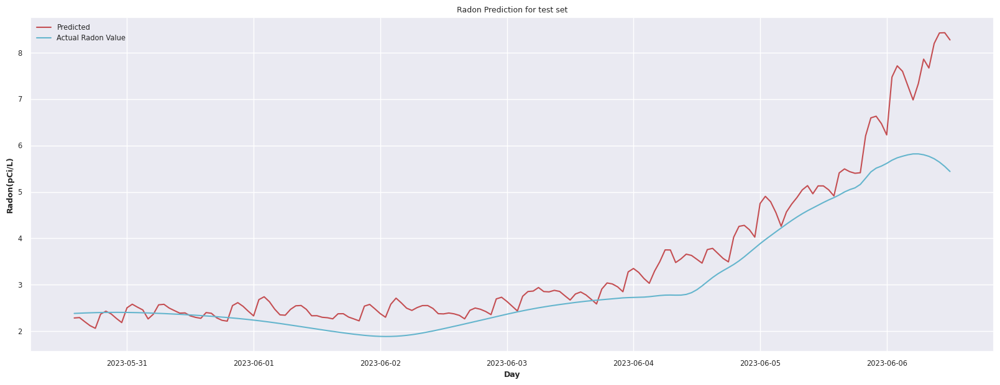

In [104]:
# plot the forecast
plt.figure(100, figsize=(20, 7))
plt.plot(dfY.index, dfY['Predicted'], color='r', label='Predicted')
plt.plot(dfY.index, dfY['Actual'], color='c', label='Actual Radon Value')
plt.legend()
plt.title('Radon Prediction for test set')
plt.xlabel('Day')
plt.ylabel('Radon(pCi/L)')
plt.show()